<a href="https://colab.research.google.com/github/Summorox/AI-Stock-Prediction-Experiment-Uni/blob/main/IA_Stock_Prediction_Experiment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Enviroment config (Install packages and restart runtime)

In [ ]:
#!pip install --upgrade numba.np.random
!pip install --upgrade statsmodels
!pip install --upgrade statsmodels.api
!pip install --upgrade yfinance
!pip install statsforecast
!pip install --upgrade plotly
  #!pip install --upgrade pandas_datareader
  #!pip install --upgrade --upgrade xgboost
!pip install matplotlib==3.1.1
  #!pip install --upgrade imbalanced-learn
  #!pip install --upgrade numba
  #!pip install --upgrade numpy
!pip install --upgrade scikit-learn
  #!pip install --upgrade cipy
  #!pip install --upgrade scipy
  #!pip install --upgrade ellowbrick
!pip install --upgrade --pre pycaret #!pip install pycaret[full]
!pip install --upgrade google.colab

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 36.8 MB/s eta 0:00:00
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.12.2
    Uninstalling statsmodels-0.12.2:
      Successfully uninstalled statsmodels-0.12.2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement statsmodels.api (from versions: none)
ERROR: No matching distribution found for statsmodels.api
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.2/59.2 KB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 KB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 KB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.4

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.8/9.8 MB 70.3 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.0.2
    Uninstalling scikit-learn-1.0.2:
      Successfully uninstalled scikit-learn-1.0.2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.1/480.1 KB 23.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.0/213.0 KB 27.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 KB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 KB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 85.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.2/280.2 KB 28.3 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#@title import packages

#@markdown We need to import all the correct libs to perform the models.
import pandas as pd
import yfinance as yfin
#import numba
#from markupsafe import escape
import sklearn
import statsmodels
import statsmodels.api as sm
from statsmodels import regression
import plotly
import plotly.express as px
#from sklearn.cluster import KMeans
#from pandas_datareader import data
#import pandas_datareader
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
#from pycaret.classification import *
#import plotly.io as pio
#pio.renderers.default = "colab"
#from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
pd.set_option('display.max_columns', None)
from pycaret.time_series import *
import datetime
import functools as ft
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from google.colab import files
import os

# Sample

In [ ]:
#@title Scrap data from Wikipedia
#@markdown First, To proceed with that, we need to collect the stocks from SP 500. Through a simple web scrap, we are going to collect SP500 values  from Wikipedia page.

def returnstocks():
    table=pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')
    stocksdf = table[0]
    return stocksdf

def eachstock():
  myList = ['^GSPC']
  for stick in returnstocks()['Symbol'].unique():
    myList.insert(0, stick)
  return myList

def eachSector():
  myList = []
  for stick in returnstocks()['GICS Sector'].unique():
    myList.insert(0, stick)
  return myList

def getStocksFromSector(sector):
  df = returnstocks()
  myList=df['Symbol'][df['GICS Sector'] == sector]
  return myList

# Explore

In [ ]:
#@title Sectors grouped per sector
#@markdown Based on the list of the SP 500, we were able to check the principal sectors
#@markdown seeing that, we are going to check every stock
fig = px.histogram(returnstocks(), x="GICS Sector")
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show(renderer="colab")

In [ ]:
#@title Sectors grouped per subsectors
#@markdown Based on the list of the SP 500, we were able to check the principal sectors
#@markdown seeing that, we are going to check every stock
fig = px.histogram(returnstocks(), x="GICS Sub-Industry")
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show(renderer="colab")

In [ ]:
#@title Sectors grouped per headquarters
#@markdown Based on the list of the SP 500, we were able to check the principal sectors
#@markdown seeing that, we are going to check every stock
fig = px.histogram(returnstocks(), x="Headquarters Location")
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show(renderer="colab")

In [ ]:
#@title Sectors grouped per founding year
#@markdown Based on the list of the SP 500, we were able to check the principal sectors
#@markdown seeing that, we are going to check every stock
fig = px.histogram(returnstocks().sort_values(by='Founded'), x="Founded")
fig.update_layout(barmode='stack')
fig.show(renderer="colab")

In [ ]:
#@title SP500 index ploted
#@markdown plot the volatilty of each oone by time, can check covid and other things like ukraine war
#@markdown Changed this due to stock returns error, added missing parameters to function call
Previous_year = datetime.datetime.today() - datetime.timedelta(days=365*6)
actual_year = datetime.datetime.today()
tickers = ['^GSPC','A']

pd.options.plotting.backend = "plotly"
stock_returns_perc = stockdoublebench_returns(tickers, Previous_year.strftime('%Y-%m-%d'), actual_year.strftime ('%Y-%m-%d'))

stock_returns_perc
fig = stock_returns_perc.plot()
fig.show(renderer="colab")

[*********************100%***********************]  2 of 2 completed


# Modify


In [ ]:
#@title Data normalization

stockdfs = pd.DataFrame()
def datenormalization(stockdf):
  global stockdfs
  stockdf = stockdf.groupby('Date').sum()
  stockdf = stockdf.asfreq(freq ='D');
  stockdfs = stockdf.ffill() #associate frequency by day to get hollidays
  stockdfs.sort_index(ascending=True, inplace=True)
  return pd.DataFrame(stockdfs)

obj = '' #global variable
def scaler_fit(series):
  global obj
  scaler = MinMaxScaler()
  obj = scaler.fit(series)
  return obj

def min_max_fit(series): #normalization
  scaler_fit(series)
  scaler = MinMaxScaler()
  series[list(series.columns)] = scaler.fit_transform(series)
  return series

def min_max_inverse(series, obj): #denormalization
  series[list(series.columns)] = obj.inverse_transform(series)
  return series

In [ ]:
#@title Run this for After and Before MinMax + Autocorrelation
tickers = ['^GSPC']
stock_returns_perc = stockdoublebench_returns(tickers,'2015-01-01', '2022-12-01')
stock_returns_perc

[*********************100%***********************]  1 of 1 completed


Date
2015-01-02 00:00:00-05:00    2058.199951
2015-01-05 00:00:00-05:00    2020.579956
2015-01-06 00:00:00-05:00    2002.609985
2015-01-07 00:00:00-05:00    2025.900024
2015-01-08 00:00:00-05:00    2062.139893
                                ...     
2022-11-23 00:00:00-05:00    4027.260010
2022-11-25 00:00:00-05:00    4026.120117
2022-11-28 00:00:00-05:00    3963.939941
2022-11-29 00:00:00-05:00    3957.629883
2022-11-30 00:00:00-05:00    4080.110107
Name: Adj Close, Length: 1993, dtype: float64

In [ ]:
dfs = min_max_fit(datenormalization(stockdoublebench_returns('^GSPC', '2015-01-01', '2022-12-01')))

dfs

[*********************100%***********************]  1 of 1 completed


,Adj Close
Date,
2015-01-02 00:00:00-05:00,0.077210
2015-01-03 00:00:00-05:00,0.077210
2015-01-04 00:00:00-05:00,0.077210
2015-01-05 00:00:00-05:00,0.064533
2015-01-06 00:00:00-05:00,0.058477
...,...
2022-11-26 00:00:00-05:00,0.740372
2022-11-27 00:00:00-05:00,0.740372
2022-11-28 00:00:00-05:00,0.719418


In [ ]:
#@title After and before minmax
import plotly.express as px
df = px.data.tips()
figx = px.box(dfs, points="all")
figy = px.box(stock_returns_perc, points="all")

figx.show()
figy.show()

In [ ]:
#@title Yahoo Finance request and beta/Alpha calculation

#@markdown For this step, we are using the component from Wikipedia, and we are going to introduce a new agent, the yahoo finance. Yahoo Finance, has hot data from https://finance.yahoo.com, and we can use these data to improve our power to decision making, regarding to create a stocks portfolio.
tickersgspc = ['^GSPC']
yfin.pdr_override() #override method from pandas_datareader by importing data as pdr
#tickers = ['ZTS', 'ZION', '^GSPC']

tickers = eachstock();
tickers.remove('BF.B')
tickers.remove('BRK.B')

#function for receive list of stocks, source where to search and initial date/lastdate
def stockdoublebench_returns(ticker, initialdate, lastdate): #future change ticker for returnstocks()['Symbol'].unique()
    global stockdouble
    stockdouble = yfin.download(ticker, initialdate, lastdate) #data = yf.download("SPY AAPL", period="max",)
    return stockdouble['Adj Close']

stockdouble_min = pd.DataFrame()
stockdouble_high = pd.DataFrame()

def stockdoublebench_min_max(ticker, initialdate, lastdate): #future change ticker for returnstocks()['Symbol'].unique()
    global stockdouble_high
    global stockdouble_min
    stockdouble = yfin.download(ticker, initialdate, lastdate) #data = yf.download("SPY AAPL", period="max",)
    stockdouble_high = stockdouble['High'].max()
    stockdouble_min = stockdouble['Low'].min()
    stockdouble_high = pd.DataFrame(stockdouble_high, columns=['High'])
    stockdouble_high.reset_index(inplace=True)
    stockdouble_high = stockdouble_high.rename(columns = {'index':'stocks'})
    stockdouble_min = pd.DataFrame(stockdouble_min,  columns=['Low'])
    stockdouble_min.reset_index(inplace=True)
    stockdouble_min = stockdouble_min.rename(columns = {'index':'stocks'})
    minmax = pd.merge(stockdouble_high, stockdouble_min, on=['stocks'])
    return minmax

#stockdoublebench_returns #run just this command to check the volatility of each one.
def stockdoublebench_percent(ticker, initialdate, lastdate): #future change ticker for returnstocks()['Symbol'].unique()
    stockdoublepercent = yfin.download(ticker, initialdate, lastdate)
    #return stockdouble['Adj Close']] #add this line to use the graph to compare the volatility
    return stockdoublepercent['Adj Close'].pct_change()[1:]

#alpha, beta and stock
abstocks = pd.DataFrame(columns=['Alpha', 'Beta', 'stocks']) #created dataframe

def alphabetastock(df, index): #Function for generate alpha and beta from stocks
    global abstocks
    abstocks = abstocks[0:0]
    for col in df: #for column in dataframe do
        x = sm.add_constant(df[index].values) #create a matrix using 1 and the value
        model = sm.regression.linear_model.OLS(df[col].values,x).fit() #linear regression to get values https://www.statsmodels.org/dev/generated/statsmodels.regression.linear_model.OLS.html
        abstocks.loc[len(abstocks.index)] = [model.params[0], model.params[1], col] #add each value to the dataframe
    return abstocks #model.params[0], model.params[1], col

In [ ]:
tickers

['ZTS',
 'ZION',
 'ZBH',
 'ZBRA',
 'YUM',
 'XYL',
 'XEL',
 'WYNN',
 'GWW',
 'WTW',
 'WMB',
 'WHR',
 'WY',
 'WRK',
 'WDC',
 'WST',
 'WELL',
 'WFC',
 'WEC',
 'WAT',
 'WM',
 'WBD',
 'WMT',
 'WBA',
 'WAB',
 'VMC',
 'V',
 'VICI',
 'VTRS',
 'VFC',
 'VRTX',
 'VZ',
 'VRSK',
 'VRSN',
 'VTR',
 'VLO',
 'UHS',
 'UNH',
 'URI',
 'UPS',
 'UAL',
 'UNP',
 'ULTA',
 'UDR',
 'USB',
 'TSN',
 'TYL',
 'TFC',
 'TRMB',
 'TRV',
 'TDG',
 'TT',
 'TSCO',
 'TJX',
 'TMO',
 'TXT',
 'TXN',
 'TSLA',
 'TER',
 'TFX',
 'TDY',
 'TEL',
 'TGT',
 'TRGP',
 'TPR',
 'TTWO',
 'TROW',
 'TMUS',
 'SYY',
 'SNPS',
 'SYF',
 'SIVB',
 'SYK',
 'STE',
 'STLD',
 'STT',
 'SBUX',
 'SWK',
 'LUV',
 'SO',
 'SEDG',
 'SNA',
 'SJM',
 'SWKS',
 'SPG',
 'SBNY',
 'SHW',
 'NOW',
 'SRE',
 'SEE',
 'STX',
 'SLB',
 'SBAC',
 'CRM',
 'SPGI',
 'RCL',
 'ROST',
 'ROP',
 'ROL',
 'ROK',
 'RHI',
 'RMD',
 'RSG',
 'RF',
 'REGN',
 'REG',
 'O',
 'RTX',
 'RJF',
 'RL',
 'DGX',
 'QCOM',
 'PWR',
 'QRVO',
 'PHM',
 'PSA',
 'PTC',
 'PEG',
 'PRU',
 'PLD',
 'PGR',
 'PG',
 'PFG'

# Model


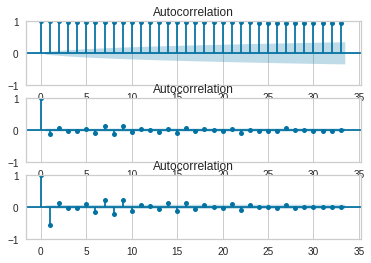

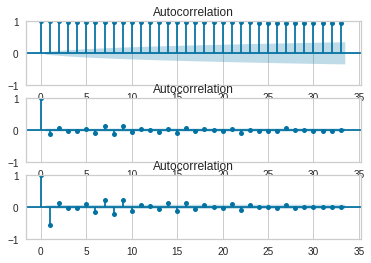

In [ ]:
#@title Autocorrelation

fig, (ax1, ax2, ax3) = plt.subplots(3)
plot_acf(stock_returns_perc, ax=ax1)
plot_acf(stock_returns_perc.diff().dropna(), ax=ax2)
plot_acf(stock_returns_perc.diff().diff().dropna(), ax=ax3)

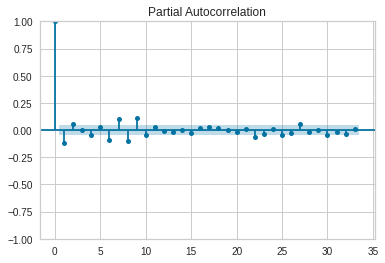

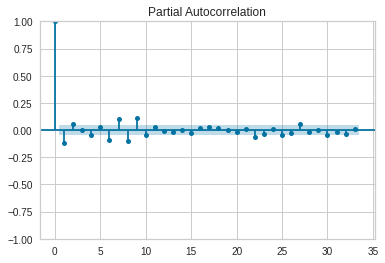

In [ ]:
#@title Partial-Autocorrelation


plot_pacf(stock_returns_perc.diff().dropna())

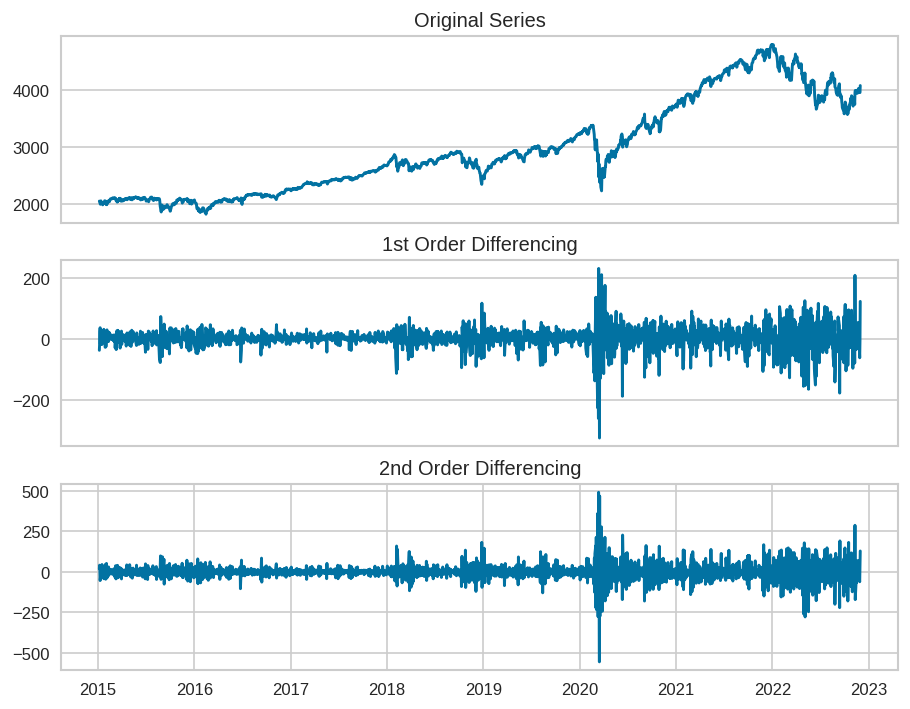

In [ ]:
#@title Finding the value of the d-parameter
#@markdown There is no such method that can tell us how much value of d will be optimal. However, the value of differencing can be optimal till 2 so we will try our time series in both. Pandas provide this option of differencing. Let’s utilize this.

plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})

# Original Series
fig, (ax1, ax2, ax3) = plt.subplots(3)
ax1.plot(stock_returns_perc); ax1.set_title('Original Series'); ax1.axes.xaxis.set_visible(False)
# 1st Differencing
ax2.plot(stock_returns_perc.diff()); ax2.set_title('1st Order Differencing'); ax2.axes.xaxis.set_visible(False)
# 2nd Differencing
ax3.plot(stock_returns_perc.diff().diff()); ax3.set_title('2nd Order Differencing')
plt.show()

#Here we can see how the time series has become stationary.
#One thing which is noticeable here is in first-order differencing we have
#fewer noises in the data while after 1st order there is an increase in the noise.
#So we can select 1st order differencing for our model. We can also verify this using an autocorrelation plot.

In [ ]:
 #@title Engineering All to Predict Stocks
 ##@markdown Engineering to predict all 500 stocks
#from google.colab import output
#output.enable_custom_widget_manager()

pred_unseen_deno = pd.DataFrame() ; pred_unseen_deno[0:0]
dffdstocks = pd.DataFrame() ; dffdstocks[0:0]
dffdstockar = pd.DataFrame() ; dffdstockar[0:0]
transpredicted = pd.DataFrame() ; transpredicted[0:0]
transpredicted_custom = pd.DataFrame() ; transpredicted_custom[0:0]
abstocksna = pd.DataFrame(); abstocksna.iloc[0:0]
metrics_default = pd.DataFrame() ; metrics_default.iloc[0:0]
metrics_custom = pd.DataFrame() ; metrics_custom.iloc[0:0]
#abstocks  = pd.DataFrame(); abstocks.iloc[0:0]

def train_and_normalize(stock, initialdate, finaldate, predictdays, predictdaysx, crossvalidation, custom, default):
  global pred_unseen_deno
  global transpredicted
  global transpredicted_def
  global metrics_default
  global metrics_custom

  stock_returns = datenormalization(stockdoublebench_returns(stock, initialdate, finaldate))
  print("ARIMA")
  exp = setup(min_max_fit(stock_returns[['Adj Close']]), fh = predictdays, fold  = crossvalidation, session_id = 123, n_jobs=-1 ,max_sp_to_consider=1) #n_jobs=None, sp_detection=index
  arima = exp.create_model('arima')
  metrics_custom = pull().loc[['Mean']].rename(lambda x: x + custom, axis='columns')
  metrics_custom['stocks'] = stock
  finalize_model = exp.finalize_model(arima)
  pred_unseen_deno = min_max_inverse(predict_model(finalize_model,  fh = predictdaysx), obj)
  transpredicted = pred_unseen_deno.T
  transpredicted['stocks'] = stock
  metrics_custom.reset_index(drop=True, inplace=True)
  transpredicted.reset_index(drop=True, inplace=True)
  transpredicted = pd.merge(transpredicted, metrics_custom, on=['stocks'])
  print(exp)
  print(stock)
  print(finalize_model)
  transpredicted['Variation Arima'] = transpredicted.iloc[:,predictdaysx-1] - transpredicted.iloc[:,0]

  return transpredicted

def iterate_predicted_stocks(initialdate, finaldate, predictdays, predictdaysx, crossvalidation, custom, default):
  global dffdstocks
  global dffdstockar

  for value in (abstocksna['stocks']):
    try:
      train_and_normalize(value, initialdate, finaldate, predictdays, predictdaysx, crossvalidation, custom, default)
      dffdstocks = dffdstocks.append(transpredicted, ignore_index = True)
    except:
      continue
  return dffdstocks

#configuration
previous_5years = datetime.datetime.today() - datetime.timedelta(days=365*5)
previous_year = datetime.datetime.today()- datetime.timedelta(days=365)
actual_year = datetime.datetime.today()
abstocks = alphabetastock(stockdoublebench_percent(tickers, previous_5years.strftime('%Y-%m-%d'), actual_year.strftime ('%Y-%m-%d')),'^GSPC')
abstocksna = abstocks.dropna()
#iterate_predicted_stocks(Previous_year.strftime('%Y-%m-%d'), actual_year.strftime ('%Y-%m-%d'), 30, 7, 5, '-Arima', '-AutoArima')
iterate_predicted_stocks(previous_5years.strftime('%Y-%m-%d'), '2023-02-11', 30, 7, 5, '-Arima', '-AutoArima')

stockhighlow = stockdoublebench_min_max(tickers, previous_year, actual_year)

#add values the last value at this point
originstockdf = returnstocks()
originstockdf = originstockdf.rename(columns={'Symbol': 'stocks'})

originstockdf = originstockdf.set_index('stocks')
stockhighlow = stockhighlow.set_index('stocks')
dffdstocks = dffdstocks.set_index('stocks')
abstocksna = abstocksna.set_index('stocks')

dfs = [stockhighlow, dffdstocks, abstocksna, originstockdf]
df_final = ft.reduce(lambda left, right: pd.merge(left, right, on='stocks'), dfs)

#normalize dataframe output
df_final.index.name = None
df_final = df_final.rename_axis('stocks').reset_index()
df_final

[*********************100%***********************]  502 of 502 completed
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.2795,2.8858,0.0312,0.0357,0.0504,0.0505,0.0201
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.0796,4.8079,0.0526,0.0609,0.0965,0.0906,-2.8414
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.3520,6.6092,0.0700,0.0842,0.1054,0.1135,-1.7519
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.0013,4.0060,0.0458,0.0520,0.0577,0.0598,-1.2611
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.4364,3.3705,0.0421,0.0447,0.0559,0.0543,-2.7291
Mean,nan,6.4297,4.3359,0.0483,0.0555,0.0732,0.0737,-1.7127
SD,nan,1.7179,1.3065,0.0128,0.0166,0.0230,0.0244,1.0503


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

A
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.0386,3.2997,0.0424,0.0463,0.4338,0.3420,-8.8579
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.2248,2.8864,0.0353,0.0402,0.4972,0.3733,-5.0747
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",0.8016,0.5867,0.0067,0.0081,0.0604,0.0629,0.3572
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.5206,2.3085,0.0290,0.0318,0.2731,0.2340,-15.7984
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.1940,2.7120,0.0343,0.0371,0.4164,0.3324,-3.4341
Mean,nan,3.5559,2.3587,0.0295,0.0327,0.3362,0.2689,-6.5616
SD,nan,1.4588,0.9414,0.0122,0.0132,0.1562,0.1131,5.4855


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AAL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.5524,7.8242,0.1106,0.1249,0.1809,0.1620,-1.0760
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.9828,3.3462,0.0482,0.0544,0.0920,0.0868,-3.5206
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.0478,4.4173,0.0587,0.0717,0.0885,0.0945,-1.5313
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",19.5527,12.3086,0.1907,0.2005,0.4244,0.3433,-8.4561
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.3042,1.5833,0.0226,0.0264,0.0519,0.0518,0.1320
Mean,nan,8.8880,5.8959,0.0861,0.0956,0.1675,0.1477,-2.8904
SD,nan,6.1237,3.7981,0.0596,0.0615,0.1352,0.1041,3.0215


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AAP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.6915,6.4240,0.0636,0.0761,0.0759,0.0719,-1.6068
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.0887,4.8984,0.0472,0.0588,0.0647,0.0615,-1.1150
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.6009,3.7397,0.0378,0.0454,0.0493,0.0505,-0.2396
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.5557,1.9005,0.0177,0.0239,0.0238,0.0233,-0.1135
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",11.6896,6.8143,0.0816,0.0857,0.1257,0.1175,-7.3758
Mean,nan,7.3253,4.7554,0.0496,0.0580,0.0679,0.0649,-2.0901
SD,nan,3.1757,1.8014,0.0218,0.0220,0.0338,0.0309,2.7001


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AAPL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.6574,3.2664,0.0292,0.0358,0.0426,0.0412,-1.9427
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.4637,2.8951,0.0281,0.0318,0.0389,0.0396,-0.7615
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.3671,3.7488,0.0345,0.0420,0.0441,0.0455,-2.1488
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",11.9678,7.6395,0.0775,0.0863,0.0872,0.0922,-4.2376
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.4592,2.2589,0.0225,0.0255,0.0253,0.0249,-1.3045
Mean,nan,5.9831,3.9618,0.0383,0.0443,0.0476,0.0487,-2.0790
SD,nan,3.0539,1.9022,0.0199,0.0217,0.0209,0.0228,1.1848


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ABBV
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.7609,1.9619,0.0235,0.0277,0.0314,0.0308,-0.5902
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.5032,1.8189,0.0214,0.0258,0.0324,0.0318,-0.6174
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.5066,8.8240,0.1076,0.1256,0.1283,0.1402,-2.5798
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",13.9094,9.3146,0.1208,0.1334,0.1279,0.1385,-4.8918
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.7995,1.2977,0.0158,0.0187,0.0170,0.0169,-0.0385
Mean,nan,6.6959,4.6434,0.0578,0.0662,0.0674,0.0717,-1.7435
SD,nan,5.3449,3.6238,0.0463,0.0518,0.0498,0.0555,1.7953


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ABC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.3981,4.4762,0.0549,0.0658,0.0960,0.0897,-1.8417
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.3181,3.5878,0.0458,0.0529,0.0871,0.0822,-2.7166
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.6383,3.0357,0.0400,0.0447,0.0791,0.0756,-1.0251
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.2948,2.3850,0.0287,0.0355,0.0472,0.0488,-1.5571
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7321,1.9273,0.0239,0.0287,0.0368,0.0373,-0.4452
Mean,nan,4.4763,3.0824,0.0387,0.0455,0.0692,0.0667,-1.5171
SD,nan,1.3316,0.8968,0.0113,0.0130,0.0231,0.0202,0.7664


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ABT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.6588,1.0987,0.0124,0.0147,0.0219,0.0218,0.2370
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.5215,3.4157,0.0336,0.0454,0.0644,0.0612,-0.3405
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",18.5981,13.0093,0.1414,0.1765,0.1781,0.2056,-1.9450
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.3121,4.8011,0.0568,0.0673,0.0647,0.0678,-2.9574
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",8.2539,5.0084,0.0644,0.0702,0.0672,0.0700,-6.1412
Mean,nan,8.0689,5.4667,0.0617,0.0748,0.0793,0.0853,-2.2294
SD,nan,5.7471,4.0207,0.0438,0.0546,0.0522,0.0627,2.2611


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ACGL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.0846,7.1734,0.0716,0.0835,0.1262,0.1160,-2.3740
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.9450,5.4092,0.0581,0.0632,0.1259,0.1170,-4.7468
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.4866,5.7169,0.0557,0.0671,0.1059,0.1142,-1.6800
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.4738,1.8146,0.0165,0.0218,0.0282,0.0288,-0.5571
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",11.3084,6.6891,0.0760,0.0804,0.1572,0.1444,-6.9630
Mean,nan,8.4597,5.3606,0.0556,0.0632,0.1087,0.1041,-3.2642
SD,nan,3.1960,1.8844,0.0210,0.0221,0.0435,0.0392,2.3026


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ACN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.1747,6.9996,0.0960,0.1073,0.2527,0.2172,-3.1916
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",18.0801,10.3547,0.1557,0.1591,0.8282,0.5756,-19.9830
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.6677,2.5635,0.0317,0.0399,0.1280,0.1384,-0.4084
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.6737,1.1273,0.0145,0.0176,0.0523,0.0504,-1.2064
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",0.7251,0.5772,0.0063,0.0090,0.0222,0.0218,-0.1859
Mean,nan,7.0643,4.3245,0.0608,0.0666,0.2567,0.2007,-4.9951
SD,nan,6.6185,3.7652,0.0569,0.0577,0.2966,0.1996,7.5685


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ADBE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",14.4844,9.4420,0.1646,0.1794,0.2352,0.2056,-4.1121
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.9217,2.0499,0.0334,0.0393,0.0557,0.0540,-0.1628
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.0726,3.6299,0.0469,0.0698,0.0703,0.0743,-0.3711
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.7058,2.5655,0.0433,0.0500,0.0528,0.0545,-1.7273
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.9483,2.5952,0.0463,0.0509,0.0589,0.0569,-2.5478
Mean,nan,5.8266,4.0565,0.0669,0.0779,0.0946,0.0891,-1.7842
SD,nan,4.3474,2.7412,0.0491,0.0517,0.0706,0.0587,1.4582


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ADI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.8302,3.4905,0.0283,0.0368,0.0322,0.0331,-1.3635
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.2310,3.9857,0.0313,0.0428,0.0405,0.0391,-0.5741
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.2290,7.0864,0.0684,0.0779,0.0738,0.0764,-0.7312
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.0275,3.3563,0.0314,0.0379,0.0326,0.0333,-0.3743
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.7018,4.6963,0.0360,0.0539,0.0424,0.0406,-0.2147
Mean,nan,6.4039,4.5230,0.0391,0.0499,0.0443,0.0445,-0.6516
SD,nan,2.4299,1.3651,0.0149,0.0153,0.0153,0.0162,0.3967


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ADM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.2983,4.2459,0.0479,0.0579,0.0570,0.0548,-0.4538
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.8545,1.8419,0.0218,0.0252,0.0287,0.0283,-0.4260
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.8100,5.2126,0.0604,0.0718,0.0726,0.0763,-2.2549
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",9.4250,5.8736,0.0743,0.0824,0.0776,0.0814,-5.5265
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",15.2051,8.8718,0.1208,0.1252,0.1443,0.1338,-11.5261
Mean,nan,8.3186,5.2092,0.0651,0.0725,0.0760,0.0749,-4.0375
SD,nan,4.0705,2.2857,0.0328,0.0326,0.0381,0.0349,4.1799


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ADP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.7831,5.0250,0.0833,0.0929,0.2007,0.1778,-3.2678
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.8650,3.7025,0.0628,0.0683,0.1820,0.1639,-5.3479
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.6894,3.6927,0.0502,0.0680,0.1124,0.1241,-0.9108
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",9.1575,5.6988,0.0990,0.1064,0.2556,0.2221,-4.6470
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.9880,2.4999,0.0434,0.0467,0.1295,0.1203,-4.1877
Mean,nan,6.2966,4.1238,0.0678,0.0765,0.1760,0.1616,-3.6722
SD,nan,1.9232,1.1219,0.0207,0.0209,0.0513,0.0375,1.5371


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ADSK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.4114,2.1514,0.0335,0.0402,0.0348,0.0357,-0.8197
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",14.9043,9.6372,0.1474,0.1806,0.2250,0.1907,-1.3749
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.0461,4.4674,0.0713,0.0850,0.1039,0.1119,-2.1748
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",9.4366,5.5842,0.0964,0.1068,0.1175,0.1265,-5.8208
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.1371,1.5453,0.0219,0.0295,0.0264,0.0259,-0.9829
Mean,nan,7.3871,4.6771,0.0741,0.0884,0.1015,0.0981,-2.2346
SD,nan,4.5650,2.8864,0.0453,0.0541,0.0716,0.0611,1.8532


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AEE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.5491,1.7315,0.0262,0.0327,0.0271,0.0274,-0.1763
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",17.1579,11.4026,0.1778,0.2162,0.2809,0.2298,-1.4629
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.6961,4.2964,0.0714,0.0835,0.1056,0.1133,-2.2883
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",9.7424,6.1420,0.1050,0.1201,0.1267,0.1378,-3.7566
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.5594,2.3107,0.0386,0.0452,0.0472,0.0458,-2.1119
Mean,nan,7.9410,5.1766,0.0838,0.0995,0.1175,0.1108,-1.9592
SD,nan,5.2539,3.4800,0.0544,0.0659,0.0895,0.0722,1.1651


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AEP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.7540,5.2650,0.0676,0.0815,0.0788,0.0835,-3.2529
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.8224,7.2330,0.0953,0.1127,0.1322,0.1205,-2.1068
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.8044,6.7183,0.0881,0.1068,0.1031,0.1104,-1.2477
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.3090,2.1670,0.0302,0.0350,0.0314,0.0320,-1.8654
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.8988,3.2235,0.0356,0.0520,0.0397,0.0380,-0.4415
Mean,nan,7.1177,4.9214,0.0634,0.0776,0.0770,0.0769,-1.7829
SD,nan,3.0403,1.9576,0.0265,0.0303,0.0379,0.0363,0.9336


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AES
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.9021,3.3353,0.0345,0.0427,0.0476,0.0459,-1.1405
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.5496,3.6232,0.0391,0.0464,0.0586,0.0562,-2.0721
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.8155,9.5515,0.0985,0.1230,0.1160,0.1271,-1.9434
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.6890,2.9061,0.0337,0.0377,0.0353,0.0361,-2.6804
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0197,2.5725,0.0290,0.0334,0.0303,0.0307,-0.6490
Mean,nan,6.5952,4.3977,0.0470,0.0566,0.0576,0.0592,-1.6971
SD,nan,3.6430,2.6018,0.0260,0.0335,0.0309,0.0351,0.7178


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AFL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.6651,3.9425,0.0566,0.0658,0.0756,0.0719,-2.4009
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.8871,4.8525,0.0691,0.0812,0.1037,0.0967,-1.9573
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.3868,7.3508,0.1050,0.1236,0.1246,0.1360,-2.7254
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.4355,2.5782,0.0347,0.0433,0.0368,0.0378,-2.1216
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.7746,1.3112,0.0178,0.0219,0.0182,0.0184,-1.4209
Mean,nan,5.6298,4.0071,0.0566,0.0672,0.0718,0.0722,-2.1252
SD,nan,2.9627,2.0596,0.0299,0.0346,0.0398,0.0418,0.4383


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AIG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.3939,2.2400,0.0292,0.0351,0.0389,0.0385,0.1203
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.6329,4.5182,0.0661,0.0711,0.1058,0.0996,-5.2515
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.4556,9.8136,0.1263,0.1549,0.2851,0.2318,-1.4972
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.1773,1.3715,0.0195,0.0224,0.0438,0.0438,-0.1880
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.9289,3.4528,0.0530,0.0561,0.1249,0.1167,-9.5197
Mean,nan,6.7177,4.2792,0.0588,0.0679,0.1197,0.1061,-3.2673
SD,nan,4.3127,2.9659,0.0376,0.0466,0.0893,0.0698,3.6639


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AIZ
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.8493,2.8635,0.0216,0.0293,0.0249,0.0243,-0.3321
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.9063,6.6910,0.0617,0.0687,0.0771,0.0735,-3.9398
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.8228,5.5735,0.0507,0.0580,0.0578,0.0592,-0.2923
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",11.2939,6.7925,0.0670,0.0736,0.0692,0.0722,-4.8476
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.0778,3.1652,0.0304,0.0344,0.0335,0.0328,-2.7176
Mean,nan,7.9900,5.0171,0.0463,0.0528,0.0525,0.0524,-2.4259
SD,nan,3.0246,1.6930,0.0176,0.0179,0.0202,0.0203,1.8535


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AJG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.3946,2.8634,0.0563,0.0655,0.1098,0.1021,-0.9465
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.0395,5.0100,0.1031,0.1143,0.2800,0.2375,-4.3956
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.2177,4.1327,0.0802,0.0944,0.1706,0.1916,-1.9111
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.3095,1.4972,0.0300,0.0343,0.0581,0.0561,-0.8481
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.5944,3.9325,0.0853,0.0897,0.2048,0.1837,-9.4069
Mean,nan,5.5111,3.4871,0.0710,0.0796,0.1647,0.1542,-3.5017
SD,nan,1.9780,1.2069,0.0254,0.0275,0.0766,0.0656,3.2178


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AKAM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.1389,3.8022,0.0418,0.0495,0.0505,0.0503,-0.0378
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.9647,6.3894,0.0765,0.0845,0.0958,0.0904,-3.0132
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.2278,8.4826,0.0955,0.1160,0.1104,0.1184,-0.9497
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",23.2908,12.8968,0.1727,0.1820,0.2162,0.1926,-8.2236
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",14.5648,8.1080,0.1102,0.1166,0.1746,0.1588,-6.8942
Mean,nan,13.6374,7.9358,0.0994,0.1097,0.1295,0.1221,-3.8237
SD,nan,5.6140,2.9806,0.0432,0.0438,0.0588,0.0500,3.2261


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ALB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.9797,3.6308,0.0534,0.0583,0.2770,0.2366,-5.4909
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.1093,3.2296,0.0456,0.0517,0.3535,0.2862,-3.3753
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.5995,2.4732,0.0319,0.0394,0.4006,0.3000,-1.6709
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.8953,2.8681,0.0436,0.0458,0.4683,0.3704,-12.4251
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.2736,1.6085,0.0201,0.0255,0.1511,0.1696,-1.0008
Mean,nan,4.3715,2.7620,0.0389,0.0441,0.3301,0.2726,-4.7926
SD,nan,1.2963,0.6926,0.0116,0.0112,0.1091,0.0670,4.1201


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ALGN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.1470,2.6492,0.0566,0.0617,0.1342,0.1242,-4.4166
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.0071,3.9977,0.0817,0.0926,0.2407,0.2076,-3.4507
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.7626,1.3178,0.0240,0.0305,0.0586,0.0598,0.3319
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.5079,1.7698,0.0340,0.0408,0.0775,0.0733,-4.0026
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.8281,2.5126,0.0516,0.0575,0.1316,0.1214,-3.0180
Mean,nan,3.6506,2.4494,0.0496,0.0566,0.1285,0.1173,-2.9112
SD,nan,1.4630,0.9147,0.0199,0.0213,0.0634,0.0519,1.6898


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ALK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.6478,2.5019,0.0393,0.0480,0.0527,0.0509,-0.2737
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.0972,5.6192,0.0988,0.1085,0.1186,0.1275,-5.9890
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.9267,5.4649,0.0872,0.1065,0.1161,0.1065,-1.7029
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.3640,1.6160,0.0266,0.0331,0.0302,0.0309,-0.4940
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",10.0541,6.1700,0.1135,0.1261,0.1201,0.1295,-6.4546
Mean,nan,6.6179,4.2744,0.0731,0.0845,0.0875,0.0890,-2.9828
SD,nan,3.0523,1.8454,0.0340,0.0368,0.0383,0.0406,2.6930


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ALL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.9686,4.6632,0.0859,0.0996,0.2481,0.2115,-1.4910
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.4530,2.8039,0.0551,0.0601,0.2075,0.1841,-5.0274
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.1605,6.6420,0.1137,0.1423,0.2512,0.3025,-1.0634
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.6891,1.1385,0.0213,0.0248,0.0394,0.0387,0.0567
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.9758,2.5191,0.0502,0.0548,0.1067,0.1012,-0.7863
Mean,nan,5.2494,3.5533,0.0653,0.0763,0.1706,0.1676,-1.6623
SD,nan,2.5762,1.9097,0.0317,0.0407,0.0839,0.0910,1.7569


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ALLE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.8274,6.1278,0.0817,0.0911,0.1679,0.1516,-3.6026
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.4938,3.0956,0.0376,0.0461,0.0960,0.0893,-1.7026
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.8601,6.2603,0.0744,0.0932,0.1577,0.1751,-0.8372
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.6542,1.7615,0.0226,0.0265,0.0400,0.0390,-2.7174
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.2950,4.1250,0.0536,0.0621,0.1040,0.0972,-2.0724
Mean,nan,6.4261,4.2741,0.0540,0.0638,0.1131,0.1104,-2.1864
SD,nan,2.6635,1.7381,0.0221,0.0258,0.0463,0.0482,0.9333


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AMAT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.4778,2.7672,0.0423,0.0489,0.0499,0.0485,-0.3339
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.7009,5.6816,0.0928,0.1011,0.1337,0.1237,-3.8426
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.7097,3.0419,0.0456,0.0544,0.0600,0.0623,-1.0089
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.5873,5.2934,0.0842,0.0959,0.0961,0.1024,-5.0050
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.3582,2.0595,0.0329,0.0372,0.0388,0.0378,-2.6444
Mean,nan,6.1668,3.7687,0.0596,0.0675,0.0757,0.0749,-2.5670
SD,nan,2.4985,1.4447,0.0241,0.0260,0.0348,0.0328,1.7315


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AMCR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.3818,6.4307,0.0733,0.0853,0.1499,0.1357,-2.2602
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.4469,5.4469,0.0602,0.0727,0.1736,0.1534,-1.8402
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.7703,2.2771,0.0198,0.0304,0.0549,0.0578,-0.3156
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.2468,1.4114,0.0161,0.0189,0.0379,0.0387,-0.3106
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.4924,2.5664,0.0322,0.0343,0.0893,0.0849,-5.8030
Mean,nan,5.6676,3.6265,0.0403,0.0483,0.1011,0.0941,-2.1059
SD,nan,3.2071,1.9508,0.0226,0.0259,0.0527,0.0441,2.0096


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AMD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.8832,4.2988,0.0503,0.0641,0.0713,0.0673,-1.0879
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.7353,4.9216,0.0665,0.0736,0.1034,0.0972,-4.0860
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",15.3566,10.7380,0.1332,0.1612,0.1606,0.1806,-1.8367
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.5653,2.5287,0.0315,0.0385,0.0334,0.0342,-2.1505
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1204,2.0976,0.0276,0.0319,0.0301,0.0298,-0.5041
Mean,nan,7.1322,4.9169,0.0618,0.0738,0.0798,0.0818,-1.9330
SD,nan,4.4358,3.0958,0.0383,0.0463,0.0486,0.0551,1.2205


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AME
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.2845,1.6678,0.0237,0.0305,0.0358,0.0356,0.2366
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.7728,3.2979,0.0394,0.0606,0.0631,0.0677,-1.0329
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.7435,8.5389,0.1233,0.1576,0.1388,0.1556,-2.0314
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.7437,1.8105,0.0292,0.0339,0.0303,0.0309,-2.0077
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.1255,3.1279,0.0544,0.0584,0.0657,0.0634,-2.9159
Mean,nan,5.1340,3.6886,0.0540,0.0682,0.0667,0.0706,-1.5503
SD,nan,3.4459,2.5141,0.0362,0.0464,0.0387,0.0449,1.0739


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AMGN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.2624,3.7088,0.0367,0.0451,0.0524,0.0504,-1.5773
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.3945,4.0830,0.0379,0.0499,0.0585,0.0556,-1.2494
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.6855,9.9444,0.1046,0.1231,0.1266,0.1365,-0.7308
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.3671,1.7446,0.0173,0.0221,0.0195,0.0192,-0.8739
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.1247,3.8620,0.0448,0.0491,0.0532,0.0516,-3.8690
Mean,nan,6.7668,4.6686,0.0482,0.0579,0.0620,0.0627,-1.6601
SD,nan,4.1623,2.7676,0.0296,0.0341,0.0351,0.0392,1.1434


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AMP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.7364,4.3372,0.0685,0.0801,0.0887,0.0835,-1.4479
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",18.1415,11.5000,0.1859,0.2129,0.3901,0.3036,-2.6922
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.1689,4.3321,0.0641,0.0809,0.1318,0.1447,-0.7434
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.6737,1.7074,0.0281,0.0322,0.0519,0.0501,-2.4704
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.2768,1.5640,0.0239,0.0294,0.0431,0.0437,-0.1113
Mean,nan,7.1995,4.6882,0.0741,0.0871,0.1411,0.1251,-1.4930
SD,nan,5.7571,3.6137,0.0588,0.0667,0.1284,0.0961,0.9866


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AMT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.5096,4.7778,0.0811,0.0906,0.1538,0.1401,-3.0601
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.9344,4.3739,0.0753,0.0833,0.1877,0.1680,-3.5158
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.6996,5.9908,0.0948,0.1141,0.4051,0.3027,-0.5361
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.8614,3.6381,0.0649,0.0703,0.3135,0.2628,-6.6084
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0990,2.5313,0.0452,0.0487,0.3036,0.2569,-3.0271
Mean,nan,6.6208,4.2624,0.0723,0.0814,0.2727,0.2261,-3.3495
SD,nan,1.5586,1.1534,0.0166,0.0217,0.0911,0.0616,1.9365


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AMZN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.1601,2.7746,0.0373,0.0454,0.0489,0.0475,-0.1322
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.1176,3.9315,0.0551,0.0643,0.0827,0.0783,-1.2331
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",15.3143,10.0878,0.1401,0.1670,0.1791,0.2034,-2.0037
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.5483,3.5733,0.0520,0.0607,0.0582,0.0606,-2.4025
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",10.1043,6.0840,0.0952,0.1035,0.1307,0.1211,-3.7835
Mean,nan,8.2489,5.2902,0.0759,0.0882,0.0999,0.1022,-1.9110
SD,nan,4.0476,2.6370,0.0374,0.0438,0.0487,0.0564,1.2149


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ANET
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.4271,5.4427,0.0891,0.0987,0.2117,0.1868,-3.7458
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.1985,4.8278,0.0763,0.0875,0.2545,0.2146,-3.1031
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.4489,3.5361,0.0472,0.0640,0.1420,0.1591,-0.8619
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.8442,1.9003,0.0302,0.0345,0.0770,0.0734,-1.8752
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.9588,1.3080,0.0208,0.0237,0.0549,0.0538,-0.3017
Mean,nan,4.9755,3.4030,0.0527,0.0617,0.1480,0.1375,-1.9775
SD,nan,2.4810,1.6034,0.0262,0.0291,0.0763,0.0632,1.3006


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ANSS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.7375,4.3454,0.0535,0.0643,0.0704,0.0670,-1.7632
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.4414,2.7450,0.0355,0.0407,0.0502,0.0486,-2.3394
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.4112,2.5214,0.0276,0.0376,0.0361,0.0367,-0.3714
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.3120,4.3783,0.0604,0.0664,0.0695,0.0725,-6.1618
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0065,1.8018,0.0248,0.0272,0.0292,0.0288,-1.0946
Mean,nan,4.9817,3.1584,0.0404,0.0472,0.0511,0.0507,-2.3461
SD,nan,1.7420,1.0309,0.0142,0.0155,0.0168,0.0168,2.0182


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AON
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.4642,6.6934,0.0933,0.1076,0.2024,0.1778,-2.2714
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.6817,4.9631,0.0756,0.0798,0.2350,0.2072,-9.1076
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.9094,6.7012,0.0880,0.1078,0.2029,0.2360,-1.7660
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.9549,1.4242,0.0195,0.0232,0.0363,0.0368,-0.0734
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.5475,2.4449,0.0352,0.0396,0.0710,0.0710,-0.0683
Mean,nan,6.3115,4.4454,0.0623,0.0716,0.1495,0.1457,-2.6574
SD,nan,3.0062,2.1698,0.0296,0.0348,0.0799,0.0780,3.3445


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AOS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.2922,5.1311,0.0811,0.0885,0.1100,0.1173,-3.1482
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.8909,4.4816,0.0680,0.0777,0.0988,0.0952,-0.0457
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.2810,6.1538,0.0932,0.1084,0.1030,0.1099,-1.5936
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.9809,3.4616,0.0506,0.0617,0.0587,0.0562,-1.3066
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.5541,2.6768,0.0365,0.0479,0.0405,0.0419,-0.6867
Mean,nan,6.5998,4.3810,0.0659,0.0768,0.0822,0.0841,-1.3562
SD,nan,2.0993,1.2219,0.0204,0.0210,0.0274,0.0299,1.0426


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

APA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.8703,3.7800,0.0552,0.0644,0.0900,0.0847,-1.5314
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.4681,5.0633,0.0800,0.0863,0.1535,0.1407,-5.0332
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.3306,8.3465,0.1081,0.1429,0.1529,0.1739,-1.1857
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",11.5959,7.2098,0.1124,0.1254,0.1212,0.1309,-5.6109
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.5745,1.6126,0.0251,0.0281,0.0271,0.0267,-0.5513
Mean,nan,7.9679,5.2024,0.0762,0.0894,0.1090,0.1114,-2.7825
SD,nan,3.4120,2.4019,0.0328,0.0413,0.0472,0.0511,2.1052


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

APD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.0609,5.0793,0.0600,0.0726,0.0793,0.0749,-1.5441
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.7995,5.2908,0.0666,0.0759,0.1010,0.0946,-2.9246
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.0692,7.7042,0.0956,0.1116,0.1224,0.1326,-1.8774
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.9171,1.3649,0.0168,0.0202,0.0195,0.0197,-0.4031
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.4651,3.5847,0.0482,0.0532,0.0596,0.0576,-1.7534
Mean,nan,6.6624,4.6048,0.0574,0.0667,0.0764,0.0759,-1.7005
SD,nan,2.9941,2.0900,0.0256,0.0299,0.0354,0.0376,0.8050


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

APH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.4909,6.6776,0.0959,0.1026,0.2260,0.1995,-6.5024
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.1311,5.4240,0.0745,0.0835,0.2163,0.1897,-3.8651
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.4369,5.0670,0.0593,0.0781,0.1338,0.1488,-0.9571
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.6584,4.0887,0.0525,0.0635,0.1149,0.1055,-1.9466
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.1513,1.4556,0.0200,0.0226,0.0483,0.0471,-0.4380
Mean,nan,6.5737,4.5426,0.0605,0.0701,0.1479,0.1381,-2.7418
SD,nan,2.7635,1.7519,0.0251,0.0269,0.0663,0.0564,2.2149


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

APTV
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.4450,5.7756,0.0899,0.0995,0.1949,0.1734,-3.1644
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.6625,5.9129,0.0926,0.1021,0.2826,0.2394,-4.2546
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.6053,4.3067,0.0638,0.0744,0.1711,0.1879,-0.5658
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.8556,1.2544,0.0181,0.0219,0.0417,0.0417,-0.0136
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6722,1.7021,0.0262,0.0297,0.0656,0.0634,-0.8266
Mean,nan,6.0481,3.7903,0.0581,0.0655,0.1512,0.1412,-1.7650
SD,nan,3.2829,1.9751,0.0312,0.0339,0.0882,0.0759,1.6458


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ARE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.7762,2.5424,0.0505,0.0629,0.0549,0.0573,-3.3855
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.6678,6.9182,0.1428,0.1708,0.2261,0.1927,-1.1274
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.3331,4.2282,0.0864,0.1056,0.1249,0.1351,-1.2028
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",11.6115,6.9691,0.1603,0.1764,0.1709,0.1904,-8.1299
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0242,2.4818,0.0557,0.0628,0.0654,0.0628,-1.2913
Mean,nan,7.2826,4.6279,0.0991,0.1157,0.1284,0.1277,-3.0274
SD,nan,3.2867,1.9921,0.0449,0.0498,0.0644,0.0590,2.6877


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ATO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.2247,1.4502,0.0242,0.0282,0.0396,0.0385,-1.3888
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.4768,1.5455,0.0267,0.0299,0.0484,0.0469,-2.1054
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.0254,0.6725,0.0110,0.0129,0.0210,0.0208,-0.4659
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.7003,1.2436,0.0181,0.0237,0.0313,0.0322,-1.0619
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.1515,0.7341,0.0122,0.0139,0.0208,0.0206,-1.1949
Mean,nan,1.7158,1.1292,0.0184,0.0217,0.0322,0.0318,-1.2434
SD,nan,0.5716,0.3617,0.0063,0.0071,0.0107,0.0102,0.5299


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ATVI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.4499,3.1004,0.0441,0.0553,0.0667,0.0633,-1.0917
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",13.6771,8.3588,0.1364,0.1493,0.2772,0.2360,-4.1116
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.3562,2.5748,0.0339,0.0462,0.0855,0.0789,-0.8582
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.6454,1.1509,0.0168,0.0209,0.0394,0.0405,-0.7875
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.0966,3.0730,0.0519,0.0554,0.1392,0.1289,-5.3218
Mean,nan,5.6450,3.6516,0.0566,0.0654,0.1216,0.1095,-2.4341
SD,nan,4.1828,2.4580,0.0416,0.0438,0.0844,0.0696,1.9053


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AVB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.7741,5.7835,0.0651,0.0748,0.0930,0.0875,-2.6832
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.6110,5.2969,0.0574,0.0695,0.0968,0.0902,-1.6192
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.2539,5.2775,0.0553,0.0698,0.0863,0.0921,-1.1951
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.0942,2.9823,0.0316,0.0400,0.0414,0.0428,-1.5511
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1359,2.6129,0.0244,0.0352,0.0290,0.0299,-1.0203
Mean,nan,6.1738,4.3906,0.0468,0.0578,0.0693,0.0685,-1.6138
SD,nan,2.1701,1.3185,0.0158,0.0167,0.0283,0.0266,0.5788


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AVGO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.5159,5.4949,0.0718,0.0800,0.0951,0.0897,-3.3376
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.1797,7.4360,0.1032,0.1086,0.1679,0.1534,-8.3281
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.0581,3.7351,0.0434,0.0550,0.0645,0.0678,-1.6320
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.8902,3.1754,0.0427,0.0479,0.0554,0.0571,-0.9549
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.2771,2.6040,0.0287,0.0395,0.0383,0.0397,-1.2065
Mean,nan,6.7842,4.4891,0.0580,0.0662,0.0842,0.0815,-3.0918
SD,nan,3.1930,1.7632,0.0266,0.0252,0.0457,0.0394,2.7470


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AVY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.0733,2.8012,0.0346,0.0437,0.0505,0.0485,-0.8111
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",14.5121,8.9433,0.1240,0.1398,0.2367,0.2045,-2.8700
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.9673,6.3957,0.0863,0.1007,0.1427,0.1574,-2.8006
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.3084,4.1462,0.0553,0.0658,0.0773,0.0816,-2.5883
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1668,1.9507,0.0279,0.0310,0.0384,0.0381,-0.3704
Mean,nan,7.6056,4.8474,0.0656,0.0762,0.1091,0.1060,-1.8881
SD,nan,4.1747,2.5394,0.0356,0.0396,0.0733,0.0646,1.0724


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AWK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.7951,3.7909,0.0550,0.0655,0.0824,0.0778,-1.7929
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.8620,5.5792,0.0846,0.0966,0.1521,0.1382,-2.3345
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.6601,3.1818,0.0449,0.0553,0.0714,0.0749,-0.9907
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.5121,1.0461,0.0148,0.0183,0.0217,0.0219,-0.8275
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.8581,3.5652,0.0569,0.0621,0.0915,0.0868,-5.9939
Mean,nan,5.3375,3.4326,0.0512,0.0596,0.0838,0.0799,-2.3879
SD,nan,2.3662,1.4500,0.0225,0.0250,0.0418,0.0370,1.8840


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AXP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.4954,4.3696,0.0396,0.0433,0.0494,0.0484,-0.2385
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.5749,3.1232,0.0245,0.0313,0.0304,0.0310,-0.2849
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.2786,8.5488,0.0724,0.0866,0.0763,0.0806,-1.8658
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.7108,5.3894,0.0483,0.0556,0.0496,0.0513,-3.2511
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0828,2.1121,0.0173,0.0219,0.0189,0.0187,-0.3387
Mean,nan,7.4285,4.7086,0.0404,0.0477,0.0449,0.0460,-1.1958
SD,nan,3.5468,2.2173,0.0193,0.0225,0.0195,0.0210,1.1961


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AZO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.8748,2.6127,0.0380,0.0438,0.2083,0.1820,-4.5215
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.1309,3.4006,0.0501,0.0567,0.4992,0.3721,-4.4191
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.2227,3.3286,0.0410,0.0552,0.2159,0.2583,-0.7424
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.1221,0.7347,0.0108,0.0121,0.0450,0.0439,-0.1167
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.9661,1.8322,0.0189,0.0301,0.0577,0.0619,-0.1401
Mean,nan,3.2633,2.3818,0.0318,0.0396,0.2052,0.1836,-1.9879
SD,nan,1.4866,1.0003,0.0146,0.0167,0.1637,0.1228,2.0395


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.8083,3.2563,0.0468,0.0538,0.0877,0.0828,-2.2165
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.0445,4.8182,0.0686,0.0795,0.1561,0.1410,-1.7154
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.6681,8.2432,0.1245,0.1366,0.2041,0.2319,-5.0496
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.4555,5.2214,0.0637,0.0869,0.1178,0.1052,-0.9062
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.5271,1.8867,0.0249,0.0314,0.0476,0.0486,-0.2447
Mean,nan,6.7007,4.6852,0.0657,0.0777,0.1226,0.1219,-2.0265
SD,nan,3.3701,2.1372,0.0331,0.0354,0.0541,0.0627,1.6554


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BAC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.2547,2.0839,0.0318,0.0369,0.0841,0.0811,-0.1170
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.7019,7.6980,0.1243,0.1362,0.5133,0.3894,-5.2121
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.0870,1.9555,0.0205,0.0346,0.0729,0.0769,0.0645
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.9322,1.8732,0.0290,0.0333,0.0884,0.0834,-3.5827
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.2332,1.9649,0.0318,0.0348,0.1111,0.1048,-0.7282
Mean,nan,4.8418,3.1151,0.0475,0.0552,0.1739,0.1471,-1.9151
SD,nan,3.9528,2.2924,0.0386,0.0405,0.1701,0.1215,2.1077


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BALL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.7260,4.3009,0.0755,0.0881,0.2259,0.1950,-4.2742
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.1741,4.4032,0.0808,0.0904,0.2730,0.2327,-8.3825
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.5230,4.4320,0.0736,0.0908,0.3048,0.2436,-4.2796
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.0478,3.0343,0.0459,0.0622,0.1839,0.1565,-3.7155
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.5311,4.7895,0.0854,0.0981,0.5330,0.3709,-5.6615
Mean,nan,6.4004,4.1920,0.0723,0.0859,0.3041,0.2397,-5.2627
SD,nan,1.2274,0.6019,0.0138,0.0123,0.1216,0.0724,1.6870


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BAX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.0561,2.0139,0.0213,0.0252,0.0490,0.0474,-1.1874
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.8340,3.2344,0.0338,0.0405,0.0878,0.0825,-1.6270
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.5952,1.6830,0.0182,0.0211,0.0499,0.0485,-0.8551
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",10.5295,6.3892,0.0745,0.0805,0.1535,0.1662,-1.9815
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.4216,2.7342,0.0245,0.0353,0.0459,0.0474,-0.1821
Mean,nan,4.8873,3.2109,0.0345,0.0405,0.0772,0.0784,-1.1666
SD,nan,2.9187,1.6791,0.0207,0.0212,0.0411,0.0459,0.6233


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BBWI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.0903,3.4124,0.0544,0.0632,0.1637,0.1473,-1.2345
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.1353,4.0695,0.0659,0.0755,0.2668,0.2256,-3.1843
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.6353,1.9877,0.0283,0.0368,0.0990,0.1055,-0.1755
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.9414,4.5086,0.0746,0.0834,0.1735,0.1895,-0.9087
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.7069,1.1345,0.0185,0.0212,0.0426,0.0419,-0.4525
Mean,nan,4.5018,3.0226,0.0483,0.0560,0.1491,0.1420,-1.1911
SD,nan,2.0130,1.2722,0.0216,0.0235,0.0755,0.0642,1.0613


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BBY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.4059,1.9440,0.0502,0.0702,0.0593,0.0626,-0.3334
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.5139,6.2553,0.1987,0.2253,0.4448,0.3412,-1.5264
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.6727,1.8234,0.0564,0.0660,0.1337,0.1262,-0.1630
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.8222,4.6273,0.1444,0.1679,0.2260,0.2565,-0.7670
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.7622,2.5836,0.0798,0.0938,0.1001,0.1071,-6.2966
Mean,nan,5.0354,3.4467,0.1059,0.1246,0.1928,0.1787,-1.8173
SD,nan,2.7338,1.7274,0.0571,0.0622,0.1375,0.1038,2.2887


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BDX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.2971,4.9084,0.0915,0.0996,0.1663,0.1511,-4.3704
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.9334,4.3039,0.0742,0.0874,0.1948,0.1707,-2.9368
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.1216,3.1392,0.0392,0.0638,0.0806,0.0876,-0.1250
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.0047,1.4819,0.0254,0.0305,0.0444,0.0430,-2.1897
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0564,2.5290,0.0385,0.0519,0.0616,0.0629,-0.1036
Mean,nan,4.2826,3.2725,0.0538,0.0666,0.1095,0.1031,-1.9451
SD,nan,1.9926,1.2261,0.0249,0.0247,0.0598,0.0497,1.6510


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BEN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.3529,3.8473,0.1136,0.1246,2.1805,0.8782,-10.3662
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.4360,4.3548,0.1142,0.1401,0.6529,0.6151,-0.0859
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.8104,1.3388,0.0385,0.0443,0.0941,0.0988,-0.3938
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.4491,1.6453,0.0471,0.0540,0.0942,0.1003,-2.3893
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.5680,1.2156,0.0350,0.0397,0.0886,0.0837,-2.0378
Mean,nan,5.1233,2.4804,0.0697,0.0805,0.6221,0.3552,-3.0546
SD,nan,2.6865,1.3403,0.0363,0.0428,0.8089,0.3303,3.7637


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BIIB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.9283,5.9793,0.0756,0.0803,0.1678,0.1530,-6.8699
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.6028,6.5787,0.0812,0.0887,0.2500,0.2161,-4.8732
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.3269,2.9998,0.0335,0.0408,0.1304,0.1219,-0.2340
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.4030,3.3073,0.0421,0.0452,0.1377,0.1274,-6.6280
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.8522,1.4478,0.0144,0.0197,0.0428,0.0434,-0.0288
Mean,nan,6.4226,4.0626,0.0494,0.0549,0.1457,0.1324,-3.7268
SD,nan,3.3491,1.9257,0.0254,0.0258,0.0667,0.0557,3.0161


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BIO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.8213,3.4210,0.0526,0.0633,0.1183,0.1087,-2.1673
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.8082,5.9808,0.0956,0.1101,0.2560,0.2178,-2.9536
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.6006,3.8097,0.0613,0.0704,0.1342,0.1458,-0.9749
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.5103,1.1198,0.0166,0.0207,0.0312,0.0314,-0.1524
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.9904,2.4868,0.0327,0.0459,0.0557,0.0585,-0.3821
Mean,nan,4.7462,3.3636,0.0517,0.0621,0.1191,0.1124,-1.3261
SD,nan,2.4815,1.6035,0.0269,0.0295,0.0784,0.0659,1.0722


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.8531,4.6282,0.0952,0.1106,0.1985,0.1742,-1.8102
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.0564,5.8418,0.1262,0.1398,0.3662,0.2975,-3.6473
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.1395,3.3647,0.0720,0.0807,0.1563,0.1718,-1.3611
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.9830,1.3808,0.0279,0.0331,0.0511,0.0506,-0.0801
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.5141,2.8569,0.0634,0.0684,0.1121,0.1094,-0.2442
Mean,nan,5.5092,3.6145,0.0769,0.0865,0.1768,0.1607,-1.4286
SD,nan,2.3643,1.5241,0.0328,0.0364,0.1065,0.0822,1.2879


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BKNG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.3300,1.6304,0.0238,0.0270,0.0428,0.0418,-0.6706
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.1938,4.4632,0.0633,0.0738,0.1418,0.1289,-2.1745
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.2033,8.7470,0.1259,0.1457,0.1872,0.2118,-2.1318
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.6997,3.9033,0.0595,0.0656,0.0880,0.0835,-3.0086
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.3187,3.1663,0.0452,0.0532,0.0631,0.0659,-3.6611
Mean,nan,6.1491,4.3821,0.0635,0.0731,0.1046,0.1064,-2.3293
SD,nan,3.3104,2.3807,0.0341,0.0396,0.0530,0.0599,1.0049


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BKR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.9172,7.1229,0.0886,0.0981,0.1553,0.1415,-3.5988
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.4249,7.5655,0.0935,0.1057,0.2338,0.2022,-3.3495
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.3479,10.4547,0.1188,0.1472,0.2088,0.2432,-1.5266
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.7568,5.2577,0.0741,0.0767,0.1150,0.1083,-11.4270
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6174,2.2605,0.0221,0.0329,0.0330,0.0340,-0.3115
Mean,nan,9.6128,6.5323,0.0794,0.0921,0.1492,0.1458,-4.0427
SD,nan,3.9262,2.7083,0.0321,0.0374,0.0713,0.0729,3.8848


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BLK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.2855,7.0743,0.0966,0.1131,0.1357,0.1239,-2.3773
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",1.4316,1.0122,0.0136,0.0164,0.0183,0.0183,0.0663
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.9028,8.5529,0.1139,0.1392,0.1249,0.1374,-2.2710
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.9752,5.2340,0.0768,0.0859,0.0797,0.0838,-5.0109
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",13.5500,8.1494,0.1299,0.1331,0.1617,0.1489,-17.2073
Mean,nan,9.0290,6.0046,0.0862,0.0975,0.1041,0.1025,-5.3600
SD,nan,4.2216,2.7480,0.0404,0.0446,0.0504,0.0475,6.1378


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BMY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.8711,5.4616,0.0883,0.0929,0.0999,0.0945,-6.3026
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",14.2629,9.4257,0.1424,0.1606,0.2188,0.1911,-2.8616
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.9820,2.8623,0.0403,0.0491,0.0691,0.0679,0.0222
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.9133,3.8539,0.0606,0.0674,0.0935,0.0991,-4.5017
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.4533,4.6640,0.0767,0.0817,0.1429,0.1321,-7.0814
Mean,nan,8.0965,5.2535,0.0817,0.0903,0.1248,0.1169,-4.1450
SD,nan,3.4852,2.2572,0.0344,0.0381,0.0527,0.0423,2.5463


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.7436,4.3699,0.0458,0.0545,0.0561,0.0539,-1.4923
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.8078,3.1834,0.0330,0.0400,0.0447,0.0433,-1.2699
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.0584,6.9637,0.0767,0.0879,0.1136,0.1055,-2.3673
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.8580,3.0153,0.0349,0.0407,0.0495,0.0511,-2.1569
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.4954,2.3376,0.0253,0.0316,0.0371,0.0369,-0.2413
Mean,nan,6.1926,3.9740,0.0431,0.0509,0.0602,0.0582,-1.5055
SD,nan,2.6440,1.6320,0.0180,0.0199,0.0274,0.0244,0.7511


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BRO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.5418,1.8078,0.0399,0.0478,0.0582,0.0578,-0.1760
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.5078,3.2025,0.0708,0.0846,0.1200,0.1103,-1.7827
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.7108,3.3447,0.0741,0.0882,0.1023,0.1100,-2.6903
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.5117,5.4386,0.1181,0.1433,0.1361,0.1507,-3.4476
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.6824,1.1893,0.0265,0.0313,0.0296,0.0299,-2.8974
Mean,nan,4.1909,2.9966,0.0659,0.0791,0.0892,0.0917,-2.1988
SD,nan,2.0204,1.4702,0.0318,0.0387,0.0396,0.0428,1.1449


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BSX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.9751,2.8265,0.0538,0.0595,0.0993,0.0935,-4.5611
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.7736,6.2562,0.1189,0.1317,0.2893,0.2443,-4.9169
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.5687,4.5789,0.0756,0.0965,0.1337,0.1485,-0.7745
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.1097,0.9077,0.0151,0.0191,0.0228,0.0226,0.0537
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.3301,1.7223,0.0315,0.0362,0.0482,0.0483,-0.1258
Mean,nan,4.3514,3.2583,0.0590,0.0686,0.1187,0.1114,-2.0649
SD,nan,2.6748,1.9392,0.0363,0.0408,0.0937,0.0790,2.2036


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BWA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.9980,4.9295,0.1137,0.1237,0.4743,0.3656,-6.9121
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.7375,6.1508,0.1381,0.1537,1.1180,0.6310,-6.7146
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.9235,1.9659,0.0415,0.0489,0.4029,0.3107,-3.9399
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.1626,5.0886,0.1155,0.1263,31207651538078.6445,0.9083,-9.6292
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.8875,1.2929,0.0266,0.0320,1.9174,0.4905,-3.2040
Mean,nan,6.1418,3.8855,0.0871,0.0969,6241530307616.5117,0.5412,-6.0800
SD,nan,3.1278,1.9013,0.0444,0.0476,12483060615231.0664,0.2142,2.3041


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

BXP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.9256,4.4389,0.0950,0.1048,0.2418,0.2100,-5.7127
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.4965,6.1959,0.1296,0.1457,0.5566,0.4060,-5.5234
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.2032,1.8376,0.0301,0.0431,0.0908,0.0984,0.0159
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.6895,3.8074,0.0775,0.0890,0.2346,0.2014,-4.9551
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.3968,1.6190,0.0324,0.0376,0.1109,0.1033,-0.3956
Mean,nan,5.3423,3.5797,0.0729,0.0840,0.2469,0.2038,-3.3142
SD,nan,2.7718,1.7038,0.0379,0.0402,0.1667,0.1115,2.5665


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

C
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.6576,1.6817,0.0297,0.0337,0.0411,0.0422,-1.2169
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.1093,1.3485,0.0235,0.0269,0.0354,0.0357,0.0341
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.4445,3.6735,0.0610,0.0734,0.0796,0.0844,-2.9336
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",10.7973,6.7827,0.1206,0.1349,0.1421,0.1557,-4.5620
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.6522,3.5398,0.0521,0.0703,0.0548,0.0576,-2.0376
Mean,nan,5.1322,3.4052,0.0574,0.0678,0.0706,0.0751,-2.1432
SD,nan,3.0881,1.9338,0.0345,0.0384,0.0389,0.0436,1.5547


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CAG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.9995,3.5138,0.0542,0.0686,0.0729,0.0774,-5.4784
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.8250,4.0812,0.0634,0.0797,0.0890,0.0956,-5.4518
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",15.8074,10.1741,0.1734,0.1996,0.1920,0.2189,-4.3770
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.9069,5.5580,0.0988,0.1102,0.1031,0.1100,-6.8333
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.6713,1.0653,0.0186,0.0212,0.0197,0.0197,0.2143
Mean,nan,7.4420,4.8785,0.0817,0.0959,0.0954,0.1043,-4.3852
SD,nan,4.7751,3.0181,0.0525,0.0592,0.0560,0.0650,2.4282


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CAH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.1604,3.2353,0.0358,0.0463,0.0662,0.0626,-0.8759
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.2252,4.6792,0.0539,0.0673,0.1199,0.1093,-1.7662
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",17.5619,12.9434,0.1529,0.1868,0.2049,0.2393,-1.6746
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.7317,1.3696,0.0153,0.0202,0.0191,0.0188,-0.2981
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.2199,3.8454,0.0462,0.0565,0.0526,0.0547,-2.4073
Mean,nan,6.9798,5.2146,0.0608,0.0754,0.0925,0.0969,-1.4044
SD,nan,5.4980,4.0149,0.0478,0.0578,0.0649,0.0768,0.7366


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CAT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.5270,1.7509,0.0209,0.0253,0.0288,0.0284,0.0193
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.3264,3.7047,0.0440,0.0534,0.0678,0.0646,-1.5152
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.7533,7.1456,0.0901,0.1042,0.1077,0.1156,-2.0108
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.6911,4.9880,0.0652,0.0733,0.0732,0.0767,-4.7036
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.7190,3.2141,0.0399,0.0470,0.0426,0.0437,-0.8435
Mean,nan,6.2034,4.1607,0.0520,0.0606,0.0640,0.0658,-1.8108
SD,nan,2.8073,1.8169,0.0237,0.0266,0.0272,0.0300,1.5988


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.7675,2.6079,0.0593,0.0690,0.0746,0.0784,-2.7540
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",1.5350,1.2033,0.0242,0.0318,0.0343,0.0335,-0.4634
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.1709,3.6713,0.0813,0.0966,0.0994,0.1054,-0.9778
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",10.9518,6.8801,0.1737,0.1823,0.2072,0.2334,-12.1607
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.6801,1.1541,0.0267,0.0306,0.0323,0.0325,-0.5612
Mean,nan,4.6211,3.1034,0.0730,0.0820,0.0895,0.0966,-3.3834
SD,nan,3.4433,2.1091,0.0546,0.0559,0.0640,0.0738,4.4658


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CBOE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.1093,5.8378,0.0722,0.0811,0.1173,0.1090,-3.1826
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.2710,6.4867,0.0818,0.0905,0.1646,0.1492,-3.9695
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.4966,3.0067,0.0281,0.0421,0.0519,0.0545,-0.4137
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.1257,2.0077,0.0254,0.0285,0.0443,0.0431,-1.3939
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.4143,2.7870,0.0278,0.0396,0.0443,0.0463,-0.6987
Mean,nan,5.8834,4.0252,0.0471,0.0564,0.0845,0.0804,-1.9317
SD,nan,3.1323,1.7880,0.0247,0.0247,0.0485,0.0419,1.4022


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CBRE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.0277,3.3564,0.0504,0.0599,0.0706,0.0672,-1.3062
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",15.2610,9.9969,0.1541,0.1788,0.3352,0.2684,-2.4593
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.0292,2.1600,0.0310,0.0389,0.0851,0.0827,-0.0602
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.5136,1.2399,0.0156,0.0225,0.0364,0.0351,-0.4747
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.4409,2.3221,0.0354,0.0421,0.0750,0.0757,-0.0491
Mean,nan,5.6545,3.8151,0.0573,0.0684,0.1205,0.1058,-0.8699
SD,nan,4.9319,3.1630,0.0496,0.0565,0.1086,0.0829,0.9167


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CCI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.8010,1.7655,0.0223,0.0242,0.3833,0.3104,-7.4697
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.2065,3.6513,0.0410,0.0497,12301531009392.0879,0.8605,-2.3565
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.1757,1.4449,0.0171,0.0196,0.4020,0.5237,-0.9861
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.8754,1.8325,0.0223,0.0246,0.4362,0.3407,-6.7338
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.3796,1.5464,0.0183,0.0207,0.6296,0.4368,-2.7601
Mean,nan,3.0876,2.0481,0.0242,0.0278,2460306201878.7876,0.4944,-4.0612
SD,nan,1.0908,0.8139,0.0087,0.0111,4920612403756.6504,0.1978,2.5619


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CCL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.7721,6.3535,0.0708,0.0833,0.0812,0.0769,-1.4888
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.2315,3.1808,0.0309,0.0419,0.0400,0.0386,-0.2931
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.5110,3.3408,0.0333,0.0445,0.0439,0.0449,-0.1243
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.2171,1.6955,0.0167,0.0231,0.0197,0.0199,-0.0614
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0812,1.8724,0.0234,0.0257,0.0294,0.0289,-1.2905
Mean,nan,4.7626,3.2886,0.0350,0.0437,0.0428,0.0419,-0.6516
SD,nan,2.6362,1.6704,0.0188,0.0216,0.0210,0.0195,0.6106


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CDNS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.1714,2.8353,0.0360,0.0426,0.0454,0.0451,0.1538
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.3024,4.8470,0.0635,0.0731,0.0955,0.0897,-2.3672
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.0969,6.9085,0.0886,0.1047,0.1155,0.1250,-2.1233
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.5185,2.3665,0.0311,0.0363,0.0356,0.0364,-3.0904
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.9922,3.7357,0.0530,0.0571,0.0649,0.0626,-2.6105
Mean,nan,6.2163,4.1386,0.0544,0.0627,0.0714,0.0718,-2.0075
SD,nan,2.3558,1.6233,0.0207,0.0245,0.0301,0.0323,1.1270


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CDW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.8977,2.9404,0.0392,0.0493,0.0836,0.0782,-1.4582
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.7747,8.2225,0.1297,0.1388,0.4160,0.3339,-6.9669
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.8353,2.7239,0.0290,0.0461,0.0775,0.0817,-0.0100
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.4111,3.6071,0.0560,0.0620,0.1362,0.1255,-4.4068
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.2014,3.1031,0.0436,0.0534,0.0936,0.0962,0.0166
Mean,nan,5.8240,4.1194,0.0595,0.0699,0.1614,0.1431,-2.5651
SD,nan,3.5709,2.0721,0.0362,0.0349,0.1290,0.0969,2.7271


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.9386,5.1124,0.0390,0.0601,0.0418,0.0435,-0.1756
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.9581,3.7994,0.0403,0.0462,0.0494,0.0496,-0.1014
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.9312,3.0980,0.0277,0.0394,0.0334,0.0324,-0.5479
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.1074,2.7774,0.0298,0.0366,0.0342,0.0348,-0.1835
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",13.4766,8.1237,0.0996,0.1093,0.1468,0.1346,-4.4839
Mean,nan,6.6824,4.5822,0.0473,0.0583,0.0611,0.0590,-1.0985
SD,nan,3.5054,1.9440,0.0266,0.0267,0.0432,0.0383,1.6999


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CF
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.7039,3.3251,0.0469,0.0549,0.0827,0.0782,-2.2293
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.5505,3.2393,0.0454,0.0534,0.0895,0.0842,-2.1161
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.1165,5.6739,0.0812,0.0936,0.1248,0.1358,-2.6669
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.1927,1.5317,0.0220,0.0253,0.0333,0.0328,-0.1938
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1776,2.0839,0.0318,0.0343,0.0501,0.0492,-0.5378
Mean,nan,4.5483,3.1708,0.0455,0.0523,0.0761,0.0761,-1.5488
SD,nan,2.0092,1.4256,0.0201,0.0235,0.0319,0.0353,0.9892


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CFG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.9484,3.4324,0.0433,0.0542,0.0660,0.0628,-0.3466
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.8976,5.3354,0.0782,0.0846,0.1590,0.1451,-4.8595
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.5143,1.8135,0.0221,0.0287,0.0424,0.0434,-0.1828
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",9.2674,5.8555,0.0817,0.0925,0.1318,0.1437,-3.8124
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.1510,1.4962,0.0190,0.0236,0.0291,0.0296,-0.8440
Mean,nan,5.5557,3.5866,0.0489,0.0567,0.0857,0.0849,-2.0091
SD,nan,3.0383,1.7745,0.0268,0.0281,0.0509,0.0497,1.9408


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CHD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.3527,1.0006,0.0155,0.0205,0.0165,0.0166,0.4876
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.9637,7.7636,0.1498,0.1593,0.2289,0.2021,-4.8495
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.2637,2.2903,0.0381,0.0472,0.0649,0.0638,0.0323
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.3239,1.1247,0.0156,0.0236,0.0242,0.0241,-0.1196
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.0654,3.0086,0.0598,0.0632,0.1027,0.0970,-6.3970
Mean,nan,4.7939,3.0375,0.0558,0.0628,0.0874,0.0807,-2.1692
SD,nan,4.3138,2.4780,0.0498,0.0507,0.0772,0.0672,2.8693


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CHRW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",12.3992,7.7164,0.0943,0.1035,0.3493,0.2864,-4.3080
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",13.2506,8.3712,0.1014,0.1124,1.0459,0.6192,-4.5685
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.9105,3.6712,0.0379,0.0495,0.2127,0.2524,-1.0511
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.4783,1.7275,0.0192,0.0233,0.0910,0.0851,-2.2035
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",10.7473,6.8347,0.0830,0.0919,0.7453,0.4900,-3.7729
Mean,nan,8.7572,5.6642,0.0672,0.0761,0.4888,0.3466,-3.1808
SD,nan,4.2810,2.5448,0.0326,0.0341,0.3550,0.1875,1.3445


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CHTR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.7254,1.3184,0.0159,0.0212,0.0208,0.0211,-0.9420
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.0652,2.0422,0.0282,0.0327,0.0376,0.0381,-0.3864
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.3423,6.4348,0.0864,0.1032,0.0957,0.1025,-2.0114
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",10.7521,6.9061,0.1002,0.1116,0.1069,0.1144,-5.8022
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.2730,5.4166,0.0680,0.0875,0.0773,0.0724,-1.4095
Mean,nan,6.4316,4.4236,0.0597,0.0713,0.0677,0.0697,-2.1103
SD,nan,3.5022,2.3025,0.0326,0.0372,0.0332,0.0359,1.9219


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.7971,2.4645,0.0343,0.0411,0.0609,0.0584,-0.8549
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.7075,3.0772,0.0425,0.0511,0.0849,0.0800,-1.2033
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.9043,2.1686,0.0264,0.0361,0.0432,0.0440,-0.1284
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.2212,1.4091,0.0204,0.0236,0.0311,0.0305,-0.4885
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.3415,2.0536,0.0306,0.0342,0.0479,0.0475,-0.3328
Mean,nan,3.3943,2.2346,0.0308,0.0372,0.0536,0.0521,-0.6016
SD,nan,0.8374,0.5443,0.0074,0.0090,0.0183,0.0165,0.3835


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CINF
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.3710,2.2466,0.0474,0.0558,0.0543,0.0545,0.2790
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.2063,4.6030,0.0877,0.1146,0.1578,0.1384,-0.6715
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.5583,3.6308,0.0790,0.0906,0.1160,0.1253,-3.3250
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.1329,3.8499,0.0874,0.0959,0.1086,0.1161,-7.1055
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.4933,1.6136,0.0354,0.0400,0.0410,0.0419,-1.5317
Mean,nan,4.7523,3.1888,0.0674,0.0794,0.0955,0.0952,-2.4710
SD,nan,1.5284,1.0956,0.0218,0.0274,0.0428,0.0393,2.6035


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.7594,1.0390,0.0174,0.0192,0.0492,0.0487,-0.0721
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.8692,5.0937,0.0775,0.0938,0.3462,0.2718,-2.3463
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.1831,4.4654,0.0708,0.0820,0.2124,0.2454,-2.4024
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.7830,2.7648,0.0475,0.0509,0.1219,0.1310,-5.8122
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.2555,2.9749,0.0521,0.0545,0.1534,0.1413,-10.3722
Mean,nan,5.3701,3.2676,0.0531,0.0601,0.1766,0.1676,-4.2010
SD,nan,2.1414,1.4195,0.0210,0.0261,0.0998,0.0813,3.5890


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CLX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.1352,2.3621,0.0310,0.0382,0.0406,0.0394,-1.1173
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.6640,5.8259,0.0856,0.0942,0.1302,0.1205,-4.0755
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.0881,3.0811,0.0407,0.0499,0.0689,0.0655,-0.7965
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.6827,3.4728,0.0471,0.0570,0.0794,0.0749,-1.9090
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.5576,1.2788,0.0156,0.0209,0.0279,0.0273,-0.3621
Mean,nan,4.4255,3.2042,0.0440,0.0520,0.0694,0.0655,-1.6521
SD,nan,2.3679,1.5084,0.0234,0.0243,0.0356,0.0324,1.3131


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CMA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.5867,6.1876,0.1034,0.1144,0.4326,0.3363,-3.8089
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.7332,5.1669,0.0840,0.0959,1.5126,0.6799,-1.6627
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.3429,1.9397,0.0256,0.0361,0.1948,0.2285,-0.3626
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.6712,1.9119,0.0291,0.0354,0.1189,0.1298,-1.4479
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.3542,2.7197,0.0473,0.0502,0.2023,0.1842,-0.3581
Mean,nan,5.3377,3.5851,0.0579,0.0664,0.4922,0.3117,-1.5280
SD,nan,2.8579,1.7624,0.0308,0.0326,0.5209,0.1962,1.2613


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CMCSA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.2104,1.3787,0.0270,0.0310,0.0474,0.0466,0.0253
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.7092,5.3345,0.1067,0.1197,0.2741,0.2318,-2.9920
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.5832,1.0581,0.0195,0.0237,0.0555,0.0533,-1.5945
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.5403,1.1197,0.0189,0.0250,0.0463,0.0480,-0.3440
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.3518,2.6900,0.0531,0.0597,0.1433,0.1313,-3.3454
Mean,nan,3.6790,2.3162,0.0450,0.0518,0.1133,0.1022,-1.6501
SD,nan,2.7158,1.6213,0.0333,0.0364,0.0882,0.0722,1.3558


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CME
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.4567,2.2568,0.0225,0.0269,0.0267,0.0270,-0.1360
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.9692,6.9869,0.0719,0.0834,0.0960,0.0901,-1.9245
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.6806,4.0789,0.0376,0.0489,0.0539,0.0515,-0.8980
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.6826,2.8801,0.0247,0.0351,0.0316,0.0327,-1.2627
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",10.9276,6.3526,0.0734,0.0774,0.1075,0.1014,-7.4925
Mean,nan,6.9434,4.5111,0.0460,0.0543,0.0631,0.0605,-2.3427
SD,nan,3.3605,1.8681,0.0224,0.0225,0.0330,0.0301,2.6389


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CMG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.7345,2.6866,0.0347,0.0413,0.0486,0.0472,-0.2601
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.9298,2.7688,0.0366,0.0426,0.0535,0.0536,-0.0883
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.5211,5.8864,0.0799,0.0910,0.0945,0.1003,-1.8905
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.1434,1.5116,0.0203,0.0236,0.0225,0.0227,-0.0597
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.8295,1.5016,0.0173,0.0234,0.0200,0.0200,-0.3510
Mean,nan,4.0317,2.8710,0.0378,0.0444,0.0478,0.0488,-0.5299
SD,nan,2.3946,1.6038,0.0224,0.0247,0.0269,0.0289,0.6888


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CMI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.6447,1.6647,0.0285,0.0331,0.0314,0.0317,0.1047
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",15.5739,10.4289,0.1684,0.2074,0.2970,0.2384,-1.3400
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.4718,3.6210,0.0604,0.0731,0.1058,0.1143,-1.5760
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.6402,4.1205,0.0738,0.0835,0.1067,0.1143,-4.2876
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7506,1.8672,0.0306,0.0378,0.0404,0.0407,-0.7740
Mean,nan,6.6162,4.3405,0.0723,0.0870,0.1163,0.1079,-1.5746
SD,nan,4.7385,3.1910,0.0511,0.0633,0.0957,0.0741,1.4749


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CMS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.3980,2.4435,0.0447,0.0550,0.0507,0.0488,-0.1007
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.5628,7.6622,0.1661,0.1734,0.2572,0.2246,-6.3959
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.0633,6.4359,0.1209,0.1471,0.1612,0.1823,-1.9185
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.5000,3.7130,0.0738,0.0857,0.0942,0.1002,-3.7370
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.2899,3.7982,0.0841,0.0873,0.1225,0.1147,-6.3308
Mean,nan,7.3628,4.8106,0.0979,0.1097,0.1371,0.1341,-3.6966
SD,nan,3.1709,1.9290,0.0419,0.0436,0.0700,0.0621,2.4625


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CNC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.2292,1.5581,0.0192,0.0237,0.0198,0.0200,-0.2944
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",13.6143,9.9462,0.1176,0.1515,0.1573,0.1383,-1.1247
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.5587,6.1855,0.0842,0.0958,0.1081,0.1161,-3.2856
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.2566,5.2307,0.0731,0.0812,0.0816,0.0859,-5.6957
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7803,1.9749,0.0246,0.0306,0.0285,0.0279,-0.9653
Mean,nan,7.2878,4.9791,0.0637,0.0766,0.0791,0.0777,-2.2732
SD,nan,4.2901,3.0633,0.0372,0.0467,0.0511,0.0470,1.9841


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CNP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.7969,3.8437,0.0505,0.0571,0.1026,0.0961,-3.1538
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.3494,3.0088,0.0380,0.0448,0.0955,0.0895,-1.5980
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.8239,3.7835,0.0423,0.0563,0.0857,0.0916,-0.5347
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",13.4764,8.2575,0.1196,0.1247,0.2752,0.2389,-10.5784
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0696,2.7832,0.0362,0.0421,0.0948,0.0892,-1.5713
Mean,nan,6.5033,4.3353,0.0573,0.0650,0.1308,0.1211,-3.4872
SD,nan,3.5357,2.0049,0.0315,0.0304,0.0724,0.0590,3.6429


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

COF
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.8744,5.7617,0.1025,0.1160,0.2957,0.2462,-3.0871
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.7639,7.3017,0.1368,0.1477,0.6735,0.4729,-6.2534
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.0813,4.3688,0.0593,0.0883,0.2238,0.2639,-0.3801
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.5769,2.3599,0.0422,0.0484,0.1086,0.1012,-2.8181
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.4690,4.1750,0.0765,0.0855,0.1539,0.1697,-4.0859
Mean,nan,7.1531,4.7934,0.0835,0.0972,0.2911,0.2508,-3.3249
SD,nan,2.8904,1.6561,0.0333,0.0332,0.2015,0.1253,1.9048


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

COO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.7822,6.2837,0.0616,0.0679,0.0798,0.0837,-3.4040
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.6692,6.0009,0.0553,0.0653,0.0724,0.0713,-0.0427
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.9689,5.4211,0.0523,0.0618,0.0552,0.0570,-0.7805
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",12.5499,8.7622,0.0841,0.1031,0.0984,0.0913,-1.7088
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.1891,4.0491,0.0420,0.0482,0.0493,0.0509,-2.1725
Mean,nan,9.0319,6.1034,0.0590,0.0693,0.0710,0.0709,-1.6217
SD,nan,2.1110,1.5361,0.0140,0.0182,0.0176,0.0153,1.1566


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

COP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.6504,2.8401,0.0257,0.0300,0.0306,0.0306,0.0630
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.8398,6.3539,0.0610,0.0684,0.0873,0.0827,-3.3500
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.3379,6.2880,0.0591,0.0684,0.0786,0.0827,-1.6553
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.0573,4.1030,0.0411,0.0454,0.0533,0.0527,0.0693
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.9167,4.7556,0.0466,0.0535,0.0701,0.0670,-3.2337
Mean,nan,8.1604,4.8681,0.0467,0.0531,0.0640,0.0631,-1.6214
SD,nan,2.2591,1.3367,0.0129,0.0146,0.0201,0.0198,1.5023


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

COST
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.9590,1.9424,0.0329,0.0389,0.0448,0.0456,0.1834
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.3304,2.4843,0.0371,0.0496,0.0544,0.0570,-1.6173
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.6386,2.6243,0.0407,0.0524,0.0508,0.0529,-1.1797
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",13.9534,8.8545,0.1565,0.1766,0.1782,0.2001,-4.7006
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.0411,1.3426,0.0231,0.0270,0.0236,0.0239,-2.4414
Mean,nan,5.1845,3.4496,0.0581,0.0689,0.0703,0.0759,-1.9511
SD,nan,4.4171,2.7400,0.0496,0.0546,0.0550,0.0631,1.6163


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CPB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.7630,5.9157,0.0669,0.0783,0.1037,0.0966,-1.5837
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.0807,1.5329,0.0160,0.0204,0.0282,0.0281,-0.0997
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.7889,3.5822,0.0369,0.0477,0.0587,0.0614,-0.9745
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.7690,4.9854,0.0605,0.0671,0.0802,0.0843,-4.8757
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.1732,3.8089,0.0483,0.0513,0.0714,0.0686,-10.7661
Mean,nan,5.9150,3.9650,0.0457,0.0530,0.0684,0.0678,-3.6599
SD,nan,2.3488,1.4787,0.0181,0.0197,0.0249,0.0234,3.9031


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CPRT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",12.2335,7.7732,0.0874,0.0997,0.1439,0.1313,-2.5271
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",13.0596,8.0549,0.0942,0.1037,0.1927,0.1719,-4.0526
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.4320,1.6087,0.0177,0.0208,0.0401,0.0393,-0.1339
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.5458,1.8342,0.0187,0.0240,0.0381,0.0391,-0.7075
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.5868,2.2577,0.0265,0.0295,0.0593,0.0573,-1.5204
Mean,nan,6.7715,4.3057,0.0489,0.0555,0.0948,0.0878,-1.7883
SD,nan,4.8209,2.9549,0.0344,0.0378,0.0624,0.0541,1.3892


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CPT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.8663,5.3750,0.0575,0.0622,0.1903,0.1708,-5.7148
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.6595,4.2253,0.0433,0.0488,0.1659,0.1495,-3.3592
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.2882,4.7300,0.0411,0.0547,0.1182,0.1308,-1.1721
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.2932,4.7632,0.0416,0.0557,0.1266,0.1130,-1.0107
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.5835,4.5916,0.0502,0.0537,0.1472,0.1602,-7.4446
Mean,nan,7.1381,4.7370,0.0468,0.0550,0.1496,0.1448,-3.7403
SD,nan,0.9849,0.3717,0.0063,0.0043,0.0262,0.0207,2.5224


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CRL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.1743,6.4799,0.1070,0.1233,0.4204,0.3246,-2.7492
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.7096,2.8366,0.0496,0.0539,0.2545,0.2201,-5.3945
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.3541,2.7633,0.0459,0.0523,0.1939,0.2108,-0.5560
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.0359,4.2059,0.0640,0.0798,0.4447,0.3159,-1.7445
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.1325,1.3245,0.0227,0.0252,0.1813,0.1715,0.2033
Mean,nan,5.4813,3.5220,0.0578,0.0669,0.2989,0.2486,-2.0482
SD,nan,2.6613,1.7373,0.0279,0.0331,0.1121,0.0608,1.9533


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CRM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.0750,2.0929,0.0363,0.0432,0.0755,0.0744,0.0532
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.3309,4.6024,0.0869,0.0953,0.2765,0.2359,-5.0132
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.6893,4.9019,0.0912,0.1014,0.2067,0.2354,-2.5989
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.9850,5.6362,0.1068,0.1165,0.1848,0.2073,-4.9564
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.8564,1.8196,0.0340,0.0376,0.0621,0.0600,-1.6725
Mean,nan,5.9873,3.8106,0.0710,0.0788,0.1611,0.1626,-2.8376
SD,nan,2.5287,1.5534,0.0301,0.0321,0.0813,0.0787,1.9490


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CSCO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.0290,2.9314,0.0494,0.0526,0.0819,0.0803,-0.2647
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.7598,4.0009,0.0663,0.0719,0.1160,0.1085,-7.2022
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.9239,6.7076,0.0979,0.1204,0.1359,0.1509,-1.7293
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.4367,1.5797,0.0243,0.0286,0.0340,0.0333,-0.9370
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.2125,3.0505,0.0519,0.0551,0.0780,0.0747,-6.1361
Mean,nan,5.8724,3.6540,0.0580,0.0657,0.0892,0.0895,-3.2539
SD,nan,2.4557,1.7108,0.0241,0.0306,0.0350,0.0390,2.8469


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CSGP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.5398,3.9064,0.0560,0.0680,0.0750,0.0710,-1.1418
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",14.9682,9.1832,0.1517,0.1602,0.2799,0.2412,-6.8525
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.9819,5.1833,0.0715,0.0908,0.1102,0.1202,-1.5640
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.1229,1.5264,0.0219,0.0269,0.0297,0.0298,-0.2795
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1163,1.9125,0.0322,0.0337,0.0444,0.0437,-0.5980
Mean,nan,6.5458,4.3424,0.0667,0.0759,0.1079,0.1012,-2.0872
SD,nan,4.5489,2.7628,0.0460,0.0481,0.0904,0.0765,2.4233


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CSX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.0984,3.0773,0.0326,0.0436,0.0390,0.0377,-0.3190
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.0366,2.6432,0.0323,0.0377,0.0420,0.0409,-1.1997
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.6737,6.4584,0.0781,0.0925,0.0906,0.0963,-1.8449
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.2776,3.3359,0.0433,0.0486,0.0445,0.0457,-6.0340
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6669,1.8323,0.0218,0.0265,0.0232,0.0228,-0.3183
Mean,nan,5.1506,3.4694,0.0416,0.0498,0.0479,0.0487,-1.9432
SD,nan,2.4080,1.5791,0.0195,0.0226,0.0226,0.0250,2.1249


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CTAS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",14.0743,9.2778,0.1077,0.1247,0.1934,0.1704,-2.5751
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",14.0766,8.9702,0.1089,0.1217,0.2668,0.2278,-3.7151
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",16.7229,12.6101,0.1311,0.1723,0.9468,0.4799,-1.3139
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.8060,2.4619,0.0304,0.0349,0.2394,0.2114,-0.1778
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.7328,1.1082,0.0139,0.0157,0.1042,0.1005,0.0115
Mean,nan,10.0825,6.8856,0.0784,0.0939,0.3501,0.2380,-1.5541
SD,nan,6.0843,4.3769,0.0470,0.0591,0.3034,0.1287,1.4223


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CTLT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.0666,5.0463,0.0818,0.0869,0.1034,0.1097,-7.0089
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.8604,5.6818,0.0805,0.0985,0.1246,0.1139,-0.9306
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.5634,2.7733,0.0374,0.0495,0.0521,0.0500,-0.4057
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.4713,2.9042,0.0370,0.0529,0.0604,0.0568,-0.2133
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.3764,1.0971,0.0147,0.0200,0.0258,0.0258,0.1207
Mean,nan,4.8676,3.5005,0.0503,0.0616,0.0733,0.0713,-1.6875
SD,nan,2.6469,1.6618,0.0265,0.0281,0.0358,0.0347,2.6824


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CTRA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.9394,4.5078,0.0785,0.0905,0.1725,0.1543,-2.9926
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.5600,4.1576,0.0743,0.0834,0.2117,0.1862,-5.0499
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.8934,3.7062,0.0555,0.0742,0.1921,0.1634,-0.2288
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.2820,1.5613,0.0261,0.0318,0.0657,0.0683,-0.4843
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.4871,2.8363,0.0513,0.0576,0.1636,0.1480,-1.5395
Mean,nan,5.0324,3.3538,0.0571,0.0675,0.1611,0.1440,-2.0590
SD,nan,1.6644,1.0567,0.0187,0.0210,0.0505,0.0400,1.7842


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CTSH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.6092,4.9310,0.0737,0.0811,0.0863,0.0819,-4.3580
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.8477,5.6819,0.0666,0.0935,0.0938,0.0855,-0.3943
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.5193,6.6104,0.0937,0.1121,0.1161,0.1261,-2.3617
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.5344,3.8062,0.0548,0.0647,0.0624,0.0651,-2.0917
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",15.7233,9.4584,0.1559,0.1604,0.2098,0.1886,-14.4069
Mean,nan,9.0468,6.0976,0.0889,0.1023,0.1137,0.1094,-4.7225
SD,nan,3.5788,1.9153,0.0358,0.0329,0.0510,0.0444,5.0030


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CVS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.6836,1.9389,0.0185,0.0237,0.0231,0.0234,-0.3139
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.8514,5.2189,0.0476,0.0641,0.0680,0.0641,-0.5570
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.7631,7.9971,0.0906,0.1008,0.0973,0.1031,-1.9887
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.3404,3.7685,0.0312,0.0480,0.0349,0.0335,-0.3616
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.9242,3.8072,0.0430,0.0488,0.0466,0.0481,-3.1154
Mean,nan,6.5126,4.5461,0.0462,0.0571,0.0540,0.0544,-1.2673
SD,nan,3.4325,2.0155,0.0244,0.0254,0.0262,0.0279,1.1108


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CVX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.3855,3.5375,0.0499,0.0549,0.1496,0.1369,-4.3332
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.7514,5.3174,0.0716,0.0823,0.2874,0.2403,-2.8124
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.2894,3.8012,0.0489,0.0587,0.1468,0.1625,-1.4113
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.0894,1.3689,0.0193,0.0212,0.0509,0.0495,-2.6604
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.0361,3.8643,0.0554,0.0594,0.1728,0.1569,-4.9595
Mean,nan,5.3104,3.5779,0.0490,0.0553,0.1615,0.1492,-3.2354
SD,nan,1.8366,1.2680,0.0169,0.0196,0.0756,0.0610,1.2661


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

CZR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.7148,2.6317,0.0663,0.0715,0.0737,0.0770,-3.6127
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",16.3206,10.4533,0.2301,0.2832,0.5327,0.3641,-1.3448
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.3635,2.8343,0.0627,0.0777,0.1697,0.1614,-0.0640
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.0671,2.9413,0.0735,0.0811,0.3495,0.2854,-5.4440
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.1864,0.8923,0.0172,0.0246,0.0692,0.0665,0.5433
Mean,nan,6.3305,3.9506,0.0900,0.1076,0.2390,0.1909,-1.9845
SD,nan,5.1834,3.3360,0.0728,0.0901,0.1786,0.1168,2.2408


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

D
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.8018,3.0902,0.0594,0.0665,0.2007,0.1777,-4.5241
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.0439,3.2729,0.0621,0.0701,0.2698,0.2294,-2.4365
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.9293,2.5434,0.0485,0.0544,0.1440,0.1576,-2.3334
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.2725,1.5294,0.0279,0.0325,0.0795,0.0753,-3.2863
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.4795,2.1837,0.0425,0.0462,0.1283,0.1204,-0.4932
Mean,nan,3.9054,2.5239,0.0481,0.0540,0.1644,0.1521,-2.6147
SD,nan,0.9948,0.6304,0.0123,0.0137,0.0653,0.0521,1.3197


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DAL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.0738,4.9508,0.0736,0.0833,0.1706,0.1533,-4.4133
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.1181,4.7146,0.0741,0.0793,0.2068,0.1845,-9.1993
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.7821,5.7493,0.0706,0.0964,0.1356,0.1521,-0.5379
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.1908,0.8764,0.0124,0.0147,0.0199,0.0197,-0.1677
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.5817,1.8251,0.0268,0.0305,0.0425,0.0426,-0.0121
Mean,nan,4.9493,3.6232,0.0515,0.0609,0.1151,0.1104,-2.8661
SD,nan,2.5420,1.9106,0.0265,0.0321,0.0724,0.0662,3.5595


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.3357,1.7074,0.0165,0.0217,0.0210,0.0213,-0.1794
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.2524,3.7874,0.0372,0.0482,0.0541,0.0518,-1.1688
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.6632,6.0385,0.0693,0.0774,0.0819,0.0860,-2.0831
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",10.2274,6.6286,0.0740,0.0854,0.0756,0.0796,-3.1850
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.2304,1.6291,0.0161,0.0210,0.0170,0.0168,-0.8909
Mean,nan,5.9418,3.9582,0.0426,0.0508,0.0499,0.0511,-1.5015
SD,nan,3.4488,2.0966,0.0249,0.0270,0.0269,0.0286,1.0396


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.6565,3.6048,0.0496,0.0557,0.0695,0.0666,-2.5909
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.2197,2.6994,0.0371,0.0417,0.0578,0.0560,-0.5255
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.9675,4.8615,0.0616,0.0751,0.0844,0.0897,-1.2855
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.9606,1.3527,0.0175,0.0211,0.0233,0.0229,-0.2276
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.8365,3.7593,0.0520,0.0583,0.0757,0.0723,-2.5099
Mean,nan,4.9282,3.2555,0.0436,0.0504,0.0622,0.0615,-1.4279
SD,nan,1.7218,1.1734,0.0152,0.0181,0.0213,0.0222,0.9797


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DFS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.6373,3.5919,0.0404,0.0485,0.0453,0.0439,-0.8979
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.1651,1.4370,0.0156,0.0195,0.0174,0.0176,-1.0004
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.7903,4.2030,0.0492,0.0571,0.0521,0.0537,-0.7941
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.4285,2.7201,0.0326,0.0375,0.0340,0.0345,-0.1284
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.5627,1.5169,0.0191,0.0213,0.0207,0.0209,-0.9073
Mean,nan,4.3168,2.6938,0.0314,0.0368,0.0339,0.0341,-0.7456
SD,nan,1.7653,1.1000,0.0127,0.0148,0.0135,0.0136,0.3155


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.0910,6.8330,0.0958,0.1046,0.1665,0.1512,-4.0827
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",1.9973,1.3487,0.0174,0.0207,0.0323,0.0319,-0.4765
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",17.1943,11.0403,0.1497,0.1693,0.2018,0.2308,-3.9683
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.8373,1.3874,0.0162,0.0216,0.0207,0.0204,-0.7975
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.9184,4.4038,0.0609,0.0683,0.0709,0.0742,-5.1467
Mean,nan,7.8077,5.0026,0.0680,0.0769,0.0984,0.1017,-2.8943
SD,nan,5.8152,3.6492,0.0505,0.0559,0.0728,0.0792,1.8911


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DGX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.9464,4.9068,0.0736,0.0781,0.1338,0.1243,-6.4636
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.2165,2.1003,0.0299,0.0335,0.0554,0.0571,-1.1150
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.6434,4.9058,0.0622,0.0786,0.1019,0.1095,-0.8009
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.3339,1.6333,0.0222,0.0266,0.0320,0.0319,-0.3295
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.1235,4.0252,0.0583,0.0656,0.0741,0.0777,-5.2312
Mean,nan,5.2527,3.5143,0.0492,0.0565,0.0795,0.0801,-2.7880
SD,nan,2.1267,1.3909,0.0197,0.0222,0.0356,0.0337,2.5405


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DHI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.6256,5.7295,0.0567,0.0680,0.0734,0.0696,-1.6891
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.8924,5.2132,0.0528,0.0627,0.0743,0.0705,-1.9765
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.5910,3.0168,0.0313,0.0368,0.0469,0.0463,-0.2453
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.9632,1.9977,0.0207,0.0251,0.0287,0.0283,-0.4476
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.1453,3.8164,0.0433,0.0483,0.0620,0.0597,-2.4887
Mean,nan,6.0435,3.9547,0.0410,0.0482,0.0571,0.0549,-1.3695
SD,nan,2.0830,1.3757,0.0134,0.0159,0.0173,0.0159,0.8760


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DHR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.7911,3.5687,0.0583,0.0647,0.2349,0.2045,-2.3691
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.1482,6.2597,0.1021,0.1132,0.9420,0.5764,-4.7768
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.7117,2.5082,0.0376,0.0453,0.4096,0.3113,-0.2459
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.1330,1.3384,0.0217,0.0244,0.2527,0.2262,-0.0755
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.9522,3.1540,0.0504,0.0574,14813888491535.8438,0.7912,-2.9748
Mean,nan,5.3473,3.3658,0.0540,0.0610,2962777698307.5366,0.4219,-2.0884
SD,nan,2.6985,1.6313,0.0271,0.0295,5925555396614.1533,0.2272,1.7629


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DIS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.7441,4.7932,0.1016,0.1080,0.7270,0.5092,-14.7786
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.3612,6.5647,0.1357,0.1475,4.2941,1.0728,-13.7343
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.5149,1.1685,0.0198,0.0261,8676541138281.8691,0.5549,0.3109
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.0282,3.8121,0.0785,0.0850,1.2405,0.6955,-20.4813
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.3652,2.6947,0.0564,0.0597,1.5040,0.7718,-7.5382
Mean,nan,6.0027,3.8066,0.0784,0.0852,1735308227657.9270,0.7208,-11.2443
SD,nan,2.9950,1.8317,0.0394,0.0413,3470616455311.9712,0.1997,7.0890


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DISH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.4590,3.6690,0.0660,0.0776,0.1550,0.1394,-1.3593
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",16.3425,10.2349,0.1986,0.2167,1.4693,0.7076,-5.2154
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.6384,3.4881,0.0568,0.0741,0.2912,0.3539,-0.7185
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.0831,1.5036,0.0257,0.0322,0.0901,0.0840,-1.9833
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.9528,3.5591,0.0735,0.0761,0.3471,0.2916,-8.0214
Mean,nan,6.8952,4.4909,0.0841,0.0953,0.4706,0.3153,-3.4596
SD,nan,4.9082,2.9822,0.0595,0.0630,0.5078,0.2193,2.7567


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DLR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",16.0890,9.5160,0.1545,0.1870,0.2259,0.1933,-1.3545
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.3565,1.9105,0.0327,0.0384,0.0468,0.0483,-2.2928
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.0633,7.4905,0.1276,0.1502,0.1517,0.1685,-2.0466
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",10.2735,5.9182,0.1018,0.1196,0.1344,0.1228,-1.4388
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.8828,1.1920,0.0188,0.0243,0.0263,0.0264,-0.3884
Mean,nan,8.9330,5.2054,0.0871,0.1039,0.1170,0.1119,-1.5042
SD,nan,5.4930,3.2023,0.0529,0.0631,0.0728,0.0653,0.6615


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DLTR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.9665,5.1568,0.0616,0.0699,0.1103,0.1029,-2.1788
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.2456,3.8878,0.0487,0.0530,0.1014,0.0955,-4.8819
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.6601,5.9763,0.0682,0.0820,0.1158,0.1257,-1.6622
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.8632,1.2700,0.0149,0.0176,0.0222,0.0224,-0.1145
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.2138,2.7750,0.0336,0.0383,0.0546,0.0528,-1.7673
Mean,nan,5.7898,3.8132,0.0454,0.0522,0.0809,0.0799,-2.1209
SD,nan,2.4934,1.6754,0.0193,0.0228,0.0364,0.0372,1.5484


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DOV
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.3464,5.4120,0.0716,0.0857,0.1520,0.1366,-1.5573
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.6220,4.6478,0.0657,0.0737,0.2005,0.1771,-3.4278
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.0546,2.7908,0.0355,0.0448,0.0902,0.0925,-0.0777
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.6340,2.5960,0.0321,0.0419,0.0627,0.0661,-1.3567
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.4306,2.1565,0.0303,0.0347,0.0741,0.0706,-1.7973
Mean,nan,5.4175,3.5206,0.0471,0.0562,0.1159,0.1086,-1.6434
SD,nan,2.1178,1.2725,0.0178,0.0199,0.0523,0.0424,1.0723


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DPZ
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.9514,1.9494,0.0281,0.0330,0.0366,0.0358,-0.5452
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.5118,1.7625,0.0240,0.0299,0.0307,0.0307,-0.0941
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.9106,4.0002,0.0570,0.0680,0.0636,0.0665,-2.2071
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.1297,3.0922,0.0495,0.0525,0.0526,0.0542,-7.3107
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.6777,2.3619,0.0353,0.0399,0.0387,0.0387,-0.3673
Mean,nan,4.0362,2.6332,0.0388,0.0447,0.0444,0.0452,-2.1049
SD,nan,1.2914,0.8220,0.0126,0.0140,0.0120,0.0132,2.7058


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DRI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.2477,1.4346,0.0194,0.0228,0.0206,0.0206,0.1045
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",17.5615,11.7506,0.1523,0.1870,0.2268,0.1913,-1.5239
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.6830,4.2619,0.0593,0.0692,0.0886,0.0939,-1.9454
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.7470,2.0087,0.0246,0.0328,0.0338,0.0348,-1.8410
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.0950,1.4943,0.0189,0.0244,0.0248,0.0247,-0.5233
Mean,nan,6.2668,4.1900,0.0549,0.0672,0.0789,0.0731,-1.1458
SD,nan,5.8939,3.9188,0.0509,0.0622,0.0779,0.0648,0.8021


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DTE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.0044,1.8370,0.0295,0.0334,0.0314,0.0316,0.1965
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",17.2735,11.3731,0.1709,0.2074,0.2763,0.2265,-1.6086
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.2674,4.7046,0.0738,0.0876,0.1162,0.1260,-1.8965
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.8683,5.3196,0.0909,0.0996,0.1187,0.1277,-7.1075
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.9116,2.5322,0.0402,0.0473,0.0475,0.0488,-1.6411
Mean,nan,8.0650,5.1533,0.0811,0.0951,0.1180,0.1121,-2.4114
SD,nan,5.0781,3.3700,0.0501,0.0613,0.0867,0.0693,2.4640


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DUK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.8070,2.0424,0.0260,0.0336,0.0520,0.0499,-0.5275
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.2338,3.5093,0.0486,0.0578,0.1040,0.0967,-1.6641
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.4489,9.6351,0.1254,0.1586,0.4100,0.3058,-0.6706
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.6381,0.9943,0.0157,0.0178,0.0481,0.0485,0.0743
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.5713,1.7356,0.0244,0.0309,0.0674,0.0682,0.0698
Mean,nan,5.1398,3.5833,0.0480,0.0597,0.1363,0.1138,-0.5436
SD,nan,4.3209,3.1344,0.0402,0.0511,0.1383,0.0976,0.6372


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DVA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.7913,6.4116,0.0671,0.0724,0.0756,0.0789,-3.1881
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.2334,7.7183,0.0714,0.0889,0.0916,0.0858,-0.4026
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.4843,3.6662,0.0363,0.0443,0.0387,0.0389,-0.0384
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.1227,5.3156,0.0554,0.0680,0.0667,0.0634,-1.3261
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.2821,1.4359,0.0158,0.0185,0.0198,0.0198,-0.0729
Mean,nan,7.5828,4.9095,0.0492,0.0584,0.0585,0.0574,-1.0056
SD,nan,3.3590,2.1873,0.0207,0.0245,0.0259,0.0247,1.1862


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DVN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.2837,1.4991,0.0142,0.0180,0.0734,0.0692,-0.7749
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.5191,2.3071,0.0218,0.0276,0.1157,0.1054,-1.5099
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.6808,1.0351,0.0104,0.0123,0.0445,0.0451,-0.1435
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.8433,1.9634,0.0175,0.0233,0.0796,0.0742,-2.1177
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.6500,1.0499,0.0101,0.0124,0.0485,0.0468,-0.6845
Mean,nan,2.3953,1.5710,0.0148,0.0188,0.0724,0.0681,-1.0461
SD,nan,0.7130,0.5020,0.0044,0.0060,0.0256,0.0220,0.6903


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DXC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.0983,2.4678,0.0293,0.0322,0.0611,0.0594,-0.4975
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.3419,4.1363,0.0456,0.0541,0.0890,0.0897,-0.0662
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.7841,6.4568,0.0710,0.0849,0.1061,0.1132,-0.6560
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.5515,1.5779,0.0188,0.0214,0.0276,0.0277,-0.3666
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6174,1.6855,0.0194,0.0229,0.0294,0.0289,-0.3718
Mean,nan,5.0786,3.2649,0.0368,0.0431,0.0626,0.0638,-0.3916
SD,nan,2.7255,1.8398,0.0196,0.0239,0.0314,0.0336,0.1939


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DXCM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.2860,1.6385,0.0352,0.0417,0.0486,0.0473,-0.2682
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.4546,4.2828,0.0997,0.1090,0.1664,0.1509,-5.0872
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.9931,3.4467,0.0773,0.0876,0.1048,0.1122,-2.8364
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.7826,1.3214,0.0276,0.0335,0.0378,0.0369,-0.2261
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.3535,1.6601,0.0363,0.0419,0.0558,0.0538,-2.7437
Mean,nan,3.5740,2.4699,0.0552,0.0628,0.0827,0.0802,-2.2323
SD,nan,1.8259,1.1753,0.0282,0.0300,0.0477,0.0440,1.8254


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.1316,5.0002,0.0693,0.0749,0.1907,0.1713,-5.4584
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.7023,5.4465,0.0745,0.0818,0.3103,0.2605,-4.9838
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.0980,3.4840,0.0351,0.0522,0.1127,0.1250,-0.4505
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.2302,2.0877,0.0278,0.0314,0.0769,0.0733,-2.7419
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.6409,2.9942,0.0398,0.0449,0.1297,0.1207,-0.7576
Mean,nan,5.7606,3.8025,0.0493,0.0570,0.1641,0.1501,-2.8785
SD,nan,2.2224,1.2516,0.0189,0.0188,0.0819,0.0633,2.0737


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EBAY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.1832,2.7317,0.0553,0.0668,0.1439,0.1298,-1.3806
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.5917,6.7212,0.1535,0.1645,0.6984,0.4892,-7.6719
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.4551,2.8944,0.0595,0.0708,0.3456,0.2846,-0.0205
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.8903,2.8051,0.0664,0.0696,0.2718,0.2358,-12.6976
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.6361,2.1717,0.0490,0.0536,0.2309,0.2021,-2.4729
Mean,nan,5.7513,3.4648,0.0767,0.0851,0.3381,0.2683,-4.8487
SD,nan,2.9484,1.6477,0.0388,0.0402,0.1916,0.1214,4.7023


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ECL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.2049,3.0925,0.0614,0.0694,0.0643,0.0670,-5.8198
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",15.0465,9.9392,0.1787,0.2236,0.3033,0.2410,-1.1380
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.9772,6.0593,0.1211,0.1383,0.1800,0.2031,-4.1270
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",15.6895,9.0656,0.1917,0.2075,0.2146,0.2450,-8.2301
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0393,1.8326,0.0373,0.0419,0.0423,0.0416,-1.1202
Mean,nan,9.7915,5.9978,0.1180,0.1362,0.1609,0.1596,-4.0870
SD,nan,5.0806,3.1856,0.0614,0.0722,0.0969,0.0875,2.7447


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ED
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",13.8317,8.3017,0.1043,0.1128,0.2019,0.1800,-5.1583
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.1494,6.0542,0.0769,0.0825,0.1893,0.1703,-5.8896
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.5515,3.7438,0.0348,0.0512,0.0891,0.0903,-0.0255
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.5188,2.2139,0.0274,0.0310,0.0505,0.0521,-2.0756
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0540,2.0761,0.0240,0.0292,0.0443,0.0447,-0.1125
Mean,nan,7.0211,4.4779,0.0535,0.0613,0.1150,0.1075,-2.6523
SD,nan,4.2491,2.3891,0.0317,0.0321,0.0677,0.0575,2.4675


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EFX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.8445,1.3389,0.0286,0.0371,0.0308,0.0312,0.3725
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.2678,6.8798,0.1599,0.1907,0.2647,0.2205,-1.2112
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.6410,2.4143,0.0574,0.0674,0.0960,0.0999,-0.3339
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.6696,5.5942,0.1376,0.1567,0.1721,0.1931,-4.4486
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1622,2.2158,0.0502,0.0621,0.0588,0.0597,-0.6046
Mean,nan,5.5170,3.6886,0.0868,0.1028,0.1245,0.1209,-1.2451
SD,nan,3.3184,2.1508,0.0520,0.0598,0.0846,0.0740,1.6805


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EIX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.7515,4.4577,0.0560,0.0660,0.1046,0.0974,-1.3153
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.9795,5.1140,0.0666,0.0762,0.1626,0.1465,-2.6684
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.9269,2.6387,0.0329,0.0393,0.0966,0.0917,-0.4989
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.9216,2.5164,0.0335,0.0381,0.0740,0.0754,-0.1737
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.9604,2.9563,0.0343,0.0454,0.0623,0.0653,-0.5787
Mean,nan,5.3080,3.5366,0.0447,0.0530,0.1000,0.0953,-1.0470
SD,nan,1.7243,1.0508,0.0140,0.0153,0.0348,0.0280,0.8926


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.8956,1.3194,0.0152,0.0187,0.0178,0.0179,0.1009
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.0443,2.9676,0.0324,0.0420,0.0425,0.0410,-1.0278
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.7085,9.5009,0.1188,0.1349,0.1251,0.1359,-3.3959
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.3461,5.4803,0.0682,0.0788,0.0734,0.0769,-1.9467
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",10.0681,6.4084,0.0825,0.0923,0.0961,0.0905,-3.5661
Mean,nan,7.8125,5.1353,0.0634,0.0733,0.0710,0.0724,-1.9671
SD,nan,4.5197,2.8305,0.0367,0.0404,0.0380,0.0408,1.3969


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ELV
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.3767,5.3009,0.0708,0.0830,0.1143,0.1057,-2.1953
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.3329,6.7191,0.1002,0.1071,0.2383,0.2091,-7.0678
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.0714,3.7111,0.0397,0.0592,0.0771,0.0832,-0.3592
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.8381,2.5298,0.0377,0.0407,0.0674,0.0648,-5.9672
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.9603,2.5872,0.0387,0.0414,0.0712,0.0695,-0.3154
Mean,nan,5.9159,4.1696,0.0574,0.0663,0.1137,0.1065,-3.1810
SD,nan,2.5764,1.6237,0.0248,0.0256,0.0645,0.0533,2.8290


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EMN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.6514,3.9828,0.0537,0.0639,0.0763,0.0723,-1.4054
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.1368,5.3974,0.0777,0.0869,0.1324,0.1220,-4.0075
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.4721,6.9010,0.0912,0.1116,0.1160,0.1260,-1.3973
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.4331,1.0785,0.0139,0.0175,0.0156,0.0157,-0.4680
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.8199,1.4202,0.0176,0.0230,0.0193,0.0196,-0.8492
Mean,nan,5.3026,3.7560,0.0508,0.0606,0.0719,0.0711,-1.6255
SD,nan,3.2447,2.2477,0.0311,0.0362,0.0481,0.0476,1.2423


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EMR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.6886,2.9337,0.0346,0.0381,0.0401,0.0396,-0.3028
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.8050,7.0232,0.0794,0.0924,0.0996,0.0933,-0.8391
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.5053,8.3454,0.0925,0.1125,0.1072,0.1158,-1.3196
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",11.1936,5.8058,0.0742,0.0809,0.0778,0.0815,-5.5518
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",19.4199,11.0139,0.1313,0.1562,0.1739,0.1540,-1.8395
Mean,nan,12.7225,7.0244,0.0824,0.0960,0.0997,0.0969,-1.9706
SD,nan,4.4689,2.6788,0.0312,0.0387,0.0438,0.0378,1.8616


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ENPH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.1848,4.6609,0.0605,0.0659,0.0786,0.0823,-4.0559
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.7715,4.2440,0.0490,0.0604,0.0679,0.0656,-0.1001
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.4141,6.9761,0.0899,0.1014,0.0980,0.1037,-1.5281
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.6188,6.7376,0.0756,0.0994,0.0888,0.0820,-1.2794
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.4724,3.4733,0.0485,0.0517,0.0570,0.0589,-7.8523
Mean,nan,7.4923,5.2184,0.0647,0.0758,0.0780,0.0785,-2.9632
SD,nan,1.8407,1.3930,0.0160,0.0206,0.0145,0.0156,2.7637


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EOG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.2990,1.8379,0.0214,0.0267,0.0415,0.0402,-0.4834
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.8665,6.4207,0.0837,0.0931,0.2088,0.1838,-3.3659
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.2439,1.8270,0.0214,0.0266,0.0569,0.0578,-0.1174
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.9270,1.4417,0.0195,0.0211,0.0493,0.0483,-0.5937
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0606,1.9892,0.0270,0.0290,0.0752,0.0723,-1.7829
Mean,nan,5.2794,2.7033,0.0346,0.0393,0.0863,0.0805,-1.2687
SD,nan,3.8118,1.8675,0.0247,0.0270,0.0622,0.0528,1.1883


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EPAM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.9710,4.0173,0.0594,0.0700,0.0983,0.0919,-1.3635
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.9225,6.6492,0.0992,0.1160,0.2304,0.1970,-2.4358
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.4235,6.3325,0.0848,0.1105,0.1685,0.1921,-0.9753
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.7419,2.5312,0.0381,0.0447,0.0576,0.0597,-1.0742
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.9722,1.9456,0.0303,0.0343,0.0470,0.0464,-0.2044
Mean,nan,6.2062,4.2951,0.0623,0.0751,0.1204,0.1174,-1.2106
SD,nan,2.6576,1.9184,0.0264,0.0333,0.0696,0.0647,0.7226


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EQIX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.1971,3.4205,0.0583,0.0684,0.0904,0.0850,-1.6056
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.9326,7.4492,0.1344,0.1490,0.2948,0.2471,-3.5789
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.7649,2.0136,0.0314,0.0404,0.0828,0.0777,-0.6851
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.1765,0.8550,0.0135,0.0173,0.0329,0.0331,0.0405
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.4956,3.9051,0.0743,0.0786,0.2205,0.1960,-6.4291
Mean,nan,5.5133,3.5287,0.0624,0.0707,0.1443,0.1278,-2.4517
SD,nan,3.7050,2.2346,0.0417,0.0446,0.0975,0.0802,2.3297


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EQR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.0806,4.0660,0.0478,0.0546,0.0500,0.0517,-2.6400
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.5083,7.7020,0.0927,0.1060,0.1143,0.1063,-2.1165
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.5129,6.2064,0.0789,0.0882,0.1036,0.0972,-4.1424
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.1332,4.8982,0.0521,0.0720,0.0722,0.0674,-0.4177
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.6390,3.3321,0.0399,0.0495,0.0628,0.0599,-0.6370
Mean,nan,7.5748,5.2409,0.0623,0.0741,0.0806,0.0765,-1.9907
SD,nan,2.5361,1.5576,0.0201,0.0210,0.0245,0.0214,1.3692


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EQT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.7733,1.0973,0.0205,0.0247,0.0219,0.0217,0.3776
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.8272,7.8348,0.1373,0.1760,0.2142,0.1803,-1.0150
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.0180,2.4654,0.0475,0.0560,0.0753,0.0786,-0.6405
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.7388,4.6326,0.0924,0.1057,0.1184,0.1281,-3.9148
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.8801,1.2975,0.0225,0.0295,0.0273,0.0274,-0.7698
Mean,nan,5.4475,3.4655,0.0640,0.0784,0.0914,0.0872,-1.1925
SD,nan,3.8528,2.5204,0.0449,0.0567,0.0707,0.0604,1.4416


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ES
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.9044,5.0196,0.0898,0.1019,0.1627,0.1469,-2.4805
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.1773,7.0210,0.1274,0.1425,0.3578,0.2874,-3.6611
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.6169,3.1629,0.0530,0.0643,0.2017,0.1741,-1.7206
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.7720,1.1402,0.0204,0.0232,0.0838,0.0796,-1.0840
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.3186,2.0334,0.0381,0.0412,0.1573,0.1439,-2.2977
Mean,nan,5.7579,3.6754,0.0657,0.0746,0.1927,0.1664,-2.2488
SD,nan,3.3798,2.1159,0.0384,0.0429,0.0909,0.0680,0.8586


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ESS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.6416,5.8887,0.0670,0.0796,0.0913,0.0857,-2.0269
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.7859,3.7278,0.0454,0.0508,0.0659,0.0633,-2.1348
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.6062,8.9779,0.0998,0.1233,0.1174,0.1281,-1.4012
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.7011,1.8254,0.0217,0.0254,0.0232,0.0234,-0.1614
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.5296,2.2966,0.0283,0.0318,0.0322,0.0316,-1.0109
Mean,nan,6.6529,4.5433,0.0524,0.0622,0.0660,0.0664,-1.3471
SD,nan,3.6200,2.6297,0.0284,0.0359,0.0354,0.0381,0.7217


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ETN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.0221,1.3588,0.0235,0.0296,0.0258,0.0256,0.2353
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.4571,7.8014,0.1454,0.1700,0.2193,0.1893,-1.7389
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.4526,5.4831,0.1007,0.1212,0.1344,0.1483,-2.5255
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.6949,4.2219,0.0802,0.0935,0.0909,0.0966,-3.5211
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.4315,3.9846,0.0770,0.0880,0.0967,0.0907,-1.5520
Mean,nan,7.2116,4.5700,0.0853,0.1004,0.1134,0.1101,-1.8205
SD,nan,3.3723,2.1001,0.0394,0.0458,0.0634,0.0556,1.2405


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ETR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.1422,2.8917,0.0395,0.0422,0.1262,0.1176,-6.0434
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.5017,1.5589,0.0192,0.0226,0.0645,0.0627,-0.0981
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.4072,1.7284,0.0185,0.0251,0.0617,0.0641,-0.2891
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.9469,3.3939,0.0383,0.0494,0.0947,0.1023,-1.4599
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.4067,1.5225,0.0187,0.0221,0.0506,0.0491,-0.5240
Mean,nan,3.4809,2.2191,0.0268,0.0323,0.0795,0.0792,-1.6829
SD,nan,1.2786,0.7739,0.0099,0.0113,0.0275,0.0262,2.2298


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ETSY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.4683,1.5656,0.0320,0.0402,0.0333,0.0341,-0.6188
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",13.8535,8.2964,0.1803,0.2128,0.3034,0.2463,-1.4310
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.0021,4.7456,0.1062,0.1230,0.1632,0.1822,-2.5061
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.7432,2.4377,0.0368,0.0634,0.0543,0.0583,-0.5784
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0281,1.9417,0.0409,0.0506,0.0534,0.0553,-2.2180
Mean,nan,6.0190,3.7974,0.0792,0.0980,0.1215,0.1152,-1.4704
SD,nan,4.4181,2.5065,0.0573,0.0642,0.1018,0.0838,0.7942


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EVRG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.8440,7.5534,0.1071,0.1172,0.1897,0.1698,-4.4416
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.4473,6.0580,0.0860,0.0945,0.1816,0.1634,-3.7556
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.4006,6.9562,0.0859,0.1086,0.2630,0.2155,-0.7736
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.4831,1.0148,0.0137,0.0164,0.0368,0.0372,-0.1025
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.5749,1.0319,0.0145,0.0166,0.0397,0.0394,-0.1260
Mean,nan,6.7500,4.5229,0.0614,0.0707,0.1422,0.1251,-1.8399
SD,nan,4.3537,2.8967,0.0394,0.0448,0.0894,0.0731,1.8725


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.9867,2.8106,0.0302,0.0388,0.0363,0.0353,-0.6488
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",16.9640,10.9120,0.1299,0.1519,0.2090,0.1818,-2.2318
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.8212,2.6905,0.0300,0.0383,0.0487,0.0502,-0.5283
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.2930,5.6145,0.0660,0.0807,0.0901,0.0962,-1.5507
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.9562,2.5915,0.0317,0.0374,0.0394,0.0405,-2.0445
Mean,nan,7.4042,4.9238,0.0576,0.0694,0.0847,0.0808,-1.4008
SD,nan,5.0712,3.2009,0.0387,0.0444,0.0651,0.0549,0.7006


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EXC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.5612,2.5804,0.0303,0.0375,0.0501,0.0483,-0.5071
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.9712,7.8981,0.1110,0.1153,0.2506,0.2204,-10.1382
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.5467,7.5437,0.0822,0.1106,0.1407,0.1586,-1.2671
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.1594,2.2892,0.0276,0.0344,0.0373,0.0381,-0.3183
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.3076,4.6105,0.0645,0.0700,0.0981,0.0927,-5.0507
Mean,nan,7.3092,4.9844,0.0631,0.0736,0.1154,0.1116,-3.4563
SD,nan,3.6968,2.3758,0.0316,0.0345,0.0769,0.0690,3.7557


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EXPD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.9668,2.9539,0.0463,0.0519,0.1327,0.1223,-3.1880
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.2270,4.7347,0.0766,0.0828,0.2666,0.2299,-5.8841
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.3523,1.4307,0.0220,0.0250,0.0744,0.0757,-0.1805
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0901,2.0622,0.0290,0.0361,0.0960,0.0891,-1.5981
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.9678,2.9067,0.0466,0.0507,0.1870,0.1680,-4.0957
Mean,nan,4.7208,2.8176,0.0441,0.0493,0.1513,0.1370,-2.9893
SD,nan,2.0339,1.1132,0.0189,0.0195,0.0691,0.0563,1.9732


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EXPE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.7575,4.4186,0.0430,0.0520,0.0499,0.0482,-1.2069
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",18.8248,10.9563,0.1215,0.1296,0.1810,0.1638,-6.8020
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.2426,4.7342,0.0476,0.0567,0.0774,0.0759,-0.0007
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.5026,1.0554,0.0102,0.0134,0.0178,0.0177,-0.2717
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",8.5145,4.8916,0.0579,0.0621,0.1122,0.1053,-5.5167
Mean,nan,8.5684,5.2112,0.0561,0.0628,0.0877,0.0822,-2.7596
SD,nan,5.6597,3.2011,0.0364,0.0376,0.0561,0.0501,2.8339


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

EXR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.4899,2.6819,0.0285,0.0320,0.0519,0.0503,-1.9048
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",15.7913,9.5594,0.1010,0.1143,0.2622,0.2238,-2.8718
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.0405,5.8038,0.0588,0.0709,0.1280,0.1406,-2.1841
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.3872,2.2086,0.0221,0.0270,0.0470,0.0454,-1.3250
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",10.1343,6.0798,0.0660,0.0739,0.1741,0.1566,-3.7273
Mean,nan,8.5686,5.2667,0.0553,0.0636,0.1327,0.1233,-2.4026
SD,nan,4.4345,2.6612,0.0284,0.0319,0.0805,0.0677,0.8285


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

F
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.4483,2.3568,0.0307,0.0347,0.0391,0.0400,-1.9609
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.8708,4.9569,0.0613,0.0730,0.0850,0.0814,-0.1652
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.1862,5.5625,0.0742,0.0832,0.0794,0.0832,-1.7097
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",10.3697,7.4939,0.0945,0.1124,0.1127,0.1040,-1.9435
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.5251,1.9087,0.0232,0.0288,0.0282,0.0288,-1.7198
Mean,nan,6.2800,4.4558,0.0568,0.0664,0.0689,0.0675,-1.4998
SD,nan,2.9266,2.0784,0.0267,0.0312,0.0311,0.0284,0.6757


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FANG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.2353,6.8710,0.0814,0.0939,0.1158,0.1074,-2.2825
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.4556,1.7750,0.0197,0.0245,0.0328,0.0320,-0.6162
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.7964,4.8271,0.0548,0.0667,0.0836,0.0870,-0.4989
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.1398,0.9319,0.0093,0.0131,0.0129,0.0129,0.2174
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",10.4401,6.1798,0.0853,0.0868,0.1342,0.1254,-24.4392
Mean,nan,6.2135,4.1170,0.0501,0.0570,0.0759,0.0730,-5.5239
SD,nan,3.8534,2.3653,0.0311,0.0326,0.0467,0.0434,9.4931


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FAST
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.0087,2.7494,0.0304,0.0381,0.0580,0.0557,-0.3475
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.2206,3.9313,0.0480,0.0551,0.0979,0.0918,-3.1954
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.9788,6.6008,0.0778,0.0930,0.1251,0.1358,-1.1788
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0436,2.0398,0.0243,0.0295,0.0338,0.0340,-0.1636
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.9657,3.4487,0.0319,0.0500,0.0404,0.0420,-0.1683
Mean,nan,5.4435,3.7540,0.0425,0.0531,0.0710,0.0719,-1.0107
SD,nan,2.4970,1.5606,0.0193,0.0219,0.0350,0.0376,1.1549


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FCX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.2398,2.1928,0.0261,0.0318,0.0299,0.0304,-0.6864
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.7791,7.8550,0.0959,0.1142,0.1321,0.1205,-2.0770
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.6221,3.1909,0.0381,0.0474,0.0486,0.0500,-0.7515
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",12.5481,7.6210,0.1052,0.1145,0.1166,0.1251,-6.6490
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",14.6930,8.7280,0.1238,0.1314,0.1682,0.1535,-5.6151
Mean,nan,9.3764,5.9175,0.0778,0.0879,0.0991,0.0959,-3.1558
SD,nan,4.5686,2.6782,0.0386,0.0402,0.0520,0.0473,2.5017


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FDS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.1470,4.2966,0.0591,0.0696,0.1062,0.0989,-1.2109
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",22.7742,14.0976,0.2200,0.2286,0.7466,0.5304,-12.6451
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.4629,1.3429,0.0143,0.0227,0.0426,0.0434,0.1767
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.1496,0.8493,0.0112,0.0143,0.0281,0.0279,-0.0557
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.4516,1.6899,0.0237,0.0283,0.0579,0.0573,0.0805
Mean,nan,6.7971,4.4552,0.0657,0.0727,0.1963,0.1516,-2.7309
SD,nan,8.1844,4.9666,0.0790,0.0803,0.2764,0.1909,4.9823


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FDX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.1849,1.3872,0.0252,0.0327,0.0353,0.0361,-0.3659
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.0735,4.8489,0.0930,0.1138,0.1689,0.1492,-0.8040
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.5872,2.0371,0.0420,0.0481,0.0732,0.0756,-0.5806
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.8817,5.3021,0.1053,0.1255,0.1445,0.1603,-2.6336
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.4600,1.4750,0.0292,0.0348,0.0376,0.0380,-1.5123
Mean,nan,5.0374,3.0101,0.0589,0.0710,0.0919,0.0918,-1.1793
SD,nan,2.8593,1.7071,0.0335,0.0403,0.0551,0.0534,0.8230


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.1513,4.2077,0.0622,0.0721,0.1436,0.1307,-2.3496
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.1452,3.9558,0.0622,0.0678,0.1806,0.1627,-5.6552
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.4690,1.7981,0.0250,0.0308,0.0759,0.0754,-0.0699
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.5508,1.1196,0.0159,0.0193,0.0397,0.0406,-0.2143
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.8131,4.2153,0.0696,0.0726,0.2111,0.1892,-11.2617
Mean,nan,4.6259,3.0593,0.0470,0.0525,0.1302,0.1197,-3.9101
SD,nan,2.1692,1.3276,0.0220,0.0228,0.0639,0.0548,4.1936


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FFIV
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.6530,5.3687,0.0962,0.1081,0.2671,0.2277,-4.5448
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.1132,6.5603,0.1233,0.1315,0.5775,0.4299,-12.1556
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.0746,5.6099,0.0782,0.1119,34414624249463.1758,0.5118,-0.4198
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.6037,1.7142,0.0291,0.0354,0.3719,0.2946,0.3836
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.6633,2.6413,0.0519,0.0544,0.4363,0.3511,-10.1097
Mean,nan,6.8216,4.3789,0.0757,0.0883,6882924849892.9648,0.3630,-5.3693
SD,nan,2.9761,1.8640,0.0329,0.0368,13765849699785.1035,0.0997,5.0358


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FIS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.2772,2.2890,0.0506,0.0631,0.0844,0.0792,-0.4706
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.2631,4.5643,0.1127,0.1258,0.2356,0.2043,-3.1760
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.4588,2.4844,0.0538,0.0683,0.0996,0.1069,-0.5973
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.1083,1.5997,0.0331,0.0443,0.0559,0.0586,-0.8583
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.6208,1.1775,0.0254,0.0325,0.0476,0.0458,-1.4626
Mean,nan,3.5456,2.4230,0.0551,0.0668,0.1046,0.0990,-1.3130
SD,nan,1.9834,1.1693,0.0307,0.0322,0.0681,0.0566,0.9922


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FISV
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.0542,4.1463,0.0505,0.0586,0.0823,0.0779,-2.3828
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.1615,3.0190,0.0348,0.0427,0.0613,0.0586,-1.0644
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.7043,2.6021,0.0312,0.0370,0.0495,0.0501,-0.3198
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.5536,3.6168,0.0388,0.0520,0.0645,0.0608,-0.9740
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.8572,2.0464,0.0244,0.0295,0.0419,0.0418,-0.1538
Mean,nan,4.2662,3.0861,0.0359,0.0440,0.0599,0.0579,-0.9790
SD,nan,1.0575,0.7383,0.0087,0.0104,0.0138,0.0121,0.7866


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FITB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.4706,2.9799,0.0656,0.0780,0.2119,0.1839,-0.9429
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.3628,7.5728,0.1814,0.1980,2.2910,0.8723,-7.2472
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.3799,1.6902,0.0350,0.0441,8877042561375.9512,0.4552,0.4169
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.6810,3.4592,0.0839,0.0902,0.5719,0.4234,-12.7346
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.3689,2.6166,0.0643,0.0679,0.5803,0.4334,-5.9042
Mean,nan,5.8526,3.6637,0.0860,0.0956,1775408512275.9211,0.4736,-5.2824
SD,nan,3.4229,2.0387,0.0502,0.0534,3550817024550.0151,0.2224,4.7137


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FLT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.7157,1.8394,0.0294,0.0351,0.0451,0.0447,0.1074
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.0730,2.5579,0.0444,0.0490,0.0701,0.0696,-0.2893
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.1415,4.3636,0.0674,0.0837,0.0842,0.0888,-1.1461
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.0233,3.3131,0.0553,0.0637,0.0617,0.0643,-4.2650
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.0164,1.6246,0.0222,0.0312,0.0257,0.0262,-0.7245
Mean,nan,3.9940,2.7397,0.0437,0.0526,0.0574,0.0587,-1.2635
SD,nan,1.4982,1.0053,0.0165,0.0193,0.0203,0.0215,1.5583


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FMC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.1028,5.8910,0.0763,0.0856,0.1412,0.1294,-3.0518
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.9896,6.7121,0.0925,0.0977,0.2233,0.1980,-7.8428
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.1875,8.5801,0.1209,0.1257,0.4372,0.3519,-12.7338
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.9468,3.2043,0.0430,0.0490,0.1360,0.1245,-2.7388
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.9710,1.5306,0.0172,0.0235,0.0503,0.0526,-0.6694
Mean,nan,8.2395,5.1836,0.0700,0.0763,0.1976,0.1713,-5.4073
SD,nan,4.3318,2.5154,0.0365,0.0361,0.1317,0.1013,4.3526


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FRC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.4433,4.0118,0.0781,0.0886,0.1383,0.1267,-2.1429
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.2450,5.0513,0.0999,0.1113,0.2418,0.2098,-4.3239
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.1978,4.9832,0.0873,0.1096,0.1560,0.1758,-0.9821
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.4848,1.0451,0.0181,0.0231,0.0275,0.0280,-0.6899
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.3874,2.6478,0.0535,0.0582,0.0937,0.0887,-3.1502
Mean,nan,5.5517,3.5478,0.0674,0.0782,0.1315,0.1258,-2.2578
SD,nan,2.3939,1.5238,0.0289,0.0335,0.0708,0.0640,1.3538


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FRT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.8947,6.5927,0.0595,0.0774,0.0891,0.0959,-1.3157
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.2952,2.8941,0.0288,0.0341,0.0429,0.0418,-1.1625
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.7085,9.9607,0.0941,0.1196,0.1223,0.1338,-0.7334
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",13.0931,8.4068,0.0923,0.1043,0.1016,0.1086,-3.3838
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.8663,4.2604,0.0422,0.0541,0.0490,0.0507,-0.6534
Mean,nan,9.1716,6.4230,0.0634,0.0779,0.0810,0.0862,-1.4498
SD,nan,3.7615,2.5927,0.0262,0.0314,0.0306,0.0349,0.9988


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FSLR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.3065,3.9876,0.0502,0.0568,0.0798,0.0759,-2.4963
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.9031,2.1913,0.0271,0.0314,0.0433,0.0423,-0.7507
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.8133,5.6495,0.0685,0.0809,0.0978,0.1042,-1.0012
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.6778,3.0476,0.0407,0.0450,0.0607,0.0585,-3.5612
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.9496,4.1282,0.0575,0.0610,0.0933,0.0886,-3.8836
Mean,nan,6.9301,3.8009,0.0488,0.0550,0.0750,0.0739,-2.3386
SD,nan,2.0112,1.1591,0.0142,0.0165,0.0204,0.0218,1.2819


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FTNT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.6988,3.4057,0.0581,0.0699,0.0874,0.0821,-1.6414
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.1811,4.2011,0.0764,0.0863,0.1346,0.1238,-3.4875
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.0214,3.6840,0.0624,0.0757,0.0926,0.0984,-0.7575
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.7065,1.2830,0.0213,0.0265,0.0296,0.0289,-0.7464
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.6224,2.4287,0.0452,0.0501,0.0673,0.0646,-3.2121
Mean,nan,4.2460,3.0005,0.0527,0.0617,0.0823,0.0796,-1.9690
SD,nan,1.5092,1.0344,0.0186,0.0212,0.0343,0.0319,1.1765


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

FTV
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.3605,3.0477,0.0374,0.0430,0.0452,0.0441,-0.2359
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.9983,2.6991,0.0259,0.0383,0.0344,0.0332,-0.2548
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.6448,8.2267,0.1100,0.1176,0.1171,0.1249,-3.0699
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.6175,3.7895,0.0495,0.0549,0.0509,0.0525,-4.8779
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.0982,0.9119,0.0097,0.0132,0.0103,0.0102,-1.0370
Mean,nan,5.3439,3.7350,0.0465,0.0534,0.0516,0.0530,-1.8951
SD,nan,3.9465,2.4369,0.0344,0.0349,0.0356,0.0387,1.8142


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.7568,3.2612,0.0722,0.0814,0.1683,0.1517,-3.9645
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.1252,3.9284,0.0927,0.0977,0.3118,0.2646,-11.9333
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.1058,5.1577,0.1071,0.1278,0.2089,0.2423,-1.4992
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.3995,1.1234,0.0210,0.0277,0.0363,0.0355,-0.1076
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.9107,3.3666,0.0584,0.0826,0.0933,0.0973,-0.0344
Mean,nan,4.6596,3.3675,0.0703,0.0834,0.1637,0.1583,-3.5078
SD,nan,1.9662,1.3089,0.0298,0.0325,0.0951,0.0863,4.4465


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.0434,2.8187,0.0437,0.0486,0.0686,0.0658,-2.9653
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.1339,2.3215,0.0360,0.0400,0.0670,0.0643,-3.6281
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.3869,3.1186,0.0469,0.0535,0.0761,0.0798,-2.1983
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.3226,1.5461,0.0204,0.0266,0.0305,0.0312,-0.6018
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.7518,4.1389,0.0680,0.0709,0.1171,0.1101,-10.2262
Mean,nan,4.9277,2.7888,0.0430,0.0479,0.0719,0.0702,-3.9239
SD,nan,1.7673,0.8597,0.0155,0.0147,0.0276,0.0255,3.3088


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GEN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.6436,2.5122,0.0478,0.0572,0.1423,0.1572,-1.6155
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.6765,1.7404,0.0353,0.0398,0.1076,0.1099,-0.1672
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",18.5372,13.4999,0.2451,0.3091,0.3422,0.4581,-2.1755
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",15.0834,9.6139,0.2017,0.2265,0.2148,0.2479,-13.6751
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6284,1.9418,0.0351,0.0457,0.0374,0.0381,-1.1031
Mean,nan,8.5138,5.8616,0.1130,0.1357,0.1689,0.2022,-3.7473
SD,nan,6.8711,4.8164,0.0913,0.1111,0.1038,0.1450,5.0077


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GILD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.8470,1.3176,0.0123,0.0154,0.0155,0.0155,0.0864
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.2877,5.4005,0.0555,0.0633,0.0676,0.0707,-3.4905
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.3910,2.2689,0.0231,0.0271,0.0272,0.0273,-0.0312
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",16.3578,10.4515,0.1121,0.1252,0.1181,0.1273,-4.1944
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.6228,2.5542,0.0250,0.0308,0.0265,0.0260,-0.9365
Mean,nan,6.7013,4.3985,0.0456,0.0524,0.0510,0.0534,-1.7133
SD,nan,5.2870,3.3188,0.0362,0.0397,0.0380,0.0416,1.7881


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GIS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.0941,1.9894,0.0351,0.0396,0.0552,0.0541,0.0148
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.3641,3.5253,0.0494,0.0700,0.0675,0.0721,-1.2293
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.5449,4.0947,0.0743,0.0814,0.0878,0.0926,-7.3060
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",11.7684,7.3700,0.1347,0.1470,0.1477,0.1618,-9.9467
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.4112,4.3382,0.0732,0.0862,0.0762,0.0804,-7.0632
Mean,nan,6.4365,4.2635,0.0734,0.0848,0.0869,0.0922,-5.1061
SD,nan,2.9634,1.7550,0.0341,0.0351,0.0322,0.0370,3.8303


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.1309,5.2701,0.0880,0.0962,0.1419,0.1305,-3.6587
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.9155,4.5864,0.0752,0.0839,0.1548,0.1408,-3.7163
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.6366,3.8130,0.0615,0.0697,0.1062,0.1136,-2.4758
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.1976,0.9082,0.0131,0.0167,0.0214,0.0211,-0.2972
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.9965,3.2357,0.0546,0.0591,0.0907,0.0899,-0.1273
Mean,nan,5.3754,3.5627,0.0585,0.0651,0.1030,0.0992,-2.0551
SD,nan,2.3508,1.4953,0.0254,0.0273,0.0469,0.0427,1.5694


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GLW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.7002,1.2490,0.0169,0.0211,0.0359,0.0362,-0.0055
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.3394,6.9969,0.1028,0.1181,0.2966,0.2465,-2.7154
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.4876,5.8142,0.0850,0.0986,0.1905,0.2174,-2.4988
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0805,2.0900,0.0308,0.0354,0.0676,0.0647,-2.9430
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.9512,4.5466,0.0693,0.0766,0.1919,0.1712,-4.2524
Mean,nan,6.1118,4.1394,0.0610,0.0700,0.1565,0.1472,-2.4830
SD,nan,3.2519,2.1767,0.0324,0.0368,0.0943,0.0831,1.3809


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",14.5851,7.8695,0.0864,0.0919,0.2112,0.1882,-6.8308
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.5485,7.1162,0.0757,0.0840,0.2833,0.2390,-4.0214
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.0875,6.1740,0.0675,0.0730,0.4785,0.3701,-5.5710
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.5510,2.5515,0.0279,0.0305,0.2342,0.2042,-5.4770
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.5802,0.9740,0.0096,0.0116,0.0804,0.0817,0.0256
Mean,nan,8.8705,4.9370,0.0535,0.0582,0.2575,0.2166,-4.3749
SD,nan,4.9580,2.6935,0.0295,0.0315,0.1293,0.0930,2.3734


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GNRC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.5566,7.2044,0.0896,0.0994,0.1475,0.1350,-3.7375
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.8268,3.6447,0.0457,0.0509,0.0928,0.0876,-3.3269
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.9579,4.9948,0.0548,0.0698,0.1348,0.1210,-0.4972
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.6300,1.7762,0.0212,0.0255,0.0439,0.0446,-0.1215
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.7333,2.7992,0.0382,0.0403,0.0969,0.0920,-3.1908
Mean,nan,6.3409,4.0838,0.0499,0.0572,0.1032,0.0961,-2.1748
SD,nan,2.9734,1.8834,0.0227,0.0256,0.0364,0.0312,1.5383


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GOOG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.4139,7.1420,0.0902,0.1002,0.1501,0.1372,-3.6330
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.4388,3.4236,0.0435,0.0486,0.0891,0.0844,-3.1272
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.5930,4.7486,0.0529,0.0674,0.1303,0.1175,-0.4406
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.5959,1.7586,0.0213,0.0256,0.0443,0.0450,-0.1398
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.1022,3.0184,0.0420,0.0440,0.1079,0.1019,-3.5216
Mean,nan,6.2288,4.0182,0.0500,0.0572,0.1043,0.0972,-2.1724
SD,nan,2.9021,1.8303,0.0226,0.0253,0.0364,0.0314,1.5489


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GOOGL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.4064,1.9712,0.0141,0.0195,0.0176,0.0178,-0.2581
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.0348,3.5924,0.0296,0.0356,0.0399,0.0388,-2.1111
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",18.0805,12.4531,0.1077,0.1244,0.1177,0.1275,-2.5596
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.0543,4.6632,0.0429,0.0476,0.0440,0.0452,-5.1581
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",8.2781,5.3205,0.0507,0.0545,0.0564,0.0546,-5.1977
Mean,nan,8.1708,5.6001,0.0490,0.0563,0.0551,0.0568,-3.0569
SD,nan,5.3390,3.6089,0.0319,0.0361,0.0337,0.0374,1.8960


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GPC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.3622,2.7928,0.0556,0.0651,0.2092,0.1819,-2.6413
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.6649,6.5571,0.1354,0.1519,0.9444,0.5785,-4.2953
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.9723,3.4031,0.0632,0.0786,1.5358,0.5177,-0.1781
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.9811,2.3833,0.0510,0.0554,1.1629,0.6560,-8.0969
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.2739,1.3977,0.0289,0.0323,8873985185929.5664,0.6436,-0.0021
Mean,nan,5.2509,3.3068,0.0668,0.0767,1774797037186.6836,0.5155,-3.0427
SD,nan,2.8514,1.7513,0.0361,0.0405,3549594074371.4414,0.1740,2.9909


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GPN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.3899,5.8244,0.0594,0.0663,0.1881,0.1680,-3.7333
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.9362,4.2846,0.0441,0.0488,0.1792,0.1609,-4.0725
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.4787,4.3983,0.0413,0.0500,0.1389,0.1533,-1.6569
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.6311,1.6645,0.0169,0.0190,0.0507,0.0496,-0.3334
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.2105,2.5845,0.0269,0.0294,0.0775,0.0751,-0.4428
Mean,nan,5.9293,3.7512,0.0377,0.0427,0.1269,0.1214,-2.0478
SD,nan,2.3291,1.4640,0.0147,0.0167,0.0545,0.0491,1.5880


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GRMN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.0682,3.4556,0.0423,0.0484,0.0586,0.0564,-2.2910
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.4967,5.8726,0.0710,0.0823,0.1181,0.1093,-2.4038
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.3191,10.2380,0.1212,0.1448,0.1537,0.1713,-1.9385
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0077,2.6400,0.0256,0.0376,0.0304,0.0295,-0.3005
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.0451,3.8261,0.0514,0.0543,0.0667,0.0643,-4.6965
Mean,nan,7.3873,5.2065,0.0623,0.0735,0.0855,0.0862,-2.3261
SD,nan,3.8895,2.7319,0.0329,0.0386,0.0443,0.0497,1.4057


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.6662,2.6225,0.0240,0.0293,0.0318,0.0311,-0.7040
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",14.9129,9.2373,0.0977,0.1034,0.1556,0.1429,-7.9719
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.1527,10.3829,0.0944,0.1176,0.1190,0.1303,-1.3396
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.2917,2.2749,0.0225,0.0265,0.0269,0.0274,-1.7087
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",9.5429,5.8095,0.0653,0.0677,0.0871,0.0832,-12.2953
Mean,nan,9.1133,6.0654,0.0608,0.0689,0.0841,0.0830,-4.8039
SD,nan,4.9554,3.3163,0.0327,0.0372,0.0497,0.0482,4.5727


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GWW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.4420,1.8843,0.0189,0.0240,0.0335,0.0340,-0.1532
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.5747,5.0503,0.0514,0.0648,0.1111,0.1021,-0.4922
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.8651,8.8946,0.1019,0.1154,0.1444,0.1579,-1.8267
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.2861,3.9902,0.0425,0.0525,0.0626,0.0596,-1.1130
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",11.9619,7.7925,0.0970,0.1033,0.1274,0.1371,-8.5094
Mean,nan,7.8260,5.5224,0.0624,0.0720,0.0958,0.0982,-2.4189
SD,nan,3.9875,2.5429,0.0322,0.0335,0.0414,0.0463,3.0983


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HAL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.2020,1.3855,0.0243,0.0282,0.0451,0.0447,-0.2926
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.9003,6.9905,0.1310,0.1419,0.3408,0.2827,-6.7727
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.8937,4.2322,0.0760,0.0857,0.2517,0.2152,-8.9332
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.0345,3.5652,0.0667,0.0721,0.2518,0.2185,-6.0772
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.9444,1.9321,0.0325,0.0391,0.1340,0.1215,0.0324
Mean,nan,5.9950,3.6211,0.0661,0.0734,0.2047,0.1765,-4.4086
SD,nan,3.4460,1.9789,0.0379,0.0402,0.1034,0.0836,3.6196


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HAS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.3294,2.4985,0.0397,0.0499,0.0597,0.0571,-0.9779
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.9914,2.0779,0.0357,0.0414,0.0546,0.0528,-0.7917
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.8939,5.3123,0.0948,0.1064,0.1166,0.1253,-2.3323
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.9757,1.6780,0.0239,0.0339,0.0285,0.0293,-0.4882
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.8226,1.9564,0.0340,0.0394,0.0463,0.0453,-1.0898
Mean,nan,3.8026,2.7046,0.0456,0.0542,0.0612,0.0619,-1.1359
SD,nan,2.0938,1.3304,0.0251,0.0266,0.0297,0.0331,0.6319


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HBAN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.5560,3.3419,0.0426,0.0508,0.0641,0.0613,-1.1181
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.4694,4.6254,0.0579,0.0707,0.0960,0.0893,-1.9373
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.3910,3.7481,0.0500,0.0575,0.0696,0.0723,-1.0115
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.9169,4.4419,0.0630,0.0690,0.0764,0.0801,-6.7963
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7392,2.2022,0.0219,0.0341,0.0247,0.0254,-0.6749
Mean,nan,6.0145,3.6719,0.0471,0.0564,0.0662,0.0657,-2.3076
SD,nan,1.8339,0.8691,0.0144,0.0133,0.0234,0.0221,2.2824


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HCA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.7694,4.2074,0.0492,0.0554,0.0854,0.0814,-0.4912
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.0368,1.9878,0.0224,0.0265,0.0436,0.0441,-0.1857
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.3409,3.8931,0.0396,0.0521,0.0693,0.0724,-0.4068
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.4864,2.9458,0.0339,0.0402,0.0496,0.0512,-1.7659
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.5871,2.1219,0.0273,0.0291,0.0410,0.0401,-1.4272
Mean,nan,4.6441,3.0312,0.0345,0.0407,0.0578,0.0579,-0.8554
SD,nan,1.3212,0.8999,0.0094,0.0117,0.0170,0.0162,0.6226


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.3785,5.5449,0.0603,0.0670,0.0856,0.0902,-3.6736
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.7329,6.4759,0.0637,0.0791,0.1019,0.0950,-0.2711
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.2889,7.5014,0.0845,0.0946,0.0993,0.1052,-1.5488
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.7386,3.5276,0.0285,0.0456,0.0355,0.0339,-0.1693
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.3629,4.4181,0.0491,0.0578,0.0571,0.0595,-2.8532
Mean,nan,7.7003,5.4936,0.0572,0.0688,0.0759,0.0768,-1.7032
SD,nan,2.5254,1.4157,0.0184,0.0170,0.0257,0.0263,1.3880


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HES
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.5265,2.3438,0.0301,0.0365,0.0401,0.0390,-0.8478
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.6654,3.0983,0.0397,0.0480,0.0571,0.0548,-1.7298
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.9980,6.4974,0.0859,0.1011,0.0988,0.1057,-1.8637
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.1578,2.6435,0.0361,0.0414,0.0389,0.0398,-2.6326
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.5983,2.4396,0.0312,0.0380,0.0325,0.0332,-1.5300
Mean,nan,5.1892,3.4045,0.0446,0.0530,0.0535,0.0545,-1.7208
SD,nan,2.4396,1.5681,0.0209,0.0244,0.0241,0.0266,0.5745


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HIG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.6403,2.4223,0.0509,0.0576,0.0640,0.0667,-3.1410
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.7018,1.8038,0.0376,0.0427,0.0491,0.0503,-0.7716
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.8525,6.4462,0.1373,0.1523,0.1525,0.1671,-2.3454
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.2467,3.0122,0.0598,0.0721,0.0752,0.0791,-2.0250
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.5273,1.0919,0.0215,0.0261,0.0285,0.0279,-1.1489
Mean,nan,4.3937,2.9553,0.0614,0.0702,0.0739,0.0782,-1.8864
SD,nan,2.8798,1.8586,0.0401,0.0438,0.0423,0.0476,0.8474


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HII
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.9389,2.8431,0.0398,0.0493,0.0577,0.0552,-0.8766
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.1843,4.0590,0.0628,0.0707,0.1029,0.0967,-1.0541
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.8875,5.2097,0.0810,0.0916,0.1124,0.1208,-3.9780
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.3717,0.9641,0.0142,0.0170,0.0182,0.0182,-0.1061
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.9913,4.9795,0.0824,0.0875,0.1226,0.1146,-6.9640
Mean,nan,5.4747,3.6111,0.0560,0.0632,0.0827,0.0811,-2.5958
SD,nan,2.5240,1.5636,0.0260,0.0275,0.0391,0.0389,2.5504


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HLT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.2235,3.9227,0.0567,0.0631,0.0826,0.0786,-2.8204
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.7812,3.7587,0.0527,0.0605,0.0877,0.0829,-2.6380
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.1145,8.3148,0.1018,0.1339,0.1340,0.1503,-1.0566
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.0953,1.3946,0.0194,0.0228,0.0245,0.0242,-0.5655
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.5665,2.8860,0.0331,0.0471,0.0389,0.0403,-0.8658
Mean,nan,5.7562,4.0554,0.0527,0.0655,0.0735,0.0752,-1.5893
SD,nan,3.0701,2.3106,0.0280,0.0371,0.0389,0.0437,0.9456


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HOLX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.1197,3.4856,0.0509,0.0600,0.0727,0.0692,-0.7130
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.1699,4.9694,0.0815,0.0857,0.1448,0.1338,-8.6200
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.8594,10.4554,0.1493,0.1809,0.1844,0.2116,-1.8537
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.6889,2.4861,0.0375,0.0433,0.0408,0.0419,-3.0959
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.5498,1.1643,0.0157,0.0202,0.0181,0.0179,-0.1158
Mean,nan,6.6775,4.5122,0.0670,0.0780,0.0921,0.0949,-2.8797
SD,nan,4.6222,3.2217,0.0464,0.0557,0.0629,0.0700,3.0458


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HON
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.6909,4.0049,0.0798,0.0937,0.1289,0.1183,-1.0748
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.7893,3.2940,0.0673,0.0773,0.1330,0.1220,-3.1213
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.4738,5.2886,0.1049,0.1238,0.1488,0.1650,-1.7118
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.8393,4.1398,0.0822,0.0970,0.0916,0.0977,-3.6241
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.3342,2.6370,0.0470,0.0621,0.0508,0.0519,-0.4269
Mean,nan,5.4255,3.8729,0.0763,0.0908,0.1106,0.1110,-1.9918
SD,nan,1.3576,0.8894,0.0190,0.0207,0.0353,0.0368,1.2090


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HPE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",14.2513,9.5507,0.1321,0.1640,0.2268,0.1919,-1.4848
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.2238,2.7128,0.0398,0.0475,0.0840,0.0792,-1.2877
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.6401,4.3416,0.0628,0.0761,0.1077,0.1161,-1.2644
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.4539,2.2835,0.0330,0.0403,0.0544,0.0522,-1.3033
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.2024,3.1817,0.0498,0.0561,0.0918,0.0868,-2.4811
Mean,nan,6.7543,4.4141,0.0635,0.0768,0.1129,0.1052,-1.5643
SD,nan,3.8967,2.6587,0.0358,0.0452,0.0595,0.0479,0.4651


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HPQ
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.2455,3.6562,0.0715,0.0745,0.0944,0.0925,0.2447
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.0225,1.3439,0.0232,0.0276,0.0352,0.0354,0.0969
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.7223,2.5022,0.0430,0.0513,0.0622,0.0645,-1.0219
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.0288,2.7394,0.0465,0.0561,0.0602,0.0628,-1.4289
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.4161,2.0857,0.0395,0.0426,0.0600,0.0581,-3.5320
Mean,nan,3.8870,2.4655,0.0447,0.0504,0.0624,0.0627,-1.1283
SD,nan,1.3644,0.7611,0.0156,0.0155,0.0188,0.0182,1.3613


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HRL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.1453,2.8474,0.0517,0.0596,0.0847,0.0801,-1.6608
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.8888,3.9823,0.0735,0.0832,0.1489,0.1357,-2.8005
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.3048,4.8500,0.0788,0.1013,0.1281,0.1418,-1.4299
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.2342,3.6397,0.0659,0.0764,0.0840,0.0889,-5.6350
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.2315,0.9565,0.0154,0.0200,0.0198,0.0200,-0.0753
Mean,nan,4.5609,3.2552,0.0571,0.0681,0.0931,0.0933,-2.3203
SD,nan,1.8175,1.3168,0.0227,0.0275,0.0444,0.0441,1.8701


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HSIC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.8049,3.9537,0.0851,0.0980,0.1177,0.1089,-1.8594
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.1555,4.2627,0.0908,0.1060,0.1534,0.1385,-1.7838
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.5538,3.9880,0.0824,0.0994,0.1076,0.1164,-2.2366
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.6815,1.2246,0.0251,0.0308,0.0333,0.0328,0.0789
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.3820,4.6781,0.1105,0.1175,0.1789,0.1623,-6.7926
Mean,nan,5.3155,3.6214,0.0788,0.0903,0.1182,0.1118,-2.5187
SD,nan,1.9224,1.2262,0.0286,0.0306,0.0495,0.0437,2.2833


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HST
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.2313,2.7423,0.0241,0.0299,0.0261,0.0266,-1.1039
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.2211,1.3288,0.0128,0.0146,0.0145,0.0146,-0.0811
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.3292,3.5522,0.0310,0.0391,0.0332,0.0337,-0.1739
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",14.5447,8.5500,0.0861,0.0951,0.0903,0.0955,-4.5681
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.8467,4.8516,0.0471,0.0545,0.0511,0.0493,-2.8585
Mean,nan,6.8346,4.2050,0.0402,0.0466,0.0430,0.0439,-1.7571
SD,nan,4.2614,2.4550,0.0255,0.0275,0.0264,0.0281,1.7238


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HSY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.3828,0.9223,0.0129,0.0159,0.0166,0.0165,0.4979
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.8518,5.5293,0.0916,0.0952,0.1131,0.1204,-11.4044
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.9615,7.7415,0.1122,0.1345,0.1170,0.1276,-3.0972
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.6128,2.9163,0.0435,0.0509,0.0465,0.0478,-2.3803
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.6993,3.4253,0.0538,0.0597,0.0655,0.0630,-2.7759
Mean,nan,6.7016,4.1069,0.0628,0.0713,0.0718,0.0750,-3.8320
SD,nan,3.7748,2.3348,0.0353,0.0405,0.0387,0.0427,3.9963


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HUM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.6480,3.7611,0.0573,0.0664,0.0689,0.0658,-1.8756
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.3439,4.6900,0.0748,0.0829,0.1057,0.0991,-3.7246
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.1658,5.9384,0.0940,0.1053,0.1119,0.1201,-3.4671
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.8996,2.0329,0.0300,0.0362,0.0330,0.0336,-1.2607
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.9790,2.1029,0.0308,0.0374,0.0322,0.0328,-1.0813
Mean,nan,5.6072,3.7050,0.0574,0.0656,0.0703,0.0703,-2.2819
SD,nan,2.4462,1.5049,0.0249,0.0266,0.0341,0.0348,1.1077


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

HWM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.8379,1.8327,0.0349,0.0403,0.0481,0.0483,0.4534
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.7571,2.5799,0.0463,0.0566,0.0832,0.0782,-0.5195
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.3606,9.2572,0.1779,0.2036,0.2252,0.2624,-3.0796
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.1695,4.9524,0.1019,0.1093,0.1059,0.1128,-23.9347
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.7966,3.1283,0.0595,0.0687,0.0685,0.0655,-2.7286
Mean,nan,6.7843,4.3501,0.0841,0.0957,0.1062,0.1134,-5.9618
SD,nan,4.1954,2.6610,0.0521,0.0586,0.0624,0.0774,9.0836


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

IBM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.8753,4.5192,0.0662,0.0766,0.1282,0.1180,-1.2202
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.5453,5.2988,0.0829,0.0902,0.2213,0.1950,-4.6955
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.0808,3.8672,0.0494,0.0658,0.1085,0.1176,-0.6158
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.8036,2.2481,0.0276,0.0385,0.0466,0.0488,-1.0868
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.8639,1.9304,0.0282,0.0330,0.0532,0.0520,-0.6078
Mean,nan,5.2338,3.5727,0.0509,0.0609,0.1116,0.1063,-1.6452
SD,nan,2.2453,1.2972,0.0215,0.0219,0.0632,0.0537,1.5448


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ICE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.7786,5.5142,0.0646,0.0694,0.1912,0.1717,-6.0727
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.6276,2.3998,0.0268,0.0304,0.0913,0.0861,-3.2548
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.8746,6.2204,0.0581,0.0785,0.1473,0.1663,-0.9071
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.5816,3.0535,0.0344,0.0393,0.0760,0.0724,-3.2962
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0508,2.8466,0.0305,0.0367,0.0644,0.0650,-0.0711
Mean,nan,5.7826,4.0069,0.0429,0.0509,0.1140,0.1123,-2.7204
SD,nan,2.1184,1.5498,0.0154,0.0193,0.0479,0.0468,2.1053


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

IDXX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.2764,3.2715,0.0436,0.0555,0.0618,0.0588,-0.6140
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.8746,2.0349,0.0294,0.0346,0.0427,0.0416,-0.8402
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.7010,7.7522,0.1103,0.1323,0.1306,0.1430,-1.5488
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.1197,3.5335,0.0537,0.0614,0.0559,0.0579,-4.5241
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.7532,3.7696,0.0605,0.0655,0.0671,0.0645,-5.0522
Mean,nan,5.7450,4.0723,0.0595,0.0699,0.0716,0.0732,-2.5159
SD,nan,2.6589,1.9347,0.0275,0.0330,0.0306,0.0358,1.8882


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

IEX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.6890,5.4541,0.1440,0.1613,0.3700,0.2966,-3.8994
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",15.0184,9.1604,0.2499,0.2715,64432753540653.1562,0.9775,-9.3036
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.0152,1.3519,0.0337,0.0400,0.2563,0.2652,0.3014
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.0699,1.3093,0.0346,0.0387,0.1437,0.1331,0.5442
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0292,1.9014,0.0504,0.0559,0.1658,0.1527,0.0580
Mean,nan,6.1643,3.8354,0.1025,0.1135,12886550708130.8184,0.3650,-2.4599
SD,nan,5.0710,3.0746,0.0843,0.0912,25773101416261.1719,0.3126,3.7920


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

IFF
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.2524,2.0792,0.0372,0.0415,0.5317,0.3951,-2.6127
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.4484,1.6855,0.0280,0.0336,0.6831,0.4237,-1.2805
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.0868,2.2507,0.0354,0.0447,0.2465,0.2932,-0.4962
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.2278,4.5032,0.0829,0.0895,0.7890,0.5280,-10.2040
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.9940,2.4832,0.0456,0.0491,0.8668,0.5550,-7.1090
Mean,nan,4.0019,2.6004,0.0458,0.0517,0.6234,0.4390,-4.3404
SD,nan,1.6863,0.9865,0.0194,0.0196,0.2194,0.0947,3.7195


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ILMN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.4841,2.4135,0.0607,0.0717,0.2549,0.2147,-3.0915
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.3641,1.6194,0.0410,0.0478,0.2380,0.2042,-4.6224
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.2676,2.9396,0.0733,0.0862,0.2222,0.2589,-0.9463
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.5349,2.1339,0.0434,0.0622,0.0933,0.1026,-0.5079
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.4166,0.9860,0.0241,0.0286,0.0572,0.0549,-0.9136
Mean,nan,2.8135,2.0185,0.0485,0.0593,0.1731,0.1671,-2.0163
SD,nan,0.9793,0.6698,0.0170,0.0198,0.0814,0.0759,1.5865


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

INCY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.8605,6.2215,0.1289,0.1489,0.8014,0.5088,-8.0443
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.5279,5.3774,0.1111,0.1281,31454667755004.8594,1.0262,-13.0534
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.7585,1.0876,0.0228,0.0258,0.5200,0.3700,0.4778
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.2518,3.2775,0.0680,0.0774,0.6407,0.4471,-19.6909
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.9626,3.4827,0.0766,0.0817,1.7203,0.8110,-6.3720
Mean,nan,6.2723,3.8893,0.0815,0.0924,6290933551001.7080,0.6326,-9.3366
SD,nan,2.8098,1.7912,0.0368,0.0430,12581867102001.5762,0.2472,6.7499


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

INTC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.4307,5.8669,0.0659,0.0741,0.1254,0.1160,-2.8711
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.1933,3.8531,0.0437,0.0490,0.0972,0.0916,-2.5058
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.7035,3.5417,0.0405,0.0451,0.0882,0.0893,-0.0517
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0945,2.1457,0.0224,0.0279,0.0514,0.0495,-0.9173
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.0556,2.9447,0.0370,0.0385,0.0851,0.0815,-2.9977
Mean,nan,5.8955,3.6704,0.0419,0.0469,0.0895,0.0856,-1.8687
SD,nan,2.0579,1.2430,0.0140,0.0153,0.0238,0.0214,1.1740


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

INTU
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.4078,4.3766,0.0491,0.0608,0.0658,0.0626,-0.9941
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",18.2445,10.7419,0.1414,0.1505,0.2234,0.1976,-6.2763
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.6685,2.5021,0.0289,0.0354,0.0522,0.0508,-0.0579
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.8503,1.2170,0.0148,0.0177,0.0263,0.0261,-0.2657
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.0518,2.9843,0.0406,0.0432,0.0811,0.0777,-1.9066
Mean,nan,7.0446,4.3644,0.0550,0.0615,0.0897,0.0830,-1.9001
SD,nan,5.7999,3.3452,0.0447,0.0466,0.0692,0.0597,2.2820


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

INVH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.2881,3.7230,0.0571,0.0651,0.1071,0.1000,-2.4641
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",18.5698,12.0012,0.2006,0.2096,0.7171,0.5107,-11.0175
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.4315,1.4725,0.0156,0.0261,0.0471,0.0491,0.1521
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.0395,0.7280,0.0113,0.0129,0.0282,0.0282,0.0842
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.8726,2.7664,0.0419,0.0488,0.1164,0.1078,-1.6244
Mean,nan,6.0403,4.1382,0.0653,0.0725,0.2032,0.1592,-2.9739
SD,nan,6.4576,4.0649,0.0697,0.0709,0.2592,0.1783,4.1450


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

IP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.9293,3.9415,0.0506,0.0588,0.0866,0.0817,-1.9280
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.8211,3.2234,0.0413,0.0482,0.0795,0.0754,-2.5294
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.0413,6.0339,0.0778,0.0903,0.1175,0.1272,-3.2549
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.5077,3.2351,0.0393,0.0488,0.0492,0.0511,-1.8810
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.0183,3.9441,0.0438,0.0594,0.0524,0.0549,-1.0625
Mean,nan,5.8635,4.0756,0.0505,0.0611,0.0770,0.0780,-2.1312
SD,nan,1.6578,1.0298,0.0141,0.0153,0.0250,0.0272,0.7304


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

IPG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",12.9633,8.6033,0.1032,0.1177,0.1545,0.1400,-2.6937
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",13.8838,8.8207,0.1123,0.1229,0.2241,0.1968,-4.3310
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.5983,9.7479,0.1110,0.1363,0.1785,0.2046,-1.7597
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.5178,3.5533,0.0458,0.0510,0.0705,0.0675,-3.0962
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.1377,2.5765,0.0346,0.0371,0.0566,0.0551,-1.4229
Mean,nan,10.0202,6.6603,0.0814,0.0930,0.1368,0.1328,-2.6607
SD,nan,4.2724,2.9768,0.0340,0.0407,0.0640,0.0626,1.0319


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

IQV
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.4158,5.7587,0.0829,0.0925,0.1191,0.1107,-3.3242
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.5740,5.8337,0.0850,0.0943,0.1414,0.1298,-3.9766
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.1948,6.3509,0.0820,0.1034,0.1075,0.1165,-1.0857
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.6071,1.8258,0.0264,0.0301,0.0328,0.0321,-2.1055
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.8659,2.5813,0.0389,0.0423,0.0488,0.0482,-0.3551
Mean,nan,6.3315,4.4701,0.0630,0.0725,0.0899,0.0875,-2.1694
SD,nan,2.5611,1.8771,0.0251,0.0302,0.0419,0.0395,1.3468


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

IR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.5425,2.2818,0.0265,0.0310,0.0297,0.0296,0.0032
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",22.7494,13.9829,0.1734,0.1927,0.2467,0.2135,-2.5884
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.3550,7.1070,0.0896,0.1029,0.1110,0.1190,-1.8992
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.1415,2.6284,0.0332,0.0387,0.0362,0.0369,-0.7524
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",10.7982,6.2309,0.0867,0.0916,0.1036,0.0979,-4.9466
Mean,nan,10.5173,6.4462,0.0819,0.0914,0.1054,0.0994,-2.0367
SD,nan,6.9239,4.2238,0.0527,0.0580,0.0781,0.0666,1.7089


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

IRM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.9209,5.6209,0.0861,0.0945,0.2363,0.2058,-4.4497
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.2174,4.5477,0.0699,0.0766,0.2503,0.2169,-4.8514
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",16.8961,10.9168,0.1637,0.1834,0.3439,0.4294,-2.7144
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.1651,1.5832,0.0213,0.0271,0.0352,0.0361,-1.0770
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6072,1.6929,0.0255,0.0288,0.0435,0.0425,-1.0116
Mean,nan,7.5613,4.8723,0.0733,0.0821,0.1819,0.1861,-2.8208
SD,nan,5.3435,3.4096,0.0516,0.0571,0.1221,0.1440,1.6188


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ISRG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.0747,3.3126,0.0332,0.0413,0.0430,0.0417,-0.5163
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.3709,4.8195,0.0488,0.0604,0.0674,0.0640,-1.8123
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.6427,7.3405,0.0711,0.0925,0.0828,0.0883,-0.8257
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.6782,2.9587,0.0320,0.0383,0.0332,0.0340,-2.2155
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.2871,3.5879,0.0433,0.0464,0.0471,0.0458,-4.6604
Mean,nan,6.8107,4.4038,0.0457,0.0558,0.0547,0.0548,-2.0060
SD,nan,2.1370,1.5963,0.0142,0.0198,0.0179,0.0195,1.4656


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

IT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.9763,5.9754,0.0838,0.0963,0.1332,0.1221,-2.7472
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.2009,4.5611,0.0677,0.0739,0.1243,0.1156,-4.7114
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.4687,8.6362,0.1183,0.1406,0.1622,0.1817,-1.8280
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.6721,1.1540,0.0161,0.0190,0.0197,0.0198,0.1924
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.4912,1.8765,0.0239,0.0309,0.0299,0.0299,-0.2762
Mean,nan,6.5618,4.4406,0.0619,0.0722,0.0939,0.0938,-1.8741
SD,nan,4.0400,2.7331,0.0381,0.0443,0.0578,0.0610,1.7685


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ITW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.5959,5.2372,0.0779,0.0866,0.1592,0.1446,-4.3097
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.2519,5.1643,0.0743,0.0854,0.1972,0.1738,-3.2877
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.4146,4.5688,0.0455,0.0756,0.0912,0.1013,-0.3062
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.4562,2.3494,0.0358,0.0395,0.0614,0.0592,-4.2677
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.5473,1.7140,0.0263,0.0287,0.0462,0.0454,-0.2711
Mean,nan,5.0532,3.8068,0.0520,0.0632,0.1110,0.1048,-2.4885
SD,nan,2.0267,1.4814,0.0207,0.0243,0.0580,0.0489,1.8330


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

IVZ
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.9617,4.8967,0.0645,0.0779,0.0870,0.0818,-0.6022
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.2502,4.1897,0.0584,0.0672,0.0945,0.0888,-2.3197
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.8149,4.2953,0.0547,0.0691,0.0787,0.0836,-1.4920
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.8406,1.2488,0.0175,0.0203,0.0237,0.0234,-0.3696
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.9580,2.5855,0.0281,0.0420,0.0368,0.0382,-0.4576
Mean,nan,4.7651,3.4432,0.0446,0.0553,0.0642,0.0632,-1.0482
SD,nan,1.9976,1.3377,0.0184,0.0212,0.0284,0.0269,0.7512


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

J
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.7658,8.0095,0.1025,0.1188,0.1466,0.1331,-2.5735
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.1060,3.4171,0.0448,0.0510,0.0730,0.0696,-2.0238
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.6366,3.8561,0.0412,0.0581,0.0579,0.0610,-0.7159
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0460,2.0700,0.0275,0.0317,0.0371,0.0362,-0.9989
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.7285,4.1709,0.0612,0.0645,0.0855,0.0816,-6.6400
Mean,nan,6.2566,4.3047,0.0554,0.0648,0.0800,0.0763,-2.5904
SD,nan,2.9943,1.9863,0.0259,0.0292,0.0370,0.0320,2.1339


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

JBHT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.7395,3.3493,0.0321,0.0380,0.0564,0.0543,-0.8207
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.8843,7.0151,0.0746,0.0806,0.1501,0.1378,-5.6653
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",15.3259,11.6529,0.1066,0.1357,0.1556,0.1761,-1.2466
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.6655,1.2508,0.0118,0.0149,0.0152,0.0153,-0.3036
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.2451,2.1673,0.0231,0.0259,0.0308,0.0308,-0.1318
Mean,nan,7.1721,5.0871,0.0496,0.0590,0.0816,0.0829,-1.6336
SD,nan,5.1367,3.8233,0.0355,0.0443,0.0597,0.0629,2.0538


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

JCI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.0661,3.8417,0.0726,0.0825,0.0856,0.0810,-1.5259
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.8311,2.4596,0.0463,0.0535,0.0626,0.0601,-1.3174
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.5056,4.2204,0.0666,0.0914,0.0820,0.0867,-0.1711
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",11.3423,6.7151,0.1394,0.1479,0.1805,0.2005,-9.2716
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6668,1.6770,0.0329,0.0369,0.0494,0.0480,-3.1175
Mean,nan,5.8824,3.7828,0.0716,0.0824,0.0920,0.0953,-3.0807
SD,nan,2.9844,1.7308,0.0368,0.0382,0.0461,0.0545,3.2348


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

JKHY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.3778,1.6376,0.0249,0.0304,0.0320,0.0327,-0.5415
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.7635,2.9952,0.0501,0.0556,0.0650,0.0676,-2.9194
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.3829,4.8477,0.0781,0.0901,0.0913,0.0971,-3.5100
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",10.6362,6.3904,0.1130,0.1190,0.1217,0.1304,-12.8471
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.6225,1.2881,0.0172,0.0239,0.0181,0.0183,-0.3928
Mean,nan,5.3566,3.4318,0.0567,0.0638,0.0656,0.0692,-4.0422
SD,nan,3.3211,1.9372,0.0353,0.0361,0.0379,0.0411,4.5748


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

JNJ
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.5366,1.8425,0.0257,0.0315,0.0416,0.0426,-0.1881
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.0563,3.4357,0.0518,0.0594,0.1061,0.0991,-2.5611
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.0772,9.2332,0.1445,0.1598,0.2213,0.2544,-3.5088
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.5827,5.7612,0.0893,0.1009,0.1147,0.1236,-4.2914
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.5319,2.3479,0.0369,0.0413,0.0490,0.0475,-3.4913
Mean,nan,6.7569,4.5241,0.0696,0.0786,0.1065,0.1134,-2.8081
SD,nan,4.1958,2.7136,0.0432,0.0470,0.0645,0.0769,1.4201


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

JNPR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.7428,3.1104,0.0516,0.0588,0.1162,0.1079,-2.4225
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.5447,4.3857,0.0712,0.0827,0.2003,0.1757,-1.8923
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.6694,9.3298,0.1611,0.1767,0.2775,0.3302,-4.8472
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.5620,1.0179,0.0172,0.0193,0.0262,0.0262,0.0406
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0119,2.1245,0.0331,0.0402,0.0502,0.0507,-0.2599
Mean,nan,6.1062,3.9937,0.0669,0.0756,0.1341,0.1381,-1.8763
SD,nan,4.5957,2.8899,0.0505,0.0547,0.0937,0.1090,1.7557


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

JPM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.8134,1.2056,0.0241,0.0285,0.0266,0.0267,0.6538
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.2194,2.9315,0.0562,0.0692,0.0660,0.0694,-1.9239
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.3226,3.2874,0.0580,0.0778,0.0640,0.0662,0.0006
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",10.2788,6.4103,0.1397,0.1553,0.1584,0.1752,-7.2890
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.9781,1.9022,0.0404,0.0459,0.0479,0.0464,-2.3022
Mean,nan,4.7225,3.1474,0.0637,0.0754,0.0726,0.0768,-2.1722
SD,nan,2.9254,1.7907,0.0399,0.0436,0.0452,0.0516,2.7917


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

K
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.1088,1.9548,0.0263,0.0298,0.0279,0.0278,0.2872
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.7813,1.9270,0.0237,0.0295,0.0275,0.0272,-0.3568
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.2166,2.2482,0.0276,0.0345,0.0299,0.0301,0.0068
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.2539,3.2595,0.0460,0.0507,0.0496,0.0510,-2.4761
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.8808,4.5810,0.0689,0.0711,0.0825,0.0790,-10.9497
Mean,nan,4.4483,2.7941,0.0385,0.0431,0.0435,0.0430,-2.6977
SD,nan,1.9247,1.0163,0.0171,0.0160,0.0212,0.0200,4.2391


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KDP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.8825,2.8446,0.0392,0.0485,0.0701,0.0665,-1.0698
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.8532,4.5795,0.0693,0.0780,0.1474,0.1345,-3.2849
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.8373,4.2720,0.0593,0.0729,0.1027,0.1104,-1.1171
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.9339,3.9460,0.0607,0.0678,0.1060,0.0992,-3.0399
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6879,1.8696,0.0274,0.0321,0.0508,0.0504,-0.1270
Mean,nan,5.0389,3.5023,0.0512,0.0599,0.0954,0.0922,-1.7277
SD,nan,1.5228,1.0048,0.0154,0.0171,0.0331,0.0303,1.2259


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KEY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.3876,2.3289,0.0234,0.0273,0.0305,0.0307,0.0275
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.6256,3.7922,0.0393,0.0450,0.0563,0.0543,-1.7627
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.3274,6.8893,0.0727,0.0823,0.0943,0.1001,-2.7928
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.1384,3.6508,0.0366,0.0444,0.0447,0.0460,-1.6653
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.4974,4.7701,0.0536,0.0582,0.0690,0.0663,-4.4973
Mean,nan,6.3953,4.2863,0.0451,0.0514,0.0589,0.0595,-2.1381
SD,nan,2.3620,1.5158,0.0168,0.0183,0.0218,0.0234,1.4865


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KEYS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.5074,1.8043,0.0184,0.0258,0.0396,0.0380,-0.6663
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.0084,2.3779,0.0294,0.0339,0.0755,0.0719,-2.7027
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.8918,3.0275,0.0359,0.0431,0.0727,0.0764,-0.9673
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.4443,4.3048,0.0547,0.0611,0.1011,0.1078,-3.7098
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1101,2.2338,0.0227,0.0315,0.0379,0.0392,-0.9319
Mean,nan,4.3924,2.7496,0.0322,0.0391,0.0654,0.0667,-1.7956
SD,nan,1.7267,0.8710,0.0127,0.0123,0.0239,0.0260,1.1995


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KHC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.3524,4.1522,0.0600,0.0676,0.0785,0.0748,-1.8732
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.5882,6.7385,0.1004,0.1099,0.1615,0.1470,-4.2203
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.1209,5.6959,0.0776,0.0931,0.1034,0.1114,-1.9193
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.1456,1.5813,0.0207,0.0261,0.0252,0.0256,-1.0347
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.3678,1.5875,0.0228,0.0261,0.0301,0.0295,-1.3711
Mean,nan,5.9150,3.9511,0.0563,0.0645,0.0797,0.0776,-2.0837
SD,nan,3.2768,2.1003,0.0310,0.0342,0.0504,0.0469,1.1176


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KIM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.5881,4.8846,0.0626,0.0738,0.0846,0.0798,-1.9673
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.8980,5.1925,0.0660,0.0790,0.1065,0.0986,-1.7359
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.6175,8.5384,0.1067,0.1308,0.1542,0.1714,-1.1593
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.9820,2.1034,0.0256,0.0326,0.0296,0.0303,-1.3180
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.2858,3.2487,0.0455,0.0504,0.0540,0.0526,-0.7955
Mean,nan,7.2743,4.7935,0.0613,0.0733,0.0858,0.0865,-1.3952
SD,nan,3.2067,2.1824,0.0269,0.0332,0.0431,0.0484,0.4158


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KLAC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.4539,3.4601,0.0714,0.0812,0.1053,0.0987,-0.4554
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.2903,5.4727,0.1084,0.1280,0.2378,0.2020,-2.2025
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.2447,4.9502,0.0951,0.1156,0.1548,0.1731,-1.0751
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",9.1908,5.7865,0.1210,0.1352,0.1480,0.1628,-5.1667
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.4071,1.0000,0.0185,0.0233,0.0217,0.0218,-0.6346
Mean,nan,6.3173,4.1339,0.0829,0.0967,0.1335,0.1317,-1.9068
SD,nan,2.7519,1.7587,0.0361,0.0411,0.0705,0.0645,1.7396


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KMB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.8901,1.4326,0.0223,0.0295,0.0248,0.0251,0.2229
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.4509,3.8377,0.0644,0.0791,0.0877,0.0821,-1.2165
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.9679,3.5366,0.0594,0.0733,0.0686,0.0719,-1.4363
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.5421,1.8300,0.0307,0.0382,0.0342,0.0343,0.1651
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0778,2.8914,0.0493,0.0603,0.0552,0.0575,-3.1321
Mean,nan,3.7857,2.7057,0.0452,0.0561,0.0541,0.0542,-1.0794
SD,nan,1.3708,0.9374,0.0163,0.0193,0.0228,0.0217,1.2332


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KMI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.8512,5.4502,0.0866,0.0937,0.2114,0.1877,-4.0458
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.1876,8.0260,0.1101,0.1385,0.5744,0.3843,-1.7030
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.6900,2.1444,0.0267,0.0382,0.1825,0.1623,0.1384
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.9038,4.0815,0.0687,0.0727,0.3380,0.2835,-10.0551
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.2892,2.7646,0.0424,0.0490,0.2930,0.2430,-1.9219
Mean,nan,6.7844,4.4933,0.0669,0.0784,0.3199,0.2522,-3.5175
SD,nan,3.0550,2.1010,0.0299,0.0357,0.1389,0.0784,3.5277


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KMX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.8187,2.3751,0.0374,0.0423,0.0414,0.0410,0.2377
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.0147,5.4041,0.0788,0.0964,0.1144,0.1051,-1.2258
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.0286,6.6277,0.0990,0.1182,0.1216,0.1326,-1.9340
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.8648,4.5825,0.0686,0.0824,0.0724,0.0763,-2.3746
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.5782,1.1230,0.0158,0.0201,0.0168,0.0166,-0.0727
Mean,nan,6.0610,4.0225,0.0599,0.0719,0.0733,0.0743,-1.0739
SD,nan,3.0109,2.0065,0.0297,0.0358,0.0406,0.0419,1.0176


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.2034,4.4389,0.0537,0.0612,0.0737,0.0773,-3.7661
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.3053,7.1177,0.0931,0.0996,0.1541,0.1414,-6.0478
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.5275,3.7390,0.0423,0.0525,0.0713,0.0681,-0.3728
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.7383,2.5010,0.0289,0.0355,0.0413,0.0426,-1.3907
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.2681,2.6855,0.0331,0.0381,0.0541,0.0522,-4.1442
Mean,nan,6.6085,4.0964,0.0502,0.0574,0.0789,0.0763,-3.1443
SD,nan,3.0884,1.6679,0.0231,0.0231,0.0394,0.0347,2.0284


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.2852,2.2366,0.0349,0.0420,0.0489,0.0472,-1.0851
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.2972,5.1903,0.0880,0.0971,0.1497,0.1369,-4.0821
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.3025,3.4479,0.0568,0.0648,0.0795,0.0837,-2.5444
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.2344,2.0947,0.0348,0.0394,0.0468,0.0482,-3.3262
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.8490,3.2472,0.0518,0.0607,0.0663,0.0691,-1.4772
Mean,nan,4.9937,3.2434,0.0533,0.0608,0.0783,0.0770,-2.5030
SD,nan,1.8463,1.1104,0.0195,0.0207,0.0377,0.0329,1.1167


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

L
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.8889,2.3773,0.0401,0.0458,0.0594,0.0575,-0.0687
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.3026,1.6535,0.0237,0.0317,0.0405,0.0392,-0.2320
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.0854,8.1929,0.1347,0.1568,0.1728,0.1943,-2.2711
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.3134,4.2896,0.0759,0.0823,0.0883,0.0931,-8.9840
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.3818,1.6361,0.0246,0.0312,0.0311,0.0303,-0.8254
Mean,nan,5.7944,3.6299,0.0598,0.0696,0.0784,0.0829,-2.4763
SD,nan,4.0727,2.4782,0.0420,0.0474,0.0511,0.0597,3.3452


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LDOS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.8565,5.0438,0.0779,0.0859,0.1335,0.1232,-3.7007
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.3215,2.2964,0.0330,0.0392,0.0580,0.0604,-2.0265
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.1383,3.6435,0.0512,0.0623,0.0848,0.0887,-0.4113
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.8669,1.2555,0.0188,0.0218,0.0280,0.0278,-0.4656
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.4220,3.1360,0.0444,0.0542,0.0588,0.0614,-2.7232
Mean,nan,4.5210,3.0751,0.0451,0.0527,0.0726,0.0723,-1.8655
SD,nan,2.0000,1.2744,0.0197,0.0216,0.0354,0.0320,1.2809


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LEN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",12.1489,7.5935,0.0994,0.1100,0.1624,0.1474,-3.8983
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.8922,5.4682,0.0734,0.0797,0.1452,0.1336,-4.8931
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.1251,5.9466,0.0674,0.0868,0.1102,0.1207,-1.5173
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.3093,3.3880,0.0446,0.0502,0.0706,0.0675,-3.3670
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.7503,3.4736,0.0400,0.0514,0.0610,0.0641,-1.7691
Mean,nan,7.8452,5.1740,0.0649,0.0756,0.1099,0.1066,-3.0890
SD,nan,2.6723,1.5886,0.0215,0.0226,0.0399,0.0344,1.2806


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.0589,1.2826,0.0221,0.0244,0.0289,0.0288,0.2104
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.8220,2.7051,0.0410,0.0514,0.0616,0.0595,0.0018
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.8145,5.6785,0.0958,0.1088,0.1154,0.1235,-1.3992
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.5991,1.7137,0.0287,0.0334,0.0397,0.0404,-0.1275
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.9645,3.0565,0.0547,0.0594,0.0922,0.0874,-3.2730
Mean,nan,4.4518,2.8873,0.0484,0.0555,0.0676,0.0679,-0.9175
SD,nan,2.4021,1.5365,0.0262,0.0294,0.0323,0.0342,1.3055


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LHX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.2732,6.7874,0.0877,0.0989,0.1221,0.1132,-3.0126
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.8594,3.4375,0.0418,0.0504,0.0638,0.0610,-1.6208
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.9071,7.4675,0.0859,0.1101,0.1034,0.1120,-1.2104
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.0772,2.7484,0.0359,0.0412,0.0370,0.0379,-3.5130
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.9538,3.3896,0.0437,0.0507,0.0485,0.0470,-1.2027
Mean,nan,6.8141,4.7661,0.0590,0.0702,0.0750,0.0742,-2.1119
SD,nan,2.6946,1.9552,0.0229,0.0284,0.0325,0.0322,0.9649


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LIN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.9639,3.4094,0.0415,0.0503,0.0480,0.0463,-1.5265
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.2921,2.9735,0.0361,0.0443,0.0482,0.0465,-1.7866
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.4217,4.3541,0.0543,0.0649,0.0620,0.0647,-1.6884
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.6574,1.1568,0.0142,0.0173,0.0157,0.0159,-0.2078
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.2951,1.8316,0.0197,0.0274,0.0217,0.0220,-0.2313
Mean,nan,3.9260,2.7451,0.0332,0.0409,0.0391,0.0391,-1.0881
SD,nan,1.7462,1.1348,0.0146,0.0168,0.0175,0.0179,0.7141


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LKQ
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.4344,3.2534,0.0253,0.0292,0.0314,0.0320,-0.6250
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.9977,5.7429,0.0430,0.0524,0.0515,0.0534,-1.3702
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.8279,7.8562,0.0629,0.0740,0.0668,0.0700,-2.3656
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.8295,5.1153,0.0442,0.0491,0.0454,0.0467,-4.4188
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7593,1.9752,0.0139,0.0191,0.0147,0.0145,-0.7535
Mean,nan,7.7698,4.7886,0.0379,0.0448,0.0420,0.0433,-1.9066
SD,nan,3.4285,2.0347,0.0169,0.0191,0.0177,0.0189,1.3987


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LLY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.7414,1.1227,0.0162,0.0193,0.0219,0.0219,0.5304
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.9166,1.9219,0.0270,0.0329,0.0411,0.0409,0.1767
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",24.1270,14.1934,0.2252,0.2435,0.2505,0.2906,-3.5871
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",9.0835,5.4626,0.0867,0.0964,0.0907,0.0961,-7.0811
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.8588,1.3628,0.0177,0.0240,0.0193,0.0190,0.2048
Mean,nan,7.9455,4.8127,0.0745,0.0832,0.0847,0.0937,-1.9513
SD,nan,8.5319,4.9456,0.0797,0.0849,0.0868,0.1023,2.9774


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LMT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.2422,2.9970,0.0516,0.0602,0.0957,0.0897,-2.8991
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.0712,2.9644,0.0495,0.0594,0.0981,0.0915,-2.4150
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.3827,7.5826,0.1142,0.1519,0.3069,0.2370,-0.2041
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.2436,2.3855,0.0400,0.0506,0.1217,0.1136,-0.2605
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.4218,2.6850,0.0545,0.0568,0.2131,0.1908,-9.1741
Mean,nan,5.0723,3.7229,0.0619,0.0758,0.1671,0.1445,-2.9906
SD,nan,2.1926,1.9425,0.0266,0.0382,0.0820,0.0591,3.2800


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LNC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.2980,1.4043,0.0250,0.0274,0.0264,0.0264,0.2785
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",15.1932,10.8800,0.1658,0.2128,0.2807,0.2244,-1.0869
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.2146,4.9783,0.0808,0.0995,0.1277,0.1404,-1.5623
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.9925,3.1230,0.0566,0.0629,0.0770,0.0808,-4.2800
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.4223,1.6906,0.0276,0.0341,0.0388,0.0377,-2.6180
Mean,nan,6.4241,4.4152,0.0712,0.0873,0.1101,0.1019,-1.8537
SD,nan,4.7457,3.4719,0.0516,0.0677,0.0923,0.0732,1.5291


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LNT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.5259,2.9886,0.0301,0.0356,0.0424,0.0417,0.0099
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.8752,1.7820,0.0194,0.0216,0.0293,0.0292,-0.1567
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.2249,3.5218,0.0355,0.0427,0.0537,0.0535,-0.0586
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.5127,1.7172,0.0175,0.0214,0.0231,0.0232,0.0246
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.3639,1.4638,0.0167,0.0184,0.0230,0.0229,-0.0268
Mean,nan,3.5005,2.2947,0.0238,0.0279,0.0343,0.0341,-0.0415
SD,nan,1.1562,0.8092,0.0076,0.0095,0.0120,0.0119,0.0645


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LOW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.0996,6.6964,0.0966,0.1041,0.1791,0.1619,-5.1775
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.8495,4.5488,0.0599,0.0709,0.1464,0.1319,-2.1528
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.6075,7.8146,0.1020,0.1220,0.2065,0.2347,-1.1027
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.1476,4.2082,0.0636,0.0665,0.1140,0.1073,-8.7865
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.3009,3.4624,0.0474,0.0548,0.0938,0.0882,-1.7752
Mean,nan,8.4010,5.3461,0.0739,0.0837,0.1479,0.1448,-3.7990
SD,nan,2.4961,1.6368,0.0215,0.0252,0.0412,0.0513,2.8583


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LRCX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.0382,3.2495,0.0541,0.0647,0.1138,0.1049,-2.0991
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.7738,7.2933,0.1266,0.1450,0.4941,0.3649,-4.2042
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.1821,3.1175,0.0452,0.0619,0.2493,0.1987,-1.8318
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.5161,4.4669,0.0812,0.0889,0.6347,0.4553,-16.7654
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.3370,2.5081,0.0465,0.0496,0.4271,0.3431,-12.8152
Mean,nan,6.5694,4.1271,0.0707,0.0820,0.3838,0.2934,-7.5431
SD,nan,2.8639,1.7059,0.0308,0.0340,0.1833,0.1251,6.1032


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LUMN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.6815,3.0097,0.0619,0.0671,0.1840,0.1658,-8.8948
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.5120,6.6709,0.1381,0.1478,0.6820,0.4852,-9.5689
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.5859,2.6840,0.0472,0.0594,0.1468,0.1651,-0.3941
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.2829,0.9898,0.0168,0.0218,0.0469,0.0453,-0.2761
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",8.0962,5.2563,0.1053,0.1150,0.3991,0.3183,-7.2792
Mean,nan,5.6317,3.7222,0.0739,0.0822,0.2918,0.2359,-5.2826
SD,nan,3.2830,2.0050,0.0430,0.0442,0.2265,0.1518,4.1078


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LUV
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.5423,2.3802,0.0554,0.0618,0.3488,0.2836,-8.1692
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.8747,2.0607,0.0448,0.0532,0.2569,0.2266,0.0453
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.5533,1.9484,0.0400,0.0506,0.2032,0.2162,0.2056
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.4465,1.8771,0.0384,0.0488,0.1009,0.1076,0.0029
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7164,1.9524,0.0424,0.0505,0.0958,0.0962,0.1129
Mean,nan,2.8267,2.0438,0.0442,0.0530,0.2011,0.1860,-1.5605
SD,nan,0.3862,0.1782,0.0060,0.0046,0.0960,0.0725,3.3050


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LVS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.5206,0.9186,0.0178,0.0199,0.0271,0.0275,0.5113
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.1402,3.7340,0.0598,0.0804,0.0901,0.0976,-2.1509
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.3959,2.1634,0.0396,0.0465,0.0544,0.0562,-2.4061
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.2513,4.9368,0.0963,0.1058,0.1273,0.1378,-8.5963
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",10.2008,7.1195,0.1188,0.1520,0.1336,0.1487,-2.7463
Mean,nan,5.7018,3.7744,0.0665,0.0809,0.0865,0.0936,-3.0776
SD,nan,3.1577,2.1584,0.0368,0.0460,0.0411,0.0464,2.9918


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.8410,4.0759,0.0625,0.0718,0.0946,0.0889,-2.2930
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.6194,3.2823,0.0497,0.0578,0.0882,0.0831,-2.8038
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.1425,2.3995,0.0338,0.0422,0.0518,0.0531,-0.1484
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.7441,2.7371,0.0407,0.0487,0.0613,0.0587,-2.1104
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.2809,2.9794,0.0356,0.0530,0.0488,0.0510,-0.3492
Mean,nan,4.1256,3.0948,0.0445,0.0547,0.0690,0.0670,-1.5410
SD,nan,1.0012,0.5697,0.0106,0.0100,0.0189,0.0159,1.0811


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LYB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.5756,2.7934,0.0429,0.0480,0.0670,0.0643,-1.9983
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.6375,6.3895,0.1001,0.1098,0.2010,0.1789,-3.2082
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.5821,1.7792,0.0244,0.0306,0.0515,0.0503,0.0621
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.7576,3.6234,0.0547,0.0625,0.1329,0.1219,-3.4283
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.9207,1.8383,0.0277,0.0317,0.0664,0.0636,-3.0004
Mean,nan,5.2947,3.2848,0.0500,0.0565,0.1038,0.0958,-2.3146
SD,nan,2.9076,1.6944,0.0273,0.0291,0.0562,0.0484,1.2851


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LYV
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.0872,3.3669,0.0636,0.0739,0.0892,0.0841,-0.8781
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.5562,5.3175,0.1070,0.1165,0.1939,0.1735,-4.2930
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.8847,5.3545,0.0989,0.1171,0.1440,0.1593,-2.0610
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.4696,3.0172,0.0566,0.0665,0.0695,0.0729,-4.3359
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.6382,2.4611,0.0460,0.0541,0.0560,0.0560,-0.3763
Mean,nan,5.9272,3.9034,0.0744,0.0856,0.1105,0.1092,-2.3889
SD,nan,1.9397,1.2049,0.0241,0.0262,0.0514,0.0478,1.6647


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",12.7628,7.9246,0.0842,0.0961,0.1331,0.1222,-2.5831
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.8466,7.8993,0.0857,0.0962,0.1676,0.1510,-3.2735
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.1460,4.5428,0.0483,0.0557,0.0893,0.0943,-1.6865
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.5291,1.6543,0.0174,0.0206,0.0297,0.0300,-0.4217
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.5251,3.2541,0.0381,0.0406,0.0691,0.0665,-4.0868
Mean,nan,8.1619,5.0550,0.0547,0.0619,0.0978,0.0928,-2.4103
SD,nan,4.0701,2.5058,0.0266,0.0301,0.0483,0.0422,1.2699


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MAA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.6869,1.8854,0.0298,0.0354,0.0400,0.0390,-0.3985
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.9685,5.3111,0.0887,0.0996,0.1409,0.1293,-1.8939
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.2065,4.9206,0.0810,0.0931,0.1092,0.1174,-3.4851
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.4249,1.0641,0.0161,0.0202,0.0202,0.0204,-0.6705
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.5908,4.2140,0.0744,0.0799,0.1065,0.1003,-6.0952
Mean,nan,5.1755,3.4791,0.0580,0.0656,0.0834,0.0813,-2.5086
SD,nan,2.6149,1.6939,0.0293,0.0319,0.0456,0.0435,2.0989


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MAR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.5498,5.2350,0.0740,0.0857,0.1281,0.1178,-1.8526
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.2625,2.4398,0.0322,0.0403,0.0654,0.0623,-0.9133
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.0089,4.0733,0.0598,0.0677,0.1323,0.1225,-0.9428
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.9636,1.4829,0.0199,0.0253,0.0361,0.0351,-0.9199
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.4971,2.9486,0.0458,0.0502,0.0909,0.0867,-0.8929
Mean,nan,4.6564,3.2359,0.0463,0.0538,0.0905,0.0849,-1.1043
SD,nan,1.9708,1.3028,0.0192,0.0211,0.0367,0.0331,0.3745


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MAS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.7153,1.6570,0.0228,0.0255,0.0263,0.0262,0.2042
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.7607,5.7454,0.0736,0.0882,0.1026,0.0954,-1.2032
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",15.1798,9.8242,0.1290,0.1519,0.1361,0.1497,-2.4751
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.1943,1.9365,0.0274,0.0301,0.0282,0.0286,-5.8173
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.3529,3.7068,0.0544,0.0575,0.0586,0.0567,-7.5169
Mean,nan,7.2406,4.5740,0.0614,0.0706,0.0704,0.0714,-3.3616
SD,nan,4.5383,3.0051,0.0385,0.0464,0.0429,0.0465,2.8795


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MCD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.1734,4.7974,0.0851,0.0949,0.1343,0.1238,-2.6071
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.7763,1.9781,0.0331,0.0393,0.0553,0.0560,0.0082
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.0955,5.1868,0.0734,0.1036,0.1128,0.1245,-0.7897
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.4935,1.7725,0.0304,0.0359,0.0376,0.0383,-0.9701
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.2481,4.1804,0.0766,0.0850,0.1069,0.1003,-4.2065
Mean,nan,4.9574,3.5831,0.0597,0.0717,0.0894,0.0886,-1.7131
SD,nan,1.9339,1.4323,0.0232,0.0285,0.0367,0.0354,1.5089


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MCHP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.3887,1.9157,0.0128,0.0174,0.0145,0.0144,0.0378
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.2919,1.6842,0.0124,0.0156,0.0151,0.0151,-0.1713
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.9897,10.5556,0.0825,0.0987,0.0854,0.0908,-2.1953
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",12.4897,7.9779,0.0705,0.0769,0.0750,0.0785,-5.1147
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7395,1.8449,0.0157,0.0180,0.0167,0.0168,-0.1084
Mean,nan,6.9799,4.7957,0.0388,0.0453,0.0413,0.0431,-1.5104
SD,nan,5.5777,3.7413,0.0311,0.0354,0.0319,0.0341,1.9807


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MCK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.7600,6.0949,0.0779,0.0876,0.1297,0.1197,-3.2201
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",14.5542,8.7872,0.1168,0.1268,0.2603,0.2249,-5.0334
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.2389,6.3729,0.0666,0.0922,0.1253,0.1396,-0.7996
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.4880,3.3273,0.0452,0.0493,0.0747,0.0715,-4.7640
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0437,2.4824,0.0335,0.0370,0.0591,0.0577,-0.5461
Mean,nan,8.4170,5.4130,0.0680,0.0786,0.1298,0.1227,-2.8726
SD,nan,3.6662,2.2676,0.0290,0.0322,0.0708,0.0593,1.9014


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MCO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.5453,3.3613,0.0510,0.0567,0.0637,0.0617,-0.0652
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.5997,3.8892,0.0520,0.0659,0.0809,0.0758,-0.6763
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.9066,7.5577,0.1024,0.1287,0.1229,0.1355,-1.5105
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.8064,4.4379,0.0645,0.0758,0.0668,0.0700,-3.3848
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.0238,1.5109,0.0192,0.0258,0.0199,0.0200,-0.6309
Mean,nan,6.1764,4.1514,0.0578,0.0706,0.0709,0.0726,-1.2535
SD,nan,2.8547,1.9672,0.0268,0.0335,0.0331,0.0370,1.1611


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MDLZ
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.1759,4.1459,0.0721,0.0849,0.2316,0.1987,-2.1826
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.9827,5.2011,0.0936,0.1065,0.4185,0.3270,-3.5314
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.1154,1.5847,0.0249,0.0324,0.1041,0.0997,0.0126
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.2335,3.9593,0.0735,0.0812,0.4494,0.3484,-6.1202
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6335,1.6941,0.0311,0.0347,0.2011,0.1781,-1.0388
Mean,nan,5.0282,3.3170,0.0590,0.0680,0.2809,0.2304,-2.5721
SD,nan,2.2679,1.4342,0.0265,0.0294,0.1322,0.0939,2.1304


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MDT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.9210,2.1050,0.0232,0.0283,0.0295,0.0289,-0.8657
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.0378,4.2919,0.0481,0.0576,0.0662,0.0632,-2.1406
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.7732,9.4748,0.1109,0.1281,0.1207,0.1310,-3.4331
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.5642,2.4429,0.0288,0.0331,0.0294,0.0299,-0.4664
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.8382,1.2757,0.0148,0.0172,0.0163,0.0162,-0.9933
Mean,nan,5.6269,3.9181,0.0452,0.0529,0.0524,0.0538,-1.5798
SD,nan,4.3003,2.9483,0.0346,0.0399,0.0380,0.0416,1.0810


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MET
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.3513,3.6776,0.0574,0.0618,0.2295,0.2020,-7.1252
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.1002,3.5937,0.0551,0.0603,0.3443,0.2831,-7.5122
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.0983,5.6230,0.0728,0.0937,22917289064595.3789,0.8092,-1.5432
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.2911,0.7951,0.0117,0.0134,0.1338,0.1294,0.1219
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.8440,1.2961,0.0166,0.0217,0.1330,0.1478,-0.4098
Mean,nan,4.7370,2.9971,0.0427,0.0502,4583457812919.2441,0.3143,-3.2937
SD,nan,2.6835,1.7582,0.0242,0.0293,9166915625838.0664,0.2532,3.3324


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

META
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.0770,2.2054,0.0311,0.0373,0.0510,0.0492,-1.2789
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.8093,3.4969,0.0487,0.0592,0.0897,0.0840,-1.3614
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.3682,4.9532,0.0749,0.0841,0.1171,0.1262,-3.6141
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.4303,0.9854,0.0146,0.0169,0.0215,0.0216,-0.1787
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.6941,3.1459,0.0478,0.0536,0.0759,0.0729,-0.7473
Mean,nan,4.2758,2.9573,0.0434,0.0502,0.0710,0.0708,-1.4361
SD,nan,1.9777,1.3239,0.0201,0.0224,0.0327,0.0351,1.1687


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MGM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.6299,5.2130,0.0817,0.0878,0.3045,0.2581,-9.1221
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.3772,4.3478,0.0697,0.0730,0.3785,0.3119,-16.7137
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.0009,2.1615,0.0283,0.0361,0.1617,0.1427,-0.9300
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.2916,3.7446,0.0593,0.0626,0.2782,0.2403,-17.3669
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.3548,2.0455,0.0314,0.0340,0.1441,0.1353,0.1498
Mean,nan,5.7309,3.5025,0.0541,0.0587,0.2534,0.2177,-8.7966
SD,nan,2.2148,1.2345,0.0210,0.0209,0.0886,0.0685,7.4587


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MHK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.4141,5.4668,0.0810,0.0974,0.1285,0.1173,-0.5774
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.8807,4.3737,0.0670,0.0787,0.1424,0.1292,-2.3571
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.7143,3.8800,0.0559,0.0698,0.0978,0.1045,-0.6249
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0316,1.9900,0.0299,0.0359,0.0437,0.0450,-2.6318
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.5087,1.5703,0.0247,0.0282,0.0375,0.0368,-0.8713
Mean,nan,5.3099,3.4562,0.0517,0.0620,0.0900,0.0866,-1.4125
SD,nan,2.2496,1.4677,0.0215,0.0261,0.0429,0.0382,0.8933


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MKC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.3097,2.6715,0.0403,0.0455,0.2047,0.1803,-2.3342
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.3237,4.3238,0.0683,0.0733,0.4662,0.3642,-6.8398
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.3081,1.9941,0.0214,0.0336,0.1079,0.1130,0.0570
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.0637,2.7591,0.0378,0.0465,0.1710,0.1509,-1.6990
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.2071,2.2802,0.0297,0.0383,0.0972,0.0994,0.0352
Mean,nan,4.2425,2.8057,0.0395,0.0474,0.2094,0.1816,-2.1562
SD,nan,1.6938,0.8074,0.0158,0.0138,0.1344,0.0957,2.5250


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MKTX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.2346,3.5839,0.0469,0.0550,0.0678,0.0648,-2.0104
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.9826,3.2723,0.0448,0.0503,0.0745,0.0711,-3.1735
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.3294,5.2443,0.0662,0.0807,0.1007,0.1072,-0.9044
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.8058,1.2244,0.0166,0.0192,0.0226,0.0226,-0.0932
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.1628,3.2827,0.0475,0.0514,0.0704,0.0677,-2.5804
Mean,nan,4.9030,3.3215,0.0444,0.0513,0.0672,0.0667,-1.7524
SD,nan,1.7700,1.2781,0.0159,0.0195,0.0252,0.0269,1.1175


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MLM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.0925,5.3849,0.0577,0.0693,0.0668,0.0637,-1.9690
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.1676,5.0621,0.0589,0.0658,0.0778,0.0742,-3.9651
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.0080,4.2398,0.0439,0.0557,0.0515,0.0534,-0.6795
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.6067,3.5401,0.0419,0.0477,0.0443,0.0456,-2.2698
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.6700,4.1390,0.0500,0.0558,0.0560,0.0541,-3.4011
Mean,nan,6.9090,4.4732,0.0505,0.0589,0.0593,0.0582,-2.4569
SD,nan,1.0535,0.6656,0.0069,0.0077,0.0118,0.0099,1.1488


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MMC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",16.6493,11.0086,0.2048,0.2336,1.3196,0.6720,-3.9655
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.9013,5.5923,0.1104,0.1199,82935709438699.6875,1.0578,-14.9526
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.5269,2.5581,0.0436,0.0547,0.2778,0.3217,0.0456
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.4338,3.3848,0.0672,0.0723,0.3367,0.2811,-19.9851
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.4499,3.4106,0.0669,0.0724,0.4500,0.3519,-4.9481
Mean,nan,7.9922,5.1909,0.0986,0.1106,16587141887740.4160,0.5369,-8.7612
SD,nan,4.6630,3.0780,0.0573,0.0652,33174283775479.6367,0.2951,7.4754


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MMM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.1242,1.5656,0.0234,0.0300,0.0304,0.0310,-0.2610
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.8655,1.7790,0.0316,0.0341,0.0436,0.0433,-0.3264
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.0806,5.0038,0.0781,0.0957,0.0933,0.0989,-0.6924
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.2268,4.0520,0.0697,0.0788,0.0720,0.0754,-3.7228
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.9321,1.3047,0.0217,0.0254,0.0227,0.0230,-3.5120
Mean,nan,4.0458,2.7410,0.0449,0.0528,0.0524,0.0543,-1.7029
SD,nan,2.1689,1.4973,0.0241,0.0288,0.0265,0.0286,1.5715


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MNST
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.6917,1.1911,0.0189,0.0228,0.0287,0.0290,-0.4014
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.1495,2.3853,0.0351,0.0455,0.0580,0.0593,-0.1235
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.1960,1.5094,0.0245,0.0288,0.0361,0.0355,-0.3061
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.9778,3.6724,0.0558,0.0701,0.0763,0.0808,-1.4207
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.3007,0.9774,0.0145,0.0186,0.0194,0.0196,-1.5135
Mean,nan,2.6631,1.9471,0.0298,0.0372,0.0437,0.0449,-0.7530
SD,nan,1.3124,0.9871,0.0147,0.0189,0.0207,0.0223,0.5906


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.0194,2.9386,0.0292,0.0366,0.0321,0.0328,-1.0398
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.3046,2.7705,0.0314,0.0346,0.0350,0.0348,-0.1680
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.1519,4.2827,0.0378,0.0536,0.0429,0.0412,-0.2417
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.9872,4.4926,0.0446,0.0572,0.0503,0.0524,-1.4992
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",11.7390,7.9185,0.0874,0.1009,0.1069,0.0994,-2.6129
Mean,nan,6.2404,4.4806,0.0461,0.0566,0.0534,0.0521,-1.1123
SD,nan,2.8342,1.8526,0.0214,0.0239,0.0275,0.0246,0.9007


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MOH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.1768,4.0080,0.0318,0.0460,0.0437,0.0454,-0.1980
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.5335,3.0714,0.0286,0.0361,0.0477,0.0461,-0.4184
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.4084,2.7821,0.0285,0.0333,0.0465,0.0457,-0.0743
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.8567,3.6464,0.0387,0.0448,0.0658,0.0630,-2.1202
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.1594,2.5361,0.0276,0.0312,0.0519,0.0502,-2.7592
Mean,nan,4.8270,3.2088,0.0310,0.0383,0.0511,0.0501,-1.1140
SD,nan,0.6148,0.5447,0.0041,0.0060,0.0078,0.0067,1.1066


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MOS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.5390,4.0372,0.0318,0.0378,0.0443,0.0457,-1.9549
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.2841,5.4634,0.0422,0.0515,0.0590,0.0604,-0.1671
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.7305,6.2256,0.0516,0.0604,0.0622,0.0645,-1.1341
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.2568,5.2288,0.0376,0.0517,0.0458,0.0444,-0.0063
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.1776,3.7417,0.0314,0.0376,0.0375,0.0386,-1.9688
Mean,nan,6.5976,4.9394,0.0389,0.0478,0.0498,0.0507,-1.0462
SD,nan,1.2864,0.9232,0.0075,0.0088,0.0093,0.0100,0.8413


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MPC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",14.1636,8.8525,0.1200,0.1416,0.1654,0.1478,-2.0631
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.6339,6.1169,0.0831,0.0993,0.1518,0.1363,-1.7908
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.6427,3.3082,0.0406,0.0542,0.0765,0.0797,-0.3423
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.1450,2.0484,0.0278,0.0339,0.0485,0.0469,-1.2753
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.7472,3.9798,0.0601,0.0662,0.1113,0.1042,-2.6541
Mean,nan,7.6665,4.8611,0.0663,0.0790,0.1107,0.1030,-1.6251
SD,nan,3.9119,2.3920,0.0327,0.0378,0.0441,0.0369,0.7805


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MPWR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.1071,2.1457,0.0211,0.0259,0.0354,0.0345,0.2051
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.3214,4.2746,0.0429,0.0516,0.0692,0.0727,-3.9496
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.4235,8.6611,0.0919,0.1050,0.1191,0.1289,-5.0003
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",20.4063,12.4895,0.1410,0.1526,0.1574,0.1731,-8.4155
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.6326,4.7964,0.0530,0.0587,0.0553,0.0572,-6.3571
Mean,nan,10.1782,6.4735,0.0700,0.0788,0.0873,0.0933,-4.7035
SD,nan,6.1074,3.6703,0.0423,0.0449,0.0447,0.0506,2.8728


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MRK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.7501,4.9509,0.0589,0.0651,0.0774,0.0810,-2.6659
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.0989,6.6849,0.0701,0.0886,0.1032,0.0959,-0.2519
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.4387,6.4273,0.0746,0.0881,0.0800,0.0841,-1.0836
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",11.6285,7.9037,0.0937,0.1104,0.1103,0.1020,-2.0588
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.6062,1.2942,0.0131,0.0182,0.0166,0.0165,0.1303
Mean,nan,7.9045,5.4522,0.0621,0.0741,0.0775,0.0759,-1.1860
SD,nan,3.3865,2.2813,0.0269,0.0314,0.0330,0.0307,1.0552


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MRO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.5344,3.8251,0.0412,0.0482,0.0547,0.0527,-2.3002
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.2463,5.7533,0.0617,0.0727,0.0926,0.0870,-1.5486
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.2578,5.4573,0.0550,0.0696,0.0756,0.0794,-0.5881
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.9522,1.3843,0.0150,0.0179,0.0187,0.0186,-0.0862
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.8887,4.3458,0.0530,0.0561,0.0702,0.0675,-5.3763
Mean,nan,5.9759,4.1532,0.0452,0.0529,0.0624,0.0610,-1.9799
SD,nan,2.1916,1.5539,0.0165,0.0196,0.0250,0.0242,1.8627


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.5031,5.4729,0.0577,0.0663,0.0940,0.0884,-2.8631
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.3208,6.3372,0.0706,0.0773,0.1308,0.1211,-4.3123
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.2743,8.5264,0.0847,0.1043,0.1355,0.1495,-1.1631
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.7151,1.8302,0.0191,0.0229,0.0279,0.0275,-0.4831
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.5364,3.9048,0.0463,0.0492,0.0740,0.0711,-2.9967
Mean,nan,8.0699,5.2143,0.0557,0.0640,0.0925,0.0915,-2.3637
SD,nan,3.2850,2.2567,0.0224,0.0273,0.0396,0.0419,1.3730


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MSCI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.6712,7.5766,0.0787,0.0910,0.1133,0.1052,-2.3957
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.6962,4.2391,0.0455,0.0513,0.0771,0.0734,-3.0403
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.3244,2.8864,0.0297,0.0352,0.0510,0.0509,0.0171
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.4158,1.6883,0.0170,0.0212,0.0264,0.0266,-0.2782
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.4177,4.6320,0.0523,0.0582,0.0889,0.0841,-2.1647
Mean,nan,6.5051,4.2045,0.0446,0.0514,0.0713,0.0681,-1.5724
SD,nan,3.1317,1.9811,0.0210,0.0236,0.0301,0.0271,1.2153


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MSFT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.8072,2.6175,0.0307,0.0370,0.0362,0.0352,-1.4606
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.6307,5.3766,0.0697,0.0761,0.0928,0.0879,-4.1493
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.7311,8.6280,0.1037,0.1223,0.1218,0.1315,-1.2712
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",11.4979,7.1121,0.0960,0.1041,0.0989,0.1050,-7.3615
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.9684,4.3017,0.0584,0.0631,0.0639,0.0616,-7.3434
Mean,nan,8.7271,5.6072,0.0717,0.0805,0.0827,0.0842,-4.3172
SD,nan,3.1943,2.1017,0.0264,0.0301,0.0297,0.0334,2.6793


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MSI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.0792,1.3920,0.0282,0.0320,0.0300,0.0298,-0.0334
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.3665,1.7008,0.0320,0.0390,0.0355,0.0348,-0.3165
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.4712,6.7958,0.1424,0.1563,0.1847,0.1660,-3.3259
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.1910,2.7718,0.0574,0.0655,0.0775,0.0763,0.1069
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0947,2.6781,0.0561,0.0635,0.0974,0.0916,-4.3411
Mean,nan,4.6405,3.0677,0.0632,0.0713,0.0850,0.0797,-1.5820
SD,nan,3.0407,1.9398,0.0414,0.0445,0.0559,0.0492,1.8712


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MTB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.1413,3.8855,0.0619,0.0672,0.3565,0.2924,-5.2412
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.2739,4.5149,0.0731,0.0777,0.6777,0.4837,-8.7698
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.4824,1.0046,0.0148,0.0172,0.1908,0.1777,-0.0240
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.5820,2.3544,0.0356,0.0401,0.4045,0.3162,-4.6615
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.9970,1.2644,0.0197,0.0214,0.3470,0.2869,-1.9493
Mean,nan,4.0953,2.6048,0.0410,0.0447,0.3953,0.3114,-4.1291
SD,nan,2.2708,1.3935,0.0230,0.0241,0.1584,0.0985,2.9886


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MTCH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.9423,6.2337,0.0687,0.0818,0.1125,0.1039,-2.1558
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.4763,7.8331,0.0967,0.1036,0.1865,0.1681,-6.2961
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.5521,9.8241,0.1063,0.1310,0.1594,0.1793,-1.8258
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.8977,2.2049,0.0232,0.0302,0.0303,0.0297,-0.3525
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0046,2.6401,0.0323,0.0363,0.0412,0.0404,-0.7369
Mean,nan,8.3746,5.7472,0.0654,0.0766,0.1060,0.1043,-2.2734
SD,nan,4.3138,2.9466,0.0333,0.0387,0.0622,0.0622,2.1188


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MTD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.2421,4.7036,0.0939,0.1004,0.2269,0.2003,-5.7804
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.3748,1.7403,0.0308,0.0372,0.0963,0.0899,-1.2237
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.1931,1.8071,0.0284,0.0384,0.0696,0.0714,-0.0151
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.7397,3.8333,0.0744,0.0815,0.1868,0.1674,-3.7711
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0774,2.7889,0.0527,0.0592,0.1612,0.1466,-1.0636
Mean,nan,4.3254,2.9747,0.0560,0.0633,0.1482,0.1351,-2.3708
SD,nan,1.9453,1.1531,0.0252,0.0246,0.0578,0.0480,2.1052


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MU
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.8614,1.2888,0.0183,0.0213,0.1713,0.1528,-2.0874
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.3269,2.3645,0.0324,0.0388,0.3594,0.2786,-1.3340
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.6557,3.1118,0.0452,0.0509,0.2719,0.3257,-2.3216
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.8551,2.5054,0.0372,0.0408,0.2337,0.2044,-7.5490
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.2616,3.3559,0.0503,0.0542,0.5157,0.3918,-8.4257
Mean,nan,3.7921,2.5253,0.0367,0.0412,0.3104,0.2707,-4.3435
SD,nan,1.1708,0.7196,0.0111,0.0116,0.1194,0.0849,3.0058


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NCLH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.6304,3.9521,0.0386,0.0475,0.0486,0.0469,-0.8951
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.2649,5.9397,0.0642,0.0721,0.0875,0.0829,-3.3782
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.7067,7.1853,0.0751,0.0879,0.0917,0.0956,-0.4827
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.0746,2.8300,0.0293,0.0357,0.0318,0.0318,0.0009
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",8.7375,5.2407,0.0635,0.0667,0.0779,0.0747,-8.6527
Mean,nan,7.6828,5.0296,0.0541,0.0620,0.0675,0.0664,-2.6816
SD,nan,2.4491,1.5178,0.0172,0.0184,0.0234,0.0235,3.2051


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NDAQ
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.2547,3.6525,0.0467,0.0563,0.0604,0.0578,-0.7578
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.0283,3.8130,0.0539,0.0593,0.0785,0.0749,-4.2303
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.5199,3.9209,0.0498,0.0611,0.0664,0.0696,-1.3625
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.9231,1.4155,0.0175,0.0222,0.0217,0.0217,-0.2016
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.4565,1.1676,0.0133,0.0183,0.0161,0.0162,-0.3198
Mean,nan,4.0365,2.7939,0.0362,0.0434,0.0486,0.0480,-1.3744
SD,nan,1.9377,1.2321,0.0172,0.0190,0.0250,0.0245,1.4849


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NDSN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.7348,2.5249,0.0304,0.0387,0.0333,0.0325,-0.4575
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",15.2638,9.1166,0.1251,0.1399,0.1616,0.1461,-3.2419
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.0011,5.9080,0.0754,0.0921,0.0978,0.1047,-1.2188
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.3084,2.7213,0.0367,0.0431,0.0414,0.0425,-2.8170
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.6528,2.1070,0.0313,0.0334,0.0360,0.0353,-2.9775
Mean,nan,7.1922,4.4756,0.0598,0.0695,0.0740,0.0722,-2.1425
SD,nan,4.4993,2.6864,0.0366,0.0410,0.0498,0.0455,1.1003


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NEE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.3562,3.8011,0.0534,0.0579,0.1902,0.1705,-5.4839
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.2081,1.4127,0.0185,0.0215,0.0662,0.0642,-0.2277
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.9328,2.2346,0.0247,0.0339,0.0853,0.0872,-0.0638
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.1428,1.4125,0.0182,0.0216,0.0509,0.0510,-0.0501
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.0679,3.8664,0.0430,0.0589,0.0983,0.1073,-0.9530
Mean,nan,3.7416,2.5455,0.0316,0.0388,0.0982,0.0960,-1.3557
SD,nan,1.6827,1.0941,0.0142,0.0167,0.0488,0.0419,2.0905


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NEM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.5825,2.7539,0.0455,0.0496,0.3966,0.3191,-8.6881
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.1175,1.3923,0.0209,0.0249,0.1583,0.1737,-1.7869
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.8211,4.3072,0.0674,0.0768,0.3062,0.3762,-2.5852
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.4132,1.5941,0.0239,0.0285,0.0891,0.0932,-0.1349
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.5946,2.2716,0.0356,0.0404,0.1474,0.1343,-1.6519
Mean,nan,3.9058,2.4638,0.0387,0.0440,0.2195,0.2193,-2.9694
SD,nan,1.7017,1.0415,0.0168,0.0186,0.1139,0.1093,2.9672


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NFLX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.7412,1.6487,0.0384,0.0431,0.0439,0.0436,0.4503
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",13.4934,8.5334,0.1896,0.2228,0.3842,0.2971,-1.5880
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.6949,2.2834,0.0532,0.0606,0.1084,0.1108,-0.2410
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.8924,4.8832,0.1149,0.1308,0.1728,0.1940,-4.2138
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.6652,1.1824,0.0242,0.0316,0.0364,0.0358,-1.4903
Mean,nan,5.8974,3.7062,0.0841,0.0978,0.1491,0.1362,-1.4166
SD,nan,4.3452,2.7318,0.0612,0.0714,0.1275,0.0985,1.5954


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.6543,3.6244,0.0487,0.0554,0.1199,0.1111,-2.1173
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.5017,7.6664,0.0993,0.1174,0.4181,0.3168,-2.1370
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.6834,3.0224,0.0322,0.0470,0.1065,0.1161,-0.2805
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.4885,1.9370,0.0220,0.0304,0.0517,0.0541,-0.6250
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.1044,4.6066,0.0628,0.0721,0.1278,0.1340,-0.5344
Mean,nan,6.0865,4.1714,0.0530,0.0644,0.1648,0.1464,-1.1388
SD,nan,3.1390,1.9502,0.0270,0.0297,0.1294,0.0893,0.8148


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NKE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.5893,2.2770,0.0299,0.0336,0.0367,0.0375,-2.8672
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.3424,4.6970,0.0613,0.0693,0.0741,0.0777,-4.3918
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.3379,6.3979,0.0875,0.0954,0.0956,0.0988,-0.7004
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",12.9747,7.7636,0.1127,0.1211,0.1186,0.1272,-6.1951
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.2626,2.6449,0.0286,0.0415,0.0314,0.0306,-0.0311
Mean,nan,7.5014,4.7561,0.0640,0.0722,0.0713,0.0744,-2.8371
SD,nan,3.7762,2.1141,0.0327,0.0328,0.0336,0.0365,2.2862


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NOC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.4857,5.2652,0.0800,0.0877,0.1479,0.1356,-4.2808
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.9809,6.1274,0.0943,0.1020,0.2190,0.1934,-4.8027
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.3245,3.4654,0.0411,0.0578,0.0908,0.0979,-0.3975
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.5933,1.0879,0.0153,0.0184,0.0336,0.0331,-0.1575
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.9221,1.8933,0.0281,0.0320,0.0669,0.0643,-1.1242
Mean,nan,5.4613,3.5678,0.0518,0.0596,0.1116,0.1048,-2.1525
SD,nan,3.2334,1.9182,0.0303,0.0318,0.0653,0.0559,1.9835


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NOW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.9126,3.3033,0.0647,0.0762,0.0755,0.0796,-4.2930
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.9094,2.9136,0.0516,0.0671,0.0681,0.0646,0.0672
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.5982,6.3986,0.1281,0.1482,0.1390,0.1530,-5.8738
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",11.2839,8.7199,0.1523,0.2035,0.2600,0.2021,-0.6712
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.5653,1.5782,0.0352,0.0380,0.0776,0.0742,-3.0358
Mean,nan,6.4539,4.5827,0.0864,0.1066,0.1240,0.1147,-2.7613
SD,nan,3.3819,2.6025,0.0456,0.0605,0.0726,0.0538,2.2126


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NRG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.4118,3.7751,0.0540,0.0640,0.0737,0.0700,-1.5236
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.7356,7.4205,0.1172,0.1260,0.2050,0.1828,-5.2644
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.3730,5.4636,0.0742,0.0930,0.1122,0.1211,-0.8203
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.8598,1.3109,0.0190,0.0226,0.0248,0.0249,-0.0076
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.2678,1.4878,0.0232,0.0256,0.0302,0.0301,-0.2143
Mean,nan,5.7296,3.8916,0.0575,0.0662,0.0892,0.0858,-1.5660
SD,nan,3.6286,2.3399,0.0361,0.0396,0.0660,0.0595,1.9231


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NSC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.4353,1.7443,0.0274,0.0329,0.0424,0.0414,-0.3434
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.8302,5.0901,0.0886,0.0965,0.1736,0.1570,-4.8552
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.9359,4.1103,0.0673,0.0779,0.1126,0.1206,-1.1467
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.3661,4.3798,0.0611,0.0832,0.1117,0.1010,-0.3719
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.6981,3.9176,0.0650,0.0744,0.1444,0.1317,-3.3455
Mean,nan,5.4531,3.8484,0.0619,0.0730,0.1169,0.1103,-2.0125
SD,nan,1.7354,1.1247,0.0197,0.0214,0.0438,0.0389,1.7936


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NTAP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.9989,4.0755,0.0746,0.0850,0.1464,0.1334,-2.8241
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.7021,4.5331,0.0832,0.0944,0.2107,0.1848,-2.9734
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.8923,3.3083,0.0610,0.0689,0.1816,0.1634,-0.7942
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.6465,2.0104,0.0334,0.0424,0.0763,0.0717,-1.2722
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6211,1.8554,0.0330,0.0390,0.0721,0.0728,0.0552
Mean,nan,4.5722,3.1565,0.0570,0.0659,0.1374,0.1252,-1.5617
SD,nan,1.6846,1.0742,0.0207,0.0222,0.0555,0.0462,1.1725


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NTRS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.2441,3.5416,0.0312,0.0394,0.0438,0.0423,-0.9045
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",24.4974,13.6495,0.1485,0.1536,0.2653,0.2316,-14.5373
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.7945,5.7616,0.0609,0.0671,0.0858,0.0900,-1.7179
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",9.6915,5.6849,0.0616,0.0677,0.0755,0.0790,-5.0799
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",11.1822,6.5527,0.0718,0.0785,0.0995,0.0940,-2.5089
Mean,nan,12.0819,7.0381,0.0748,0.0812,0.1140,0.1074,-4.9497
SD,nan,6.5216,3.4535,0.0393,0.0384,0.0779,0.0647,4.9941


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NUE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",14.4391,8.5953,0.0938,0.1107,0.2506,0.2118,-2.0829
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.9805,1.8825,0.0197,0.0245,0.0661,0.0629,-0.8033
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.8080,4.9714,0.0516,0.0645,0.1422,0.1575,-1.1606
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.7058,1.6791,0.0181,0.0219,0.0410,0.0414,-0.2103
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",9.7833,5.5145,0.0657,0.0721,0.1680,0.1522,-3.3977
Mean,nan,7.5433,4.5286,0.0498,0.0587,0.1336,0.1251,-1.5310
SD,nan,4.4014,2.5623,0.0287,0.0330,0.0749,0.0635,1.1136


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NVDA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.8090,3.1580,0.0511,0.0573,0.0954,0.0899,-2.9823
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.2023,1.7693,0.0234,0.0321,0.0437,0.0450,-0.2528
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.8471,2.9726,0.0411,0.0540,0.0733,0.0775,-0.8073
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.2255,2.3293,0.0348,0.0429,0.0535,0.0552,-0.8491
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.7970,1.4591,0.0194,0.0269,0.0280,0.0287,-0.3164
Mean,nan,3.1762,2.3376,0.0340,0.0427,0.0588,0.0593,-1.0416
SD,nan,1.0927,0.6590,0.0115,0.0119,0.0235,0.0220,1.0006


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NVR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.9565,5.6203,0.0990,0.1213,0.2127,0.1824,-1.5808
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.2499,6.9924,0.1404,0.1508,0.5199,0.3967,-7.2605
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.1416,3.1610,0.0516,0.0679,0.2385,0.1962,-0.5444
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.6209,2.8294,0.0577,0.0608,0.2774,0.2399,-12.0390
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.9330,1.8629,0.0364,0.0398,0.1670,0.1528,-0.1927
Mean,nan,6.1804,4.0932,0.0770,0.0881,0.2831,0.2336,-4.3235
SD,nan,3.0328,1.9067,0.0379,0.0413,0.1237,0.0863,4.6265


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NWL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.7779,4.8077,0.0715,0.0768,0.1330,0.1234,-5.7795
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.2403,4.1139,0.0575,0.0657,0.1299,0.1196,-2.6244
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.7670,3.1886,0.0441,0.0509,0.0836,0.0881,-1.7441
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.4109,2.0014,0.0225,0.0322,0.0360,0.0372,-0.5916
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.9232,2.1264,0.0272,0.0341,0.0440,0.0451,-0.3537
Mean,nan,4.8239,3.2476,0.0446,0.0519,0.0853,0.0827,-2.2187
SD,nan,2.0085,1.0953,0.0183,0.0174,0.0410,0.0361,1.9593


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NWS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.3053,5.1531,0.0702,0.0749,0.1481,0.1364,-6.5769
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.5187,4.2745,0.0552,0.0621,0.1423,0.1303,-3.0359
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.4314,3.5874,0.0462,0.0522,0.0984,0.1045,-2.0190
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.3227,1.8864,0.0199,0.0276,0.0360,0.0370,-0.4295
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7698,2.0563,0.0237,0.0300,0.0431,0.0439,-0.2254
Mean,nan,5.0696,3.3915,0.0431,0.0494,0.0936,0.0904,-2.4573
SD,nan,2.2599,1.2625,0.0190,0.0183,0.0474,0.0422,2.3062


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NWSA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.7093,5.6929,0.0913,0.1009,0.1529,0.1396,-3.6637
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.6201,1.8430,0.0276,0.0329,0.0529,0.0523,0.0890
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.4794,3.5705,0.0474,0.0638,0.0878,0.0940,-0.6172
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.7586,1.2030,0.0188,0.0217,0.0299,0.0302,-0.2488
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.8203,3.7657,0.0628,0.0682,0.1121,0.1050,-4.6006
Mean,nan,4.6775,3.2150,0.0496,0.0575,0.0871,0.0842,-1.8083
SD,nan,2.4639,1.5811,0.0259,0.0280,0.0434,0.0388,1.9334


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NXPI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.6360,4.2957,0.0928,0.1026,0.1109,0.1037,-1.6024
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.8279,5.4967,0.1194,0.1309,0.1995,0.1774,-3.1363
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.2164,5.0960,0.1004,0.1212,0.1463,0.1617,-1.2975
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.5996,1.0293,0.0196,0.0245,0.0271,0.0268,0.0512
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.4062,1.0120,0.0172,0.0240,0.0229,0.0232,-0.9101
Mean,nan,5.7372,3.3859,0.0699,0.0806,0.1013,0.0986,-1.3790
SD,nan,3.5316,1.9696,0.0429,0.0469,0.0684,0.0649,1.0402


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

O
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",16.4162,10.0332,0.1036,0.1142,0.1538,0.1404,-4.3942
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.3838,2.8077,0.0282,0.0325,0.0459,0.0457,-0.1336
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.5960,4.7221,0.0366,0.0556,0.0517,0.0540,-0.2055
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.6796,4.6693,0.0517,0.0565,0.0699,0.0671,-3.6237
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.6815,3.5378,0.0385,0.0431,0.0536,0.0521,-0.8809
Mean,nan,7.9514,5.1540,0.0517,0.0604,0.0750,0.0718,-1.8476
SD,nan,4.3625,2.5434,0.0270,0.0283,0.0402,0.0350,1.8005


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ODFL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.1208,2.0498,0.0262,0.0327,0.0316,0.0310,-0.0679
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.6714,7.0138,0.0987,0.1122,0.1437,0.1313,-2.3601
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.2038,5.4237,0.0707,0.0879,0.0861,0.0918,-1.3364
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.2404,1.6958,0.0194,0.0275,0.0212,0.0216,-0.7656
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.4555,1.8227,0.0214,0.0296,0.0232,0.0234,-0.3562
Mean,nan,5.5384,3.6012,0.0473,0.0580,0.0611,0.0598,-0.9772
SD,nan,3.7668,2.1985,0.0319,0.0352,0.0477,0.0441,0.8122


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

OKE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.7820,3.2720,0.0534,0.0649,0.1123,0.1035,-1.0390
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.1588,3.2999,0.0577,0.0655,0.1382,0.1266,-3.2198
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.9694,4.6309,0.0784,0.0920,0.1331,0.1456,-2.0178
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.2759,1.7115,0.0257,0.0340,0.0368,0.0379,-0.7845
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",8.5366,5.8720,0.0963,0.1163,0.1199,0.1309,-2.7385
Mean,nan,5.5445,3.7572,0.0623,0.0745,0.1081,0.1089,-1.9599
SD,nan,2.1164,1.4046,0.0239,0.0278,0.0368,0.0380,0.9409


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

OMC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.7493,2.6027,0.0257,0.0327,0.0326,0.0321,-0.1334
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.6257,3.4339,0.0397,0.0447,0.0553,0.0539,-0.1227
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.7051,6.1164,0.0630,0.0813,0.0823,0.0876,-0.9302
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.4895,2.7828,0.0336,0.0388,0.0411,0.0400,-2.6197
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",12.3621,6.9172,0.0940,0.0974,0.1333,0.1243,-10.3531
Mean,nan,6.9863,4.3706,0.0512,0.0590,0.0689,0.0676,-2.8318
SD,nan,3.1754,1.7921,0.0247,0.0256,0.0363,0.0341,3.8692


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ON
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.2937,3.2118,0.0408,0.0474,0.0711,0.0678,-1.8086
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",21.3434,11.5361,0.1642,0.1697,0.4080,0.3331,-13.0675
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",17.2632,10.1213,0.1351,0.1502,0.2311,0.2683,-3.7160
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.2045,4.2736,0.0570,0.0639,0.0833,0.0878,-4.3943
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.1351,3.2993,0.0329,0.0494,0.0449,0.0470,-0.6205
Mean,nan,11.0480,6.4884,0.0860,0.0961,0.1677,0.1608,-4.7214
SD,nan,6.9325,3.5914,0.0534,0.0528,0.1366,0.1168,4.3835


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ORCL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.1291,2.7243,0.0243,0.0291,0.0321,0.0315,-0.4685
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.4979,3.3916,0.0267,0.0364,0.0343,0.0354,-1.1983
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",15.1978,10.3191,0.0907,0.1113,0.0975,0.1051,-1.9279
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.1203,4.3587,0.0432,0.0478,0.0444,0.0456,-4.5396
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.5839,1.7634,0.0157,0.0193,0.0167,0.0166,-0.1004
Mean,nan,6.7058,4.5114,0.0401,0.0488,0.0450,0.0468,-1.6469
SD,nan,4.4898,3.0250,0.0268,0.0326,0.0277,0.0306,1.5766


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ORLY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.0335,4.9369,0.0604,0.0758,0.0649,0.0681,-0.9094
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.2388,3.5855,0.0459,0.0562,0.0572,0.0559,-0.1236
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.2697,4.0854,0.0560,0.0649,0.0590,0.0613,-1.9470
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.5747,5.6927,0.0777,0.0920,0.0905,0.0849,-2.1623
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.4554,1.0543,0.0133,0.0171,0.0166,0.0164,-0.5571
Mean,nan,5.7144,3.8710,0.0507,0.0612,0.0576,0.0573,-1.1399
SD,nan,2.3914,1.5821,0.0213,0.0251,0.0237,0.0227,0.7902


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

OXY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.3123,2.7919,0.0311,0.0360,0.2054,0.1800,-4.8111
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.4027,3.3777,0.0373,0.0433,0.3639,0.2908,-4.6388
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.1503,2.5305,0.0241,0.0322,0.3313,0.2485,-2.8231
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.4611,0.9342,0.0085,0.0118,0.0879,0.0809,-0.9054
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.5302,2.7335,0.0319,0.0344,0.3952,0.3188,-5.1077
Mean,nan,4.5713,2.4736,0.0266,0.0316,0.2767,0.2238,-3.6572
SD,nan,1.7131,0.8197,0.0100,0.0105,0.1143,0.0854,1.5917


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PARA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.9878,3.9145,0.0521,0.0590,0.0902,0.0852,-2.1894
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.1615,3.4223,0.0450,0.0515,0.0869,0.0821,-2.3776
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.0537,2.7703,0.0355,0.0417,0.0687,0.0713,-0.5299
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.2811,2.1841,0.0291,0.0333,0.0585,0.0564,-1.0245
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.2823,2.7336,0.0382,0.0418,0.0836,0.0796,-2.9822
Mean,nan,4.5533,3.0050,0.0400,0.0454,0.0776,0.0749,-1.8207
SD,nan,0.9348,0.6006,0.0079,0.0089,0.0121,0.0103,0.9050


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PAYC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.4307,7.3477,0.0810,0.0957,0.0959,0.0899,-0.8302
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.3281,6.4124,0.0743,0.0846,0.1052,0.0983,-2.7609
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.3453,5.4831,0.0609,0.0729,0.0800,0.0847,-2.2319
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.6782,2.1474,0.0198,0.0289,0.0235,0.0241,-0.7563
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",8.6622,5.0689,0.0644,0.0684,0.0857,0.0817,-7.2295
Mean,nan,8.2889,5.2919,0.0601,0.0701,0.0781,0.0758,-2.7617
SD,nan,3.0217,1.7582,0.0213,0.0227,0.0286,0.0264,2.3662


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PAYX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.2174,3.7158,0.0461,0.0548,0.0773,0.0732,-0.9650
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.3844,2.5230,0.0301,0.0374,0.0515,0.0526,-0.2902
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.4697,7.1096,0.0849,0.1058,0.1147,0.1250,-1.4131
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.1340,2.8828,0.0374,0.0431,0.0441,0.0454,-3.1040
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.6062,1.1274,0.0145,0.0168,0.0179,0.0179,-0.3315
Mean,nan,4.7623,3.4717,0.0426,0.0516,0.0611,0.0629,-1.2207
SD,nan,2.6314,2.0018,0.0235,0.0298,0.0328,0.0358,1.0301


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PCAR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",0.6129,0.3397,0.0040,0.0052,0.0209,0.0208,0.5150
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.2233,1.1390,0.0142,0.0174,0.0648,0.0660,0.1394
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.4018,0.6932,0.0089,0.0105,0.0364,0.0370,0.1223
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.2176,0.5797,0.0077,0.0087,0.0300,0.0305,-0.0673
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",0.7714,0.4321,0.0048,0.0065,0.0180,0.0178,-1.1831
Mean,nan,1.2454,0.6367,0.0079,0.0097,0.0340,0.0344,-0.0948
SD,nan,0.5668,0.2788,0.0036,0.0043,0.0167,0.0172,0.5760


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PCG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.8513,3.1265,0.0669,0.0776,0.1350,0.1234,-2.4806
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.5613,7.6112,0.1727,0.1882,0.5914,0.4281,-5.2958
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.2372,2.3261,0.0448,0.0575,0.1256,0.1346,0.0048
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.6329,1.1590,0.0226,0.0286,0.0513,0.0504,0.0282
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.9886,1.4734,0.0274,0.0362,0.0575,0.0591,0.0319
Mean,nan,4.8543,3.1392,0.0669,0.0776,0.1922,0.1591,-1.5423
SD,nan,4.0150,2.3391,0.0551,0.0579,0.2025,0.1386,2.1122


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PEAK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.3879,2.9237,0.0406,0.0468,0.0498,0.0497,0.0811
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",16.0525,11.1786,0.1501,0.1813,0.2590,0.2161,-1.5941
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.8463,3.3528,0.0463,0.0554,0.0791,0.0831,-0.8637
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.3391,3.0349,0.0418,0.0504,0.0640,0.0665,-1.0756
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.2015,2.9679,0.0407,0.0495,0.0564,0.0584,-1.2890
Mean,nan,6.7655,4.6916,0.0639,0.0767,0.1016,0.0948,-0.9482
SD,nan,4.6486,3.2470,0.0432,0.0524,0.0793,0.0617,0.5685


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PEG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.7030,2.1825,0.0276,0.0309,0.0318,0.0315,0.1236
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.9184,1.9794,0.0219,0.0281,0.0276,0.0275,0.0891
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.2061,3.6812,0.0472,0.0528,0.0515,0.0528,-1.0091
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.8625,4.6225,0.0606,0.0667,0.0621,0.0645,-4.9967
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0056,1.8603,0.0232,0.0268,0.0246,0.0242,-2.0483
Mean,nan,4.7391,2.8652,0.0361,0.0411,0.0395,0.0401,-1.5683
SD,nan,1.9648,1.0968,0.0152,0.0160,0.0147,0.0158,1.8924


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PEP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.8970,5.0435,0.0674,0.0762,0.1082,0.1010,-2.8015
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.0582,4.0092,0.0522,0.0608,0.0990,0.0926,-1.8547
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.8771,7.1742,0.0938,0.1085,0.1477,0.1635,-3.4246
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.2450,5.5062,0.0717,0.0838,0.0961,0.1027,-3.8948
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1728,2.6719,0.0277,0.0407,0.0377,0.0365,0.0054
Mean,nan,7.2500,4.8810,0.0626,0.0740,0.0977,0.0993,-2.3940
SD,nan,2.5538,1.5044,0.0219,0.0227,0.0352,0.0403,1.3805


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PFE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.1472,3.0213,0.0304,0.0371,0.0417,0.0405,-1.2952
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.1076,3.3087,0.0302,0.0407,0.0429,0.0414,-0.4735
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.6792,9.7142,0.0941,0.1207,0.1024,0.1113,-1.2513
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.6322,3.6554,0.0424,0.0464,0.0451,0.0439,-3.8489
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",8.1395,5.1299,0.0616,0.0654,0.0706,0.0679,-7.8909
Mean,nan,6.9411,4.9659,0.0517,0.0621,0.0606,0.0610,-2.9520
SD,nan,3.2221,2.4827,0.0241,0.0309,0.0235,0.0271,2.7195


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PFG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.7630,4.1730,0.0492,0.0557,0.0633,0.0611,-0.2812
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.6567,6.0342,0.0634,0.0807,0.0989,0.0914,-1.1603
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.4906,6.7792,0.0772,0.0908,0.1054,0.1133,-2.4831
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",9.0969,5.9026,0.0674,0.0792,0.0769,0.0812,-3.4008
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.4593,1.0328,0.0108,0.0138,0.0119,0.0119,-0.5356
Mean,nan,7.2933,4.7844,0.0536,0.0641,0.0713,0.0718,-1.5722
SD,nan,3.1512,2.0610,0.0232,0.0276,0.0333,0.0343,1.1903


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.9628,4.5640,0.0476,0.0545,0.0548,0.0568,-3.5944
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.7404,4.5522,0.0465,0.0548,0.0584,0.0560,-1.7842
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.1689,4.7680,0.0502,0.0580,0.0586,0.0600,-0.5816
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.9213,4.2912,0.0494,0.0534,0.0543,0.0559,-3.0976
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1029,2.3393,0.0222,0.0291,0.0244,0.0245,-0.2945
Mean,nan,6.1793,4.1029,0.0432,0.0499,0.0501,0.0507,-1.8705
SD,nan,1.5442,0.8947,0.0106,0.0105,0.0130,0.0132,1.3138


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PGR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.4541,7.5242,0.0958,0.1058,0.1387,0.1277,-3.9918
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.9802,4.7358,0.0588,0.0671,0.0992,0.0930,-3.1261
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.6167,8.1350,0.0988,0.1159,0.1300,0.1422,-2.3207
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0116,2.3582,0.0260,0.0340,0.0335,0.0326,-0.5772
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1578,2.4055,0.0272,0.0346,0.0344,0.0348,-0.1822
Mean,nan,7.2441,5.0317,0.0613,0.0715,0.0872,0.0861,-2.0396
SD,nan,3.7822,2.4485,0.0317,0.0345,0.0454,0.0457,1.4601


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.4177,4.0282,0.0688,0.0735,0.1278,0.1190,-5.4638
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",1.7865,1.3325,0.0192,0.0243,0.0380,0.0384,-0.1216
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.9539,2.5380,0.0318,0.0464,0.0605,0.0624,-0.0691
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.5125,1.0698,0.0164,0.0198,0.0273,0.0271,-0.3410
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.6238,3.2067,0.0502,0.0592,0.0732,0.0770,-3.4358
Mean,nan,3.4589,2.4351,0.0373,0.0446,0.0654,0.0648,-1.8863
SD,nan,1.8413,1.1157,0.0198,0.0204,0.0352,0.0323,2.1911


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PHM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.4470,2.4906,0.0360,0.0428,0.0505,0.0488,-0.9966
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",19.8660,12.3885,0.2082,0.2135,0.4336,0.3522,-17.6381
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.5793,3.5587,0.0488,0.0631,0.0866,0.0925,-0.8606
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.4555,3.2816,0.0478,0.0584,0.0684,0.0720,-2.6311
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.9512,3.2738,0.0529,0.0581,0.0819,0.0780,-5.3075
Mean,nan,7.4598,4.9986,0.0787,0.0872,0.1442,0.1287,-5.4868
SD,nan,6.2231,3.7121,0.0650,0.0635,0.1452,0.1126,6.2834


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PKG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",14.1492,8.7821,0.1221,0.1300,0.2292,0.2023,-6.5034
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.5413,4.3502,0.0569,0.0650,0.1379,0.1263,-2.5560
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.9998,5.9377,0.0790,0.0890,0.1574,0.1740,-3.2863
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.5436,2.4232,0.0316,0.0369,0.0602,0.0578,-2.7600
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.5586,1.9297,0.0228,0.0294,0.0434,0.0420,-0.3955
Mean,nan,7.1585,4.6846,0.0625,0.0701,0.1256,0.1205,-3.1003
SD,nan,4.1682,2.4970,0.0357,0.0367,0.0677,0.0627,1.9669


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PKI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.3615,5.9272,0.0630,0.0728,0.1016,0.0950,-2.3212
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",21.5045,12.3851,0.1465,0.1531,0.3311,0.2792,-9.5651
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.4254,5.0379,0.0513,0.0627,0.1030,0.1108,-1.3275
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.8657,1.2532,0.0131,0.0159,0.0245,0.0244,-0.2822
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.6322,2.2888,0.0256,0.0291,0.0483,0.0471,-0.6385
Mean,nan,8.7579,5.3784,0.0599,0.0667,0.1217,0.1113,-2.8269
SD,nan,6.9050,3.9006,0.0468,0.0480,0.1090,0.0896,3.4401


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PLD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.4668,2.1973,0.0376,0.0428,0.0487,0.0475,-0.1035
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.4556,4.8395,0.0810,0.0942,0.1325,0.1217,-0.6115
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.4593,3.7124,0.0598,0.0726,0.0853,0.0902,-0.8745
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.8404,5.9488,0.0975,0.1166,0.1102,0.1193,-2.9249
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.2416,1.5378,0.0247,0.0301,0.0270,0.0272,-0.8213
Mean,nan,5.4927,3.6471,0.0601,0.0713,0.0807,0.0812,-1.0671
SD,nan,2.4386,1.6294,0.0268,0.0319,0.0387,0.0380,0.9680


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.1638,4.8474,0.0647,0.0741,0.1098,0.1023,-2.6593
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.2538,3.5102,0.0475,0.0536,0.0901,0.0854,-0.7415
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.5468,3.7790,0.0507,0.0580,0.0850,0.0897,-2.0153
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.2271,2.5882,0.0298,0.0401,0.0518,0.0496,-0.3746
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.2914,2.3779,0.0305,0.0370,0.0527,0.0532,-0.1446
Mean,nan,4.8966,3.4205,0.0446,0.0526,0.0779,0.0760,-1.1871
SD,nan,1.4869,0.8891,0.0132,0.0133,0.0225,0.0209,0.9797


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PNC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.6331,5.9861,0.0664,0.0768,0.1622,0.1459,-2.7305
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.5614,4.7556,0.0584,0.0613,0.1727,0.1576,-10.2064
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.9739,2.4924,0.0230,0.0321,0.0636,0.0650,0.0164
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.4285,1.7580,0.0190,0.0229,0.0466,0.0451,-2.1787
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.2408,2.2088,0.0254,0.0287,0.0624,0.0610,-0.2400
Mean,nan,4.9675,3.4402,0.0384,0.0443,0.1015,0.0949,-3.0678
SD,nan,2.5911,1.6405,0.0198,0.0209,0.0543,0.0470,3.7249


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PNR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.6609,1.0191,0.0255,0.0284,0.0475,0.0467,0.1613
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.6933,8.4760,0.1946,0.2358,1.1136,0.5536,-1.9457
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.1129,4.1170,0.0948,0.1151,0.2820,0.3423,-0.5282
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.7947,4.7749,0.1213,0.1334,0.2058,0.2341,-4.0805
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.1804,1.4786,0.0339,0.0412,0.0605,0.0578,-0.2098
Mean,nan,6.0884,3.9731,0.0940,0.1108,0.3419,0.2469,-1.3206
SD,nan,4.0352,2.6791,0.0619,0.0745,0.3959,0.1893,1.5534


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PNW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.8160,6.0531,0.0644,0.0739,0.1298,0.1193,-2.3497
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.6301,2.2880,0.0240,0.0281,0.0557,0.0536,-2.1194
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.6786,4.1331,0.0445,0.0508,0.1132,0.1071,-0.6724
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.7484,3.9042,0.0459,0.0492,0.1021,0.0964,-6.3426
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.4326,3.7484,0.0441,0.0473,0.1079,0.1016,-2.7993
Mean,nan,6.6611,4.0254,0.0446,0.0499,0.1017,0.0956,-2.8567
SD,nan,1.9596,1.2027,0.0128,0.0146,0.0248,0.0223,1.8829


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

POOL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.3957,4.2237,0.0622,0.0689,0.1192,0.1109,-2.9496
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.3677,5.8740,0.0917,0.0966,0.2302,0.2036,-8.8154
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.1086,3.1369,0.0307,0.0518,0.0663,0.0711,-0.1605
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.6243,1.9893,0.0262,0.0334,0.0442,0.0455,-0.6107
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.2555,2.7690,0.0425,0.0464,0.0807,0.0770,-3.3274
Mean,nan,5.1504,3.5986,0.0506,0.0594,0.1081,0.1016,-3.1727
SD,nan,2.4774,1.3461,0.0240,0.0218,0.0657,0.0551,3.0839


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PPG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.5582,1.5911,0.0316,0.0358,0.0370,0.0373,0.2767
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.1158,7.4555,0.1373,0.1672,0.2366,0.1992,-1.2191
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.6783,4.2515,0.0838,0.0962,0.1288,0.1402,-1.8152
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.0404,4.9547,0.1014,0.1122,0.1251,0.1353,-5.4176
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0965,2.3604,0.0390,0.0532,0.0445,0.0464,-3.2601
Mean,nan,6.2978,4.1226,0.0786,0.0929,0.1144,0.1117,-2.2871
SD,nan,3.1821,2.0655,0.0394,0.0463,0.0723,0.0614,1.9330


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PPL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.8110,3.9647,0.0571,0.0655,0.0766,0.0729,-2.2910
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.7325,3.9253,0.0564,0.0648,0.0868,0.0820,-2.9829
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.8238,6.2478,0.0875,0.1037,0.1046,0.1126,-2.7132
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.6229,2.1141,0.0262,0.0353,0.0311,0.0302,-0.5894
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6910,1.8776,0.0268,0.0312,0.0342,0.0335,-3.0286
Mean,nan,5.1362,3.6259,0.0508,0.0601,0.0667,0.0662,-2.3210
SD,nan,2.3111,1.5761,0.0228,0.0261,0.0292,0.0310,0.9046


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PRU
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.8035,3.9399,0.0377,0.0452,0.0501,0.0484,-1.3565
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",17.9615,10.7744,0.1181,0.1246,0.2019,0.1812,-7.8870
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.7343,3.9841,0.0382,0.0463,0.0638,0.0654,-0.1510
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.2573,1.4334,0.0155,0.0174,0.0259,0.0261,-0.3449
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",8.5415,5.1992,0.0589,0.0635,0.1083,0.1018,-4.2383
Mean,nan,8.0596,5.0662,0.0537,0.0594,0.0900,0.0846,-2.7955
SD,nan,5.3375,3.1061,0.0350,0.0358,0.0620,0.0543,2.9351


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PSA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.7696,1.4744,0.0210,0.0290,0.0300,0.0306,-0.0863
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.7149,4.4784,0.0800,0.0880,0.1323,0.1283,-0.1083
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.7347,5.4429,0.0935,0.1085,0.1059,0.1135,-2.4568
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.7209,2.4571,0.0330,0.0491,0.0378,0.0363,0.1805
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7588,2.0181,0.0335,0.0404,0.0378,0.0388,-2.3474
Mean,nan,4.3398,3.1742,0.0522,0.0630,0.0688,0.0695,-0.9636
SD,nan,2.4038,1.5224,0.0289,0.0302,0.0421,0.0423,1.1794


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PSX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.0679,3.2038,0.0549,0.0618,0.0845,0.0802,-3.1796
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.8288,3.7265,0.0630,0.0717,0.1119,0.1042,-2.7332
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.0973,6.3369,0.0983,0.1216,0.1393,0.1546,-1.7138
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.6800,2.9100,0.0508,0.0560,0.0707,0.0677,-2.7550
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.6592,1.2176,0.0180,0.0234,0.0251,0.0253,-0.0390
Mean,nan,5.2667,3.4789,0.0570,0.0669,0.0863,0.0864,-2.0841
SD,nan,2.3827,1.6579,0.0257,0.0318,0.0386,0.0426,1.1306


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PTC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.1956,1.8149,0.0168,0.0189,0.0182,0.0183,-0.0273
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",13.2167,7.5275,0.0706,0.0789,0.0868,0.0822,-3.4722
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.8582,8.0445,0.0762,0.0864,0.0840,0.0882,-1.3666
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.0232,3.5292,0.0342,0.0392,0.0353,0.0361,-2.5826
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",10.0667,5.4648,0.0580,0.0611,0.0640,0.0618,-4.5169
Mean,nan,9.2721,5.2762,0.0512,0.0569,0.0577,0.0573,-2.3931
SD,nan,4.1159,2.3580,0.0224,0.0250,0.0270,0.0267,1.5723


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PWR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.0403,5.8634,0.0730,0.0800,0.0852,0.0897,-4.1568
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.6131,6.1396,0.0703,0.0844,0.0915,0.0867,-0.2121
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.8152,2.6762,0.0318,0.0378,0.0351,0.0352,-0.0813
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.8582,4.8844,0.0495,0.0701,0.0615,0.0578,-0.7065
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.6251,3.1788,0.0395,0.0460,0.0483,0.0499,-3.6400
Mean,nan,6.3904,4.5485,0.0529,0.0637,0.0643,0.0639,-1.7593
SD,nan,2.0973,1.3968,0.0164,0.0186,0.0214,0.0212,1.7665


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PXD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.5708,2.1325,0.0277,0.0303,0.2584,0.2229,-4.7860
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.3537,2.1534,0.0258,0.0304,0.3272,0.2634,-2.1882
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.9508,1.3866,0.0150,0.0195,0.3149,0.2429,-0.1252
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.4354,3.9125,0.0494,0.0548,1.4684,0.7190,-4.9127
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.0068,1.2175,0.0153,0.0169,4292058116487.0098,0.8059,-0.3698
Mean,nan,3.4635,2.1605,0.0267,0.0304,858411623297.8757,0.4508,-2.4764
SD,nan,1.6289,0.9548,0.0125,0.0134,1716823246594.5671,0.2563,2.0649


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

PYPL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.2092,6.3122,0.0889,0.1025,0.1441,0.1312,-2.3770
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.6847,2.7354,0.0324,0.0446,0.0650,0.0611,-0.4947
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.3843,2.1877,0.0300,0.0358,0.0602,0.0613,-0.1427
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.1366,1.4622,0.0191,0.0241,0.0338,0.0346,-0.7180
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.9991,3.5718,0.0542,0.0591,0.1135,0.1062,-3.7507
Mean,nan,5.0828,3.2538,0.0449,0.0532,0.0833,0.0789,-1.4966
SD,nan,2.8509,1.6775,0.0248,0.0272,0.0398,0.0348,1.3638


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

QCOM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.0046,6.2002,0.1032,0.1122,0.3998,0.3205,-5.3928
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.5755,1.7826,0.0266,0.0322,0.1504,0.1350,-2.2545
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.7790,2.0691,0.0286,0.0372,0.1250,0.1366,-0.5458
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",0.8795,0.6381,0.0090,0.0115,0.0320,0.0317,0.0183
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.6208,2.8557,0.0475,0.0512,0.1912,0.1718,-3.6559
Mean,nan,4.1719,2.7092,0.0430,0.0488,0.1797,0.1591,-2.3661
SD,nan,3.1480,1.8850,0.0325,0.0341,0.1219,0.0933,1.9918


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

QRVO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.9097,1.3084,0.0216,0.0251,0.1277,0.1175,-0.1579
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.9950,2.7306,0.0448,0.0522,0.2531,0.2147,-1.2093
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.7324,2.5544,0.0420,0.0489,0.1519,0.1682,-1.0104
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.1310,1.0281,0.0127,0.0196,0.0404,0.0386,-1.4148
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.9827,3.2607,0.0555,0.0618,0.2183,0.1916,-3.9381
Mean,nan,3.1502,2.1765,0.0353,0.0415,0.1583,0.1461,-1.5461
SD,nan,1.4161,0.8600,0.0158,0.0163,0.0741,0.0626,1.2701


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RCL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.0413,2.2989,0.0264,0.0345,0.0473,0.0493,-2.3009
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.3197,3.7897,0.0460,0.0567,0.0975,0.0907,-0.6120
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",16.1474,11.5961,0.1422,0.1764,0.1965,0.2296,-1.9969
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",12.3828,7.7109,0.1112,0.1202,0.1412,0.1538,-10.2704
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.2724,3.9817,0.0474,0.0620,0.0566,0.0589,-0.9669
Mean,nan,8.4327,5.8755,0.0746,0.0900,0.1078,0.1165,-3.2294
SD,nan,4.9772,3.3711,0.0443,0.0517,0.0554,0.0673,3.5756


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.8140,3.5809,0.0613,0.0696,0.0887,0.0838,-2.0764
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.8962,4.2460,0.0728,0.0824,0.1330,0.1225,-3.0532
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.9364,6.7728,0.1051,0.1312,0.1486,0.1665,-1.3254
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.4642,0.9215,0.0157,0.0180,0.0198,0.0200,-1.6749
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.9602,1.8252,0.0317,0.0355,0.0431,0.0419,-3.2033
Mean,nan,5.4142,3.4693,0.0573,0.0673,0.0866,0.0869,-2.2667
SD,nan,2.9810,2.0358,0.0314,0.0394,0.0497,0.0531,0.7441


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

REG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.9846,6.0295,0.0773,0.0979,0.1066,0.1089,-0.0473
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.8751,3.0470,0.0383,0.0522,0.0430,0.0446,-0.8784
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.7382,2.1387,0.0273,0.0370,0.0309,0.0300,-0.9246
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.3808,2.4706,0.0339,0.0428,0.0360,0.0370,-2.6420
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7835,1.9691,0.0279,0.0341,0.0322,0.0315,-0.7329
Mean,nan,4.1524,3.1310,0.0409,0.0528,0.0497,0.0504,-1.0450
SD,nan,1.9612,1.4953,0.0186,0.0234,0.0287,0.0297,0.8585


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

REGN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.4551,2.5249,0.0362,0.0436,0.0440,0.0426,-1.3639
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.3062,2.9899,0.0451,0.0516,0.0590,0.0570,-0.3417
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.5523,4.7062,0.0692,0.0817,0.0819,0.0854,-0.7515
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0190,2.2167,0.0322,0.0388,0.0372,0.0362,-1.6816
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.4756,3.2194,0.0478,0.0563,0.0593,0.0569,-2.4579
Mean,nan,4.3616,3.1314,0.0461,0.0544,0.0563,0.0556,-1.3193
SD,nan,1.2198,0.8617,0.0129,0.0149,0.0154,0.0170,0.7359


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RF
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.0499,2.7743,0.0309,0.0367,0.0620,0.0594,-2.1697
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.1065,2.2156,0.0237,0.0293,0.0494,0.0480,-0.3781
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.9411,4.7854,0.0531,0.0632,0.1136,0.1049,-2.1382
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.5865,3.5563,0.0434,0.0478,0.0909,0.0861,-4.0415
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.0302,1.2975,0.0158,0.0174,0.0342,0.0338,-0.3598
Mean,nan,4.3429,2.9258,0.0334,0.0389,0.0700,0.0664,-1.8175
SD,nan,1.7470,1.1861,0.0134,0.0157,0.0286,0.0258,1.3689


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RHI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.6846,2.6802,0.0286,0.0353,0.0364,0.0355,-0.7747
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.3226,3.4295,0.0337,0.0452,0.0452,0.0436,-0.3275
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.3665,9.5218,0.1135,0.1272,0.1257,0.1329,-0.4212
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.0431,4.2877,0.0487,0.0588,0.0533,0.0513,-1.6047
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",8.8316,5.4676,0.0716,0.0752,0.0881,0.0840,-10.4746
Mean,nan,7.4497,5.0774,0.0592,0.0683,0.0698,0.0695,-2.7205
SD,nan,3.8906,2.4079,0.0310,0.0323,0.0330,0.0358,3.9031


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RJF
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.4517,2.5135,0.0599,0.0729,0.1369,0.1239,-1.9089
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.5849,2.6865,0.0622,0.0778,0.1675,0.1472,-1.6300
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.9873,1.6075,0.0346,0.0465,0.0748,0.0729,-0.0581
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.8925,2.7960,0.0680,0.0812,0.0993,0.1056,-0.8468
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0312,2.6316,0.0707,0.0765,0.1091,0.1059,-0.3023
Mean,nan,3.3895,2.4470,0.0591,0.0710,0.1175,0.1111,-0.9492
SD,nan,0.7311,0.4295,0.0129,0.0125,0.0319,0.0244,0.7222


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.7534,4.3754,0.0507,0.0623,0.0784,0.0739,-1.7988
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.1334,4.7004,0.0614,0.0671,0.0980,0.0925,-4.9293
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.1387,2.8717,0.0316,0.0411,0.0482,0.0500,-0.6711
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.8031,1.9589,0.0217,0.0284,0.0318,0.0326,-0.6512
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.8770,3.3042,0.0458,0.0481,0.0780,0.0748,-5.6977
Mean,nan,5.5411,3.4421,0.0422,0.0494,0.0669,0.0648,-2.7496
SD,nan,1.8850,0.9999,0.0140,0.0141,0.0237,0.0210,2.1480


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RMD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.5718,3.8242,0.0473,0.0570,0.0875,0.0822,-1.7611
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.8513,6.2069,0.0839,0.0928,0.1818,0.1631,-3.7330
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.7721,5.6816,0.0669,0.0854,0.1119,0.1217,-0.9508
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.0722,2.5307,0.0358,0.0388,0.0560,0.0542,-4.1122
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.4095,2.1971,0.0300,0.0336,0.0474,0.0470,-0.2787
Mean,nan,6.1354,4.0881,0.0528,0.0615,0.0969,0.0936,-2.1672
SD,nan,2.3871,1.6186,0.0200,0.0239,0.0483,0.0435,1.5130


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ROK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.7297,3.5761,0.0526,0.0708,0.0824,0.0765,-0.7852
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.9471,1.8981,0.0329,0.0377,0.0474,0.0475,-0.2220
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",15.4678,10.6769,0.1734,0.2122,0.1838,0.2117,-1.8125
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.5341,2.9201,0.0515,0.0592,0.0586,0.0567,-0.1389
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0699,2.4168,0.0464,0.0493,0.0621,0.0600,-4.5723
Mean,nan,6.3497,4.2976,0.0714,0.0858,0.0869,0.0905,-1.5062
SD,nan,4.6008,3.2376,0.0515,0.0641,0.0498,0.0613,1.6452


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ROL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.3056,4.8340,0.0841,0.0953,0.1297,0.1195,-2.4831
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.6494,4.1681,0.0766,0.0822,0.1518,0.1393,-5.3147
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.0581,6.8874,0.1047,0.1359,0.1560,0.1776,-1.1465
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.4501,1.1023,0.0169,0.0220,0.0221,0.0222,-0.2985
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6927,1.8483,0.0314,0.0368,0.0415,0.0412,-0.4784
Mean,nan,5.4312,3.7680,0.0628,0.0744,0.1002,0.0999,-1.9443
SD,nan,2.8810,2.0889,0.0332,0.0411,0.0569,0.0591,1.8517


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ROP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.3131,1.4829,0.0336,0.0385,0.0808,0.0780,-0.1144
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.7068,2.4387,0.0539,0.0633,0.1459,0.1322,-2.8633
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.1502,3.2567,0.0748,0.0842,0.1619,0.1745,-0.3113
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",15.5377,9.6076,0.2264,0.2489,0.2863,0.3449,-4.4876
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.8876,2.2060,0.0422,0.0574,0.0506,0.0528,-2.0635
Mean,nan,5.9191,3.7984,0.0862,0.0985,0.1451,0.1565,-1.9680
SD,nan,4.9030,2.9593,0.0714,0.0766,0.0816,0.1033,1.6334


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ROST
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.1621,1.9830,0.0209,0.0240,0.0213,0.0215,-0.4161
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.9568,8.6938,0.0861,0.1052,0.1018,0.0943,-1.9561
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.1134,2.5868,0.0280,0.0321,0.0336,0.0342,-0.8275
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.8844,5.5247,0.0614,0.0691,0.0694,0.0725,-3.2392
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",9.9241,5.7908,0.0688,0.0724,0.0863,0.0823,-7.2019
Mean,nan,7.8082,4.9158,0.0530,0.0606,0.0625,0.0610,-2.7282
SD,nan,3.6710,2.4263,0.0248,0.0295,0.0306,0.0282,2.4425


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RSG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.3879,3.1957,0.0492,0.0636,0.0669,0.0633,-0.3349
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.0686,1.3035,0.0233,0.0260,0.0350,0.0353,-0.0883
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",11.3543,7.2962,0.1282,0.1451,0.1548,0.1709,-2.6673
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.0615,5.1369,0.0919,0.1028,0.0997,0.1062,-6.1276
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.8902,2.0341,0.0329,0.0406,0.0343,0.0352,-2.5485
Mean,nan,5.7525,3.7933,0.0651,0.0756,0.0781,0.0822,-2.3533
SD,nan,3.4738,2.1784,0.0393,0.0434,0.0453,0.0514,2.1719


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RTX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.4498,4.1238,0.0615,0.0698,0.0816,0.0775,-2.0075
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.5518,8.3974,0.1203,0.1425,0.2296,0.1951,-2.0615
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.3260,5.3124,0.0712,0.0909,0.1313,0.1450,-0.9495
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.3932,1.0035,0.0137,0.0173,0.0223,0.0220,-0.2157
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1492,1.9625,0.0308,0.0338,0.0527,0.0519,-0.3379
Mean,nan,6.1740,4.1599,0.0595,0.0709,0.1035,0.0983,-1.1144
SD,nan,3.8493,2.6107,0.0368,0.0442,0.0726,0.0632,0.7915


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SBAC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.8734,5.6980,0.0750,0.0820,0.2022,0.1799,-4.5590
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.1916,4.8021,0.0625,0.0692,0.2161,0.1903,-4.0849
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.2048,1.9868,0.0245,0.0285,0.0953,0.0899,-0.5382
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.2306,3.4172,0.0404,0.0493,0.2103,0.1793,-1.8659
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.6417,2.0007,0.0282,0.0289,0.1819,0.1659,-22.8579
Mean,nan,6.0284,3.5809,0.0461,0.0516,0.1812,0.1611,-6.7812
SD,nan,2.5988,1.4858,0.0196,0.0214,0.0445,0.0364,8.1707


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SBNY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.4655,2.2986,0.0304,0.0364,0.0593,0.0571,-0.5526
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.3667,2.2083,0.0297,0.0350,0.0537,0.0539,0.0556
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.5090,3.1396,0.0403,0.0502,0.0695,0.0701,-0.0949
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.3661,3.7630,0.0487,0.0612,0.0653,0.0688,-2.4439
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.7099,2.8309,0.0426,0.0459,0.0584,0.0580,-0.3152
Mean,nan,4.2834,2.8481,0.0383,0.0457,0.0613,0.0616,-0.6702
SD,nan,0.7635,0.5716,0.0073,0.0096,0.0055,0.0066,0.9104


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SBUX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.3950,2.4013,0.0300,0.0357,0.0454,0.0440,-0.7165
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.1288,1.6032,0.0189,0.0238,0.0276,0.0279,-0.1691
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.3699,5.1977,0.0744,0.0774,0.1052,0.1064,-0.1646
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.3301,2.8762,0.0388,0.0433,0.0485,0.0500,-2.6780
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.8452,3.1919,0.0434,0.0480,0.0530,0.0542,-0.6944
Mean,nan,4.6138,3.0540,0.0411,0.0456,0.0559,0.0565,-0.8845
SD,nan,2.0930,1.1981,0.0186,0.0178,0.0261,0.0265,0.9285


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SCHW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.1345,5.1707,0.0939,0.1080,0.1257,0.1158,-3.0813
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",16.4860,9.5405,0.1711,0.2003,0.2971,0.2447,-2.0724
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.4472,5.2030,0.0783,0.1096,0.1244,0.1392,-0.9428
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.3452,3.0187,0.0569,0.0644,0.0694,0.0726,-4.9141
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.3989,2.6721,0.0469,0.0568,0.0613,0.0590,-0.1153
Mean,nan,8.5624,5.1210,0.0894,0.1078,0.1356,0.1262,-2.2252
SD,nan,4.2905,2.4478,0.0440,0.0511,0.0851,0.0659,1.6783


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SEDG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.4977,5.0213,0.0578,0.0672,0.0825,0.0781,-2.0334
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",14.3813,8.6874,0.1119,0.1175,0.2076,0.1860,-8.8077
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.1419,3.0164,0.0325,0.0409,0.0585,0.0587,-0.0542
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.8508,2.6629,0.0306,0.0367,0.0454,0.0468,-2.1131
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0877,2.5468,0.0324,0.0349,0.0508,0.0496,-0.8616
Mean,nan,6.7919,4.3870,0.0531,0.0595,0.0890,0.0838,-2.7740
SD,nan,4.0270,2.3295,0.0311,0.0313,0.0607,0.0522,3.1127


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SEE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.5304,4.1058,0.0482,0.0537,0.0948,0.0895,-2.0344
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.2462,6.1892,0.0764,0.0816,0.1937,0.1740,-6.2768
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.6538,5.2785,0.0576,0.0700,0.1263,0.1381,-1.4368
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.8586,4.5214,0.0524,0.0607,0.0905,0.0963,-3.1064
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.1859,4.2778,0.0551,0.0575,0.1053,0.0996,-5.5354
Mean,nan,7.6950,4.8745,0.0579,0.0647,0.1221,0.1195,-3.6780
SD,nan,1.3286,0.7698,0.0097,0.0100,0.0379,0.0321,1.9108


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SHW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.5783,5.2453,0.0699,0.0770,0.1578,0.1437,-3.2658
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.5860,3.9591,0.0541,0.0584,0.1588,0.1451,-5.7239
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",18.8868,11.4394,0.1554,0.1685,1.0126,0.6221,-5.6541
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0166,1.8659,0.0251,0.0280,0.1806,0.1614,-4.1282
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.0855,1.3519,0.0173,0.0202,0.1090,0.1109,0.1002
Mean,nan,7.8306,4.7723,0.0643,0.0704,0.3238,0.2366,-3.7344
SD,nan,6.0088,3.6189,0.0493,0.0531,0.3452,0.1934,2.1318


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SIVB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.2797,5.5468,0.0982,0.1012,0.1378,0.1486,-21.7121
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.1618,1.7320,0.0230,0.0316,0.0322,0.0332,-1.5853
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.7037,4.6503,0.0716,0.0850,0.0884,0.0941,-2.5591
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",11.0933,7.3437,0.1185,0.1339,0.1352,0.1477,-4.5406
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.4171,3.0367,0.0471,0.0552,0.0490,0.0506,-2.5770
Mean,nan,6.7311,4.4619,0.0717,0.0814,0.0885,0.0948,-6.5948
SD,nan,3.2174,1.9494,0.0343,0.0356,0.0432,0.0478,7.6194


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SJM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.1868,2.4269,0.0265,0.0328,0.0521,0.0537,-0.5368
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.5046,4.0908,0.0462,0.0555,0.0916,0.0911,-0.0027
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",14.8096,10.1059,0.1258,0.1390,0.1667,0.1845,-2.4037
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.2779,4.5954,0.0540,0.0643,0.0748,0.0709,-1.8639
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",8.2014,5.7158,0.0712,0.0807,0.0902,0.0956,-4.2120
Mean,nan,7.5961,5.3870,0.0648,0.0745,0.0951,0.0992,-1.8038
SD,nan,3.9485,2.5863,0.0337,0.0358,0.0386,0.0452,1.4841


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SLB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.2428,3.1340,0.0375,0.0463,0.0501,0.0482,-0.9079
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.8679,2.9071,0.0344,0.0431,0.0506,0.0486,-1.0794
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.6745,4.9999,0.0596,0.0744,0.0757,0.0799,-1.0583
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.4967,3.1662,0.0406,0.0476,0.0457,0.0472,-3.0887
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.1428,2.7669,0.0373,0.0414,0.0449,0.0443,-0.5318
Mean,nan,4.6849,3.3948,0.0419,0.0506,0.0534,0.0536,-1.3332
SD,nan,1.0150,0.8159,0.0091,0.0121,0.0114,0.0132,0.8994


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SNA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",16.6696,10.0558,0.1155,0.1278,0.1374,0.1266,-4.0132
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.6035,4.5413,0.0463,0.0582,0.0659,0.0624,-1.4766
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.9655,3.8817,0.0353,0.0504,0.0493,0.0511,-0.2706
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.6158,2.1498,0.0190,0.0285,0.0227,0.0231,-0.1448
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.2553,2.5363,0.0313,0.0341,0.0403,0.0393,-2.7296
Mean,nan,7.0219,4.6330,0.0495,0.0598,0.0631,0.0605,-1.7269
SD,nan,4.9910,2.8475,0.0342,0.0357,0.0397,0.0355,1.4778


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SNPS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.2352,2.0287,0.0265,0.0319,0.0270,0.0276,-1.7858
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",18.4039,11.9873,0.1518,0.1888,0.2175,0.1844,-1.4652
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.4178,2.1090,0.0291,0.0341,0.0435,0.0448,-2.0319
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.4711,4.6342,0.0639,0.0749,0.0868,0.0921,-3.5852
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0515,1.7943,0.0262,0.0291,0.0321,0.0324,-0.9310
Mean,nan,7.1159,4.5107,0.0595,0.0717,0.0814,0.0762,-1.9598
SD,nan,5.8788,3.8787,0.0483,0.0609,0.0713,0.0587,0.8923


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.3363,5.2047,0.0799,0.0867,0.1535,0.1406,-5.6815
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.9686,3.9505,0.0571,0.0657,0.1319,0.1211,-3.3650
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.5897,6.6455,0.0920,0.1103,0.1525,0.1704,-2.0188
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.3024,0.9680,0.0125,0.0161,0.0194,0.0191,-1.0014
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.1950,0.8353,0.0115,0.0138,0.0174,0.0173,-0.2741
Mean,nan,5.2784,3.5208,0.0506,0.0585,0.0949,0.0937,-2.4682
SD,nan,3.4899,2.3027,0.0334,0.0383,0.0630,0.0636,1.9130


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SPG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.5820,5.5143,0.0667,0.0764,0.1044,0.0976,-2.7015
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",14.1791,8.7930,0.1109,0.1223,0.2291,0.2002,-4.0356
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.6720,6.2059,0.0683,0.0865,0.1289,0.1422,-1.3500
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.8489,1.2378,0.0148,0.0175,0.0240,0.0239,-0.1255
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.6752,2.2703,0.0294,0.0321,0.0509,0.0500,-0.4041
Mean,nan,7.3914,4.8043,0.0580,0.0670,0.1075,0.1028,-1.7233
SD,nan,4.3280,2.7393,0.0337,0.0379,0.0713,0.0634,1.4654


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SPGI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.4207,3.5762,0.0531,0.0642,0.0560,0.0583,-3.8868
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.3609,8.0868,0.1216,0.1452,0.1638,0.1459,-1.2606
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.8276,5.2563,0.0790,0.0961,0.1041,0.1125,-2.2071
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",9.1001,5.6829,0.0928,0.1045,0.1054,0.1128,-6.0184
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.9897,3.5479,0.0614,0.0653,0.0755,0.0724,-4.5127
Mean,nan,8.1398,5.2300,0.0816,0.0951,0.1010,0.1004,-3.5771
SD,nan,2.4841,1.6692,0.0243,0.0298,0.0365,0.0314,1.6837


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SRE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.1658,3.5667,0.0409,0.0502,0.0583,0.0558,-1.5692
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",21.4416,12.9348,0.1712,0.1832,0.3316,0.2775,-6.1200
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.5811,1.6068,0.0210,0.0231,0.0418,0.0414,-0.0203
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.6868,5.6721,0.0709,0.0815,0.1164,0.1244,-0.9998
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.7484,3.6773,0.0472,0.0533,0.0777,0.0744,-1.3522
Mean,nan,8.7247,5.4916,0.0702,0.0782,0.1252,0.1147,-2.0123
SD,nan,6.6482,3.9376,0.0529,0.0556,0.1062,0.0861,2.1213


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

STE
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.2305,3.5294,0.0262,0.0304,0.0451,0.0441,-0.2543
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.1326,7.7100,0.0621,0.0682,0.1216,0.1131,-4.9029
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",19.1916,12.2277,0.1004,0.1110,0.1432,0.1564,-2.7124
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",13.6700,8.5826,0.0738,0.0814,0.0918,0.0971,-5.4689
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",11.8647,7.3656,0.0650,0.0707,0.0862,0.0820,-4.3103
Mean,nan,12.4179,7.8831,0.0655,0.0723,0.0976,0.0985,-3.5298
SD,nan,4.4609,2.7791,0.0239,0.0259,0.0334,0.0369,1.8789


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

STLD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.9652,3.3897,0.0635,0.0734,0.1346,0.1232,-2.9220
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.1506,5.9982,0.1168,0.1294,0.3152,0.2626,-4.4695
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.2526,6.9770,0.1314,0.1506,0.2342,0.2723,-1.7001
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.7562,2.6602,0.0483,0.0576,0.0815,0.0769,-2.3336
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.3138,1.5033,0.0300,0.0329,0.0470,0.0466,-0.4177
Mean,nan,6.0877,4.1057,0.0780,0.0888,0.1625,0.1563,-2.3686
SD,nan,3.0876,2.0591,0.0394,0.0443,0.0991,0.0940,1.3397


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

STT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",14.6936,9.5077,0.1267,0.1446,0.2804,0.2352,-2.9187
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.5063,6.5144,0.0918,0.1001,0.3106,0.2601,-4.8303
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.7145,1.9065,0.0238,0.0293,0.0886,0.0875,-0.0138
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.1646,2.5808,0.0369,0.0399,0.1328,0.1230,-5.7124
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.8101,2.4224,0.0336,0.0372,0.1270,0.1180,-1.0617
Mean,nan,7.1778,4.5863,0.0625,0.0702,0.1879,0.1648,-2.9074
SD,nan,4.6456,2.9605,0.0399,0.0450,0.0897,0.0692,2.1608


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

STX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.8851,3.0822,0.0499,0.0540,0.0538,0.0555,-3.8117
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.4382,2.6369,0.0351,0.0461,0.0449,0.0432,-0.2628
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.3507,5.9049,0.0855,0.1034,0.0968,0.1039,-1.7340
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.5849,3.4158,0.0473,0.0600,0.0488,0.0508,-1.2075
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",8.7528,5.7054,0.0903,0.1001,0.1174,0.1091,-3.1612
Mean,nan,6.0024,4.1490,0.0616,0.0727,0.0724,0.0725,-2.0354
SD,nan,2.1407,1.3761,0.0221,0.0241,0.0293,0.0281,1.2916


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

STZ
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.5603,4.3574,0.0701,0.0787,0.5126,0.3830,-3.6047
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.0266,3.9764,0.0642,0.0715,1.0098,0.5991,-6.9790
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.9205,1.4101,0.0204,0.0252,0.5138,0.3499,-0.4908
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0445,1.9960,0.0323,0.0356,0.3927,0.3136,-8.1282
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.4445,2.2843,0.0363,0.0406,0.7442,0.4888,-1.6522
Mean,nan,4.1993,2.8048,0.0446,0.0503,0.6346,0.4269,-4.1710
SD,nan,1.7894,1.1536,0.0192,0.0210,0.2194,0.1041,2.9582


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SWK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.7214,4.2827,0.0706,0.0768,0.2213,0.1951,-5.3962
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.0049,3.6568,0.0526,0.0655,0.2455,0.2029,-1.1721
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.0450,1.6271,0.0215,0.0291,0.0964,0.1007,0.0368
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.6402,1.1228,0.0173,0.0201,0.0651,0.0623,-2.6067
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.4803,2.3413,0.0365,0.0417,0.1473,0.1341,-1.9489
Mean,nan,3.7784,2.6061,0.0397,0.0466,0.1551,0.1390,-2.2174
SD,nan,1.8884,1.1953,0.0198,0.0215,0.0695,0.0540,1.8168


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SWKS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.6404,4.3382,0.0652,0.0724,0.1231,0.1142,-3.8437
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.8374,2.8774,0.0380,0.0482,0.0857,0.0803,-0.5211
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.7500,5.1414,0.0670,0.0863,0.1076,0.1169,-0.8756
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",9.8069,6.0285,0.0984,0.1023,0.1610,0.1479,-10.1893
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.3439,3.8658,0.0638,0.0658,0.1190,0.1119,-14.2218
Mean,nan,6.6757,4.4503,0.0665,0.0750,0.1193,0.1142,-5.9303
SD,nan,1.8962,1.0767,0.0192,0.0183,0.0246,0.0215,5.4047


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SYF
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.7633,3.7902,0.0636,0.0731,0.1186,0.1108,-0.6078
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.0266,4.5039,0.0781,0.0874,0.1486,0.1357,-3.1889
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.8530,2.7900,0.0430,0.0541,0.0699,0.0729,-0.3769
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.1534,4.5265,0.0694,0.0885,0.0957,0.1032,-1.3974
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.6428,2.6699,0.0413,0.0523,0.0521,0.0530,-0.3357
Mean,nan,5.2878,3.6561,0.0591,0.0711,0.0970,0.0951,-1.1813
SD,nan,1.3239,0.8021,0.0146,0.0156,0.0343,0.0291,1.0741


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SYK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.3066,1.4167,0.0238,0.0274,0.0262,0.0263,0.3516
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.4903,4.5228,0.0774,0.0874,0.1053,0.0985,-2.4251
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.3711,7.4154,0.1288,0.1434,0.1421,0.1556,-4.2796
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.8834,1.8473,0.0302,0.0357,0.0318,0.0326,-1.8885
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.9077,3.4979,0.0615,0.0672,0.0755,0.0722,-4.9643
Mean,nan,6.1918,3.7400,0.0643,0.0722,0.0762,0.0770,-2.6412
SD,nan,3.6329,2.1522,0.0378,0.0416,0.0440,0.0473,1.8789


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SYY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.5078,3.7046,0.0869,0.1071,0.3324,0.2606,-1.5872
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.9732,5.6749,0.1412,0.1634,41686398573334.7500,0.8554,-5.0028
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",15.2591,9.3310,0.2403,0.2681,0.6549,0.9767,-2.2336
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",0.9119,0.6292,0.0145,0.0182,0.0280,0.0283,-0.5407
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.0307,3.0624,0.0794,0.0879,0.1797,0.1626,-1.0849
Mean,nan,7.1365,4.4804,0.1125,0.1289,8337279714667.1904,0.4567,-2.0899
SD,nan,4.7997,2.9120,0.0755,0.0836,16674559429333.7832,0.3841,1.5600


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

T
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.9934,3.3931,0.0591,0.0702,0.1191,0.1097,-1.7218
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.3525,3.3989,0.0632,0.0701,0.1602,0.1456,-4.5536
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.8622,1.2530,0.0219,0.0257,0.0485,0.0494,0.0424
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.4649,2.9920,0.0526,0.0613,0.0943,0.1007,-2.8153
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0442,1.9348,0.0356,0.0394,0.0752,0.0718,-3.9368
Mean,nan,3.9434,2.5943,0.0465,0.0533,0.0995,0.0954,-2.5970
SD,nan,1.3038,0.8576,0.0155,0.0178,0.0382,0.0329,1.6373


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TAP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.6558,3.0721,0.0460,0.0555,0.0636,0.0607,-1.0375
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.6476,4.7487,0.0759,0.0858,0.1322,0.1217,-2.2502
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.1973,6.1345,0.0920,0.1110,0.1378,0.1522,-2.1744
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.6370,1.1291,0.0165,0.0206,0.0221,0.0223,-0.0274
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.0532,2.8518,0.0410,0.0521,0.0528,0.0550,-1.6651
Mean,nan,5.4382,3.5873,0.0543,0.0650,0.0817,0.0824,-1.4309
SD,nan,2.6830,1.7138,0.0267,0.0309,0.0456,0.0474,0.8251


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TDG
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.9115,3.3099,0.0480,0.0579,0.0757,0.0717,-1.2869
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.7740,4.4148,0.0665,0.0773,0.1255,0.1155,-1.9269
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.9014,8.7613,0.1274,0.1533,0.1838,0.2101,-1.7819
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.4597,1.7739,0.0246,0.0313,0.0317,0.0324,-0.7659
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.8266,3.1429,0.0483,0.0554,0.0688,0.0658,-3.5351
Mean,nan,6.3747,4.2805,0.0630,0.0750,0.0971,0.0991,-1.8593
SD,nan,3.5390,2.3923,0.0349,0.0418,0.0527,0.0615,0.9319


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TDY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.1452,6.6744,0.0826,0.0880,0.1615,0.1477,-6.3979
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.7922,5.3015,0.0656,0.0703,0.1662,0.1515,-6.2016
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.2161,4.1587,0.0391,0.0552,0.0860,0.0926,-0.5707
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.4507,2.8622,0.0338,0.0384,0.0689,0.0659,-2.5045
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.5072,1.3109,0.0115,0.0176,0.0225,0.0229,-0.2211
Mean,nan,6.2223,4.0615,0.0465,0.0539,0.1010,0.0961,-3.1792
SD,nan,3.3830,1.8643,0.0249,0.0244,0.0554,0.0490,2.6648


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TECH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.4271,5.1567,0.0630,0.0724,0.0938,0.0883,-2.5680
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",10.1169,6.7675,0.0863,0.0956,0.1552,0.1414,-3.9460
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.2712,4.5374,0.0540,0.0644,0.0893,0.0946,-1.1997
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.4025,1.6935,0.0210,0.0245,0.0312,0.0318,-0.7379
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.6029,4.4554,0.0576,0.0644,0.1000,0.0940,-3.1511
Mean,nan,6.5641,4.5221,0.0564,0.0642,0.0939,0.0900,-2.3205
SD,nan,2.4809,1.6401,0.0210,0.0229,0.0394,0.0348,1.1962


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TEL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",11.6758,6.7820,0.0954,0.1042,0.2270,0.1992,-4.4811
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.5356,2.2917,0.0290,0.0352,0.0839,0.0789,-1.7578
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.3023,4.1954,0.0517,0.0642,0.1285,0.1399,-0.7862
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.4390,1.4724,0.0201,0.0226,0.0441,0.0429,-3.2053
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.7067,2.7987,0.0389,0.0429,0.0918,0.0870,-2.4968
Mean,nan,5.7319,3.5080,0.0470,0.0538,0.1151,0.1096,-2.5454
SD,nan,3.2365,1.8611,0.0263,0.0286,0.0621,0.0545,1.2570


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TER
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.8768,3.9760,0.0665,0.0758,0.1158,0.1075,-2.4928
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.0768,3.4758,0.0575,0.0662,0.1184,0.1097,-1.4568
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.6431,2.0526,0.0301,0.0391,0.0632,0.0618,0.0059
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.4549,3.4487,0.0511,0.0661,0.1048,0.0959,-1.3774
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.9353,1.9843,0.0337,0.0380,0.0701,0.0691,0.0408
Mean,nan,4.1974,2.9875,0.0478,0.0570,0.0945,0.0888,-1.0561
SD,nan,1.2384,0.8135,0.0139,0.0155,0.0232,0.0198,0.9653


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TFC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.5809,5.3988,0.1068,0.1150,0.6488,0.4623,-7.6690
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.0220,7.0638,0.1369,0.1500,35267544881730.1406,0.9787,-7.3696
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.1465,1.7214,0.0266,0.0364,0.3034,0.3848,-0.3084
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.9508,2.1750,0.0366,0.0459,0.1974,0.2134,0.1068
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.1633,0.8362,0.0144,0.0176,0.0588,0.0571,0.1025
Mean,nan,5.1727,3.4391,0.0643,0.0730,7053508976346.2705,0.4193,-3.0275
SD,nan,3.8987,2.3792,0.0485,0.0507,14107017952691.9375,0.3129,3.6718


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TFX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.7631,2.5506,0.0284,0.0321,0.0541,0.0526,-0.4523
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.1282,4.3505,0.0492,0.0552,0.1056,0.0989,-3.4277
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.9500,3.8236,0.0423,0.0486,0.0821,0.0857,-0.9307
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.2195,4.4740,0.0509,0.0576,0.1024,0.0960,-2.1851
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.8170,2.1902,0.0240,0.0289,0.0522,0.0523,-0.0772
Mean,nan,6.3756,3.4778,0.0390,0.0445,0.0793,0.0771,-1.4146
SD,nan,1.7859,0.9371,0.0109,0.0118,0.0228,0.0206,1.2325


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TGT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.8511,1.8968,0.0319,0.0372,0.0509,0.0516,-0.0317
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.8586,1.8885,0.0322,0.0371,0.0560,0.0551,-0.1964
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.8191,7.0521,0.1221,0.1385,0.1622,0.1802,-3.3223
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",12.0707,7.3518,0.1372,0.1451,0.1472,0.1603,-12.0320
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.7742,3.5464,0.0543,0.0700,0.0565,0.0592,-3.6319
Mean,nan,6.6747,4.3471,0.0755,0.0856,0.0946,0.1013,-3.8429
SD,nan,3.9771,2.4098,0.0452,0.0475,0.0494,0.0567,4.3635


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TJX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.4514,6.1283,0.0698,0.0792,0.0910,0.0859,-2.9783
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.2791,5.8164,0.0691,0.0757,0.1016,0.0957,-4.3657
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.4214,2.3341,0.0258,0.0305,0.0393,0.0392,-0.1027
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.3458,3.0865,0.0334,0.0413,0.0435,0.0450,-1.7978
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.2569,3.4361,0.0406,0.0460,0.0554,0.0536,-1.7862
Mean,nan,6.3509,4.1603,0.0477,0.0545,0.0662,0.0639,-2.2061
SD,nan,2.5293,1.5250,0.0183,0.0194,0.0254,0.0227,1.4162


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TMO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.8565,1.4622,0.0162,0.0228,0.0180,0.0177,-0.1528
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.3915,2.0934,0.0297,0.0328,0.0355,0.0354,0.0531
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.3486,8.7988,0.1178,0.1386,0.1242,0.1355,-2.5737
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.6496,2.9356,0.0413,0.0468,0.0426,0.0436,-0.7486
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1132,2.5041,0.0277,0.0399,0.0299,0.0306,-0.2471
Mean,nan,5.2719,3.5588,0.0466,0.0562,0.0500,0.0526,-0.7338
SD,nan,4.1348,2.6647,0.0365,0.0420,0.0379,0.0423,0.9570


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TMUS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",1.9291,1.3241,0.0215,0.0252,0.0326,0.0326,0.0416
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.2310,5.2677,0.0919,0.1004,0.1762,0.1588,-5.1360
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.1227,1.7711,0.0238,0.0337,0.0407,0.0418,-0.0812
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.7038,2.5507,0.0418,0.0489,0.0590,0.0612,-0.9697
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.6331,3.0545,0.0410,0.0584,0.0521,0.0547,-0.5676
Mean,nan,3.9239,2.7936,0.0440,0.0533,0.0721,0.0698,-1.3426
SD,nan,2.2763,1.3750,0.0254,0.0262,0.0528,0.0456,1.9306


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TPR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.4338,1.6766,0.0167,0.0203,0.0192,0.0193,-0.0956
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.3554,6.4601,0.0651,0.0792,0.0860,0.0808,-1.2102
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.7496,2.6502,0.0268,0.0334,0.0313,0.0315,-0.1402
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.1128,2.1946,0.0226,0.0280,0.0253,0.0251,0.0281
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.3768,2.8994,0.0321,0.0373,0.0350,0.0358,-2.0936
Mean,nan,4.6057,3.1762,0.0327,0.0396,0.0393,0.0385,-0.7023
SD,nan,2.4613,1.6941,0.0170,0.0206,0.0239,0.0219,0.8260


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TRGP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.1905,6.8668,0.0782,0.0903,0.1381,0.1262,-2.5710
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.9365,5.6515,0.0693,0.0748,0.1517,0.1391,-5.4044
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.6250,4.2758,0.0439,0.0568,0.0878,0.0942,-0.9674
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.0902,3.2657,0.0406,0.0445,0.0821,0.0782,-4.7764
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",13.5205,8.0915,0.1081,0.1105,0.2791,0.2431,-22.6494
Mean,nan,8.6725,5.6303,0.0680,0.0754,0.1478,0.1362,-7.2737
SD,nan,3.0983,1.7328,0.0247,0.0234,0.0711,0.0578,7.8489


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TRMB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.2664,4.7195,0.0629,0.0700,0.1978,0.1756,-3.8782
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.7705,3.7687,0.0500,0.0561,0.2264,0.1962,-3.8960
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.5654,4.6079,0.0398,0.0688,0.1415,0.1627,-0.2515
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.5121,4.5340,0.0666,0.0694,0.1951,0.1762,-10.9001
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.5577,4.0281,0.0582,0.0617,0.2215,0.1968,-5.4804
Mean,nan,6.3344,4.3317,0.0555,0.0652,0.1965,0.1815,-4.8812
SD,nan,1.0726,0.3679,0.0096,0.0055,0.0302,0.0132,3.4640


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TROW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.9939,2.5929,0.0351,0.0397,0.0476,0.0463,-0.4093
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.8134,2.7680,0.0335,0.0422,0.0504,0.0486,-0.5401
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",13.2436,8.4870,0.1173,0.1301,0.1333,0.1450,-4.0055
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.0198,3.8517,0.0538,0.0594,0.0573,0.0593,-5.6363
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.2610,2.2829,0.0291,0.0351,0.0303,0.0308,-0.8242
Mean,nan,6.0663,3.9965,0.0538,0.0613,0.0638,0.0660,-2.2831
SD,nan,3.7082,2.3066,0.0329,0.0354,0.0359,0.0405,2.1395


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TRV
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.7892,2.8258,0.0331,0.0352,0.0423,0.0424,0.0351
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.1676,2.6327,0.0291,0.0331,0.0381,0.0381,-0.1653
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.0922,4.7533,0.0501,0.0602,0.0575,0.0594,-0.5093
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",10.0916,5.9649,0.0729,0.0773,0.0784,0.0820,-8.8171
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.7384,3.1681,0.0345,0.0412,0.0372,0.0381,-1.1636
Mean,nan,6.1758,3.8690,0.0439,0.0494,0.0507,0.0520,-2.1240
SD,nan,2.1998,1.2871,0.0162,0.0169,0.0157,0.0169,3.3712


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TSCO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.2323,2.4507,0.0277,0.0356,0.0410,0.0397,-0.4414
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.8391,6.7559,0.0781,0.0979,0.1360,0.1224,-0.5248
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.4158,2.5665,0.0296,0.0375,0.0621,0.0592,-0.3265
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.2266,2.3344,0.0287,0.0343,0.0690,0.0657,-1.8552
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",14.2238,7.1158,0.0972,0.1046,0.3561,0.2934,-5.9047
Mean,nan,7.7875,4.2447,0.0523,0.0620,0.1328,0.1161,-1.8105
SD,nan,4.3481,2.2015,0.0295,0.0321,0.1161,0.0928,2.1211


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TSLA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.8627,3.9673,0.0629,0.0762,0.1044,0.0968,-1.2657
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.2547,5.3829,0.0883,0.1030,0.2022,0.1767,-2.5342
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.2838,1.5008,0.0244,0.0286,0.0533,0.0548,-0.3391
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.9044,1.9623,0.0310,0.0373,0.0741,0.0703,-2.3450
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.7647,2.4147,0.0400,0.0457,0.1078,0.1009,-0.9418
Mean,nan,4.6141,3.0456,0.0493,0.0582,0.1084,0.0999,-1.4852
SD,nan,2.1858,1.4332,0.0234,0.0276,0.0510,0.0420,0.8363


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TSN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.0684,2.7402,0.0287,0.0337,0.0417,0.0407,-0.3080
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.6355,6.0933,0.0685,0.0753,0.1102,0.1032,-4.2343
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.1482,8.7038,0.0876,0.1086,0.1193,0.1300,-1.0149
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.9360,1.3784,0.0143,0.0176,0.0172,0.0174,-0.9500
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.2277,2.5972,0.0312,0.0331,0.0395,0.0390,-0.4579
Mean,nan,6.4032,4.3026,0.0461,0.0537,0.0656,0.0660,-1.3930
SD,nan,3.8365,2.7010,0.0274,0.0335,0.0412,0.0429,1.4466


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.6098,1.8079,0.0314,0.0374,0.0983,0.1003,-0.1808
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.8661,4.5612,0.0829,0.0945,0.3770,0.2982,-3.0524
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.1374,4.0548,0.0622,0.0839,0.4551,0.2829,-0.2654
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.8060,1.1880,0.0220,0.0247,0.1684,0.1552,-0.1148
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.4587,1.0618,0.0177,0.0220,0.1440,0.1295,-0.2127
Mean,nan,3.5756,2.5348,0.0432,0.0525,0.2486,0.1932,-0.7652
SD,nan,2.0886,1.4784,0.0252,0.0306,0.1408,0.0815,1.1447


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TTWO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.3546,6.8237,0.1166,0.1258,0.1539,0.1410,-4.9398
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.5022,1.9016,0.0284,0.0354,0.0417,0.0410,0.1126
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.9983,5.3095,0.0800,0.0992,0.1083,0.1163,-0.9663
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.6530,1.3088,0.0191,0.0248,0.0231,0.0227,-0.9019
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.8701,4.1253,0.0682,0.0782,0.0905,0.0854,-2.0987
Mean,nan,5.4757,3.8938,0.0625,0.0727,0.0835,0.0813,-1.7588
SD,nan,3.1538,2.0636,0.0355,0.0381,0.0469,0.0444,1.7377


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TXN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.0797,3.6192,0.0523,0.0618,0.0707,0.0673,-1.9272
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.6276,2.6907,0.0375,0.0462,0.0555,0.0532,-1.0249
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.0241,5.8015,0.0834,0.0998,0.1019,0.1094,-1.5223
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.8508,1.3815,0.0193,0.0238,0.0219,0.0222,-0.7377
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.9866,1.4054,0.0207,0.0243,0.0241,0.0237,-2.6494
Mean,nan,4.1137,2.9797,0.0426,0.0512,0.0548,0.0552,-1.5723
SD,nan,2.2850,1.6424,0.0237,0.0282,0.0300,0.0321,0.6760


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TXT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.7190,4.8299,0.0642,0.0727,0.1210,0.1121,-2.4512
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.3738,2.9583,0.0366,0.0446,0.0825,0.0776,-1.2538
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.9338,3.3849,0.0413,0.0510,0.1184,0.1102,-0.0538
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.5631,1.8854,0.0217,0.0286,0.0522,0.0533,-0.1024
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.8866,1.2725,0.0162,0.0194,0.0425,0.0415,-0.4718
Mean,nan,4.2952,2.8662,0.0360,0.0433,0.0833,0.0789,-0.8666
SD,nan,2.0464,1.2358,0.0169,0.0185,0.0325,0.0288,0.9012


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

TYL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.1539,2.1192,0.0331,0.0383,0.1542,0.1393,-2.4961
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.5986,3.0285,0.0479,0.0544,0.2695,0.2288,-3.0151
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.6637,4.2923,0.0693,0.0767,0.2364,0.2754,-3.5587
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.5933,1.0291,0.0165,0.0183,0.0535,0.0518,-3.6825
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",6.6556,4.1019,0.0683,0.0724,0.2799,0.2412,-3.8508
Mean,nan,4.5330,2.9142,0.0470,0.0520,0.1987,0.1873,-3.3206
SD,nan,1.9796,1.2255,0.0204,0.0217,0.0850,0.0813,0.4984


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

UAL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.6554,4.8193,0.0800,0.0918,0.1375,0.1258,-2.2577
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.8728,7.7939,0.1354,0.1486,0.3398,0.2785,-4.0989
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.1929,1.4713,0.0233,0.0282,0.0644,0.0635,0.0027
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.2871,0.9126,0.0138,0.0176,0.0334,0.0338,-0.1085
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.1267,2.4714,0.0441,0.0475,0.1237,0.1154,-2.9754
Mean,nan,5.6270,3.4937,0.0593,0.0667,0.1398,0.1234,-1.8875
SD,nan,4.2307,2.5317,0.0443,0.0482,0.1070,0.0846,1.6093


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

UDR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.9127,5.2791,0.1199,0.1308,0.3305,0.2742,-7.6386
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.1091,5.3593,0.1226,0.1324,0.4625,0.3614,-11.3972
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.8785,5.8801,0.1197,0.1449,0.2497,0.2878,-0.3134
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0787,1.8738,0.0420,0.0468,0.0619,0.0643,-4.2100
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",10.5656,6.3599,0.1435,0.1579,0.1729,0.1923,-5.2303
Mean,nan,8.1089,4.9505,0.1095,0.1226,0.2555,0.2360,-5.7579
SD,nan,2.5914,1.5870,0.0349,0.0391,0.1362,0.1013,3.6785


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

UHS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.8398,5.5611,0.0790,0.0914,0.1048,0.1125,-5.1234
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.5211,3.3143,0.0495,0.0544,0.0730,0.0699,-2.4494
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.5272,3.5752,0.0496,0.0585,0.0688,0.0718,-1.3165
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",9.2329,5.9081,0.0832,0.0967,0.0982,0.1050,-4.5223
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.3755,2.8717,0.0395,0.0470,0.0460,0.0463,-0.5847
Mean,nan,6.6993,4.2461,0.0602,0.0696,0.0782,0.0811,-2.7993
SD,nan,1.9577,1.2408,0.0176,0.0204,0.0213,0.0244,1.7661


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ULTA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.8049,3.2272,0.0348,0.0416,0.0383,0.0373,-0.8685
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.4357,1.5965,0.0177,0.0206,0.0201,0.0200,0.0801
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.1306,6.3428,0.0744,0.0824,0.0773,0.0811,-4.7802
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.3631,3.4233,0.0398,0.0448,0.0419,0.0429,-1.1256
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",9.5705,6.4420,0.0720,0.0852,0.0825,0.0778,-2.3588
Mean,nan,6.4610,4.2064,0.0477,0.0549,0.0520,0.0518,-1.8106
SD,nan,2.9423,1.8945,0.0220,0.0250,0.0240,0.0238,1.6763


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

UNH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.5844,2.7328,0.0321,0.0411,0.0445,0.0429,-0.5958
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",14.5929,9.1426,0.1309,0.1377,0.2366,0.2085,-7.1423
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.4168,3.1146,0.0311,0.0473,0.0542,0.0563,-0.1987
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.1153,1.5031,0.0194,0.0231,0.0311,0.0304,-1.8850
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.4659,1.7142,0.0226,0.0263,0.0370,0.0361,-1.1729
Mean,nan,5.2351,3.6415,0.0472,0.0551,0.0807,0.0748,-2.1989
SD,nan,4.7117,2.8161,0.0421,0.0423,0.0783,0.0674,2.5361


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

UNP
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.4186,2.7286,0.0352,0.0404,0.0438,0.0427,-0.4574
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",20.8664,11.8095,0.1664,0.1747,0.2895,0.2490,-8.8260
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.7674,2.7459,0.0306,0.0411,0.0498,0.0519,-0.9579
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.8344,2.7853,0.0314,0.0420,0.0433,0.0449,-0.9066
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.7768,2.3085,0.0313,0.0350,0.0471,0.0457,-1.9637
Mean,nan,7.3327,4.4756,0.0590,0.0666,0.0947,0.0869,-2.6223
SD,nan,6.7712,3.6711,0.0537,0.0541,0.0974,0.0811,3.1407


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

UPS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.9110,6.6804,0.0729,0.0801,0.1233,0.1146,-4.0206
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.8513,3.6459,0.0360,0.0440,0.0693,0.0658,-1.7519
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.9022,6.9295,0.0665,0.0841,0.1032,0.1118,-1.3480
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.1408,1.5811,0.0162,0.0195,0.0221,0.0224,-1.0022
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7363,2.2175,0.0208,0.0274,0.0272,0.0277,-0.1530
Mean,nan,5.7083,4.2109,0.0425,0.0510,0.0690,0.0685,-1.6551
SD,nan,3.1673,2.2225,0.0233,0.0266,0.0401,0.0395,1.2947


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

URI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.1053,2.8331,0.0479,0.0571,0.0864,0.0813,-1.5167
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.4965,4.9609,0.0872,0.0997,0.2103,0.1842,-2.0226
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.9229,1.9899,0.0342,0.0401,0.0716,0.0741,-0.2973
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.8800,1.8765,0.0338,0.0378,0.0682,0.0655,-1.4619
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.2977,2.5213,0.0386,0.0506,0.0715,0.0741,-0.0111
Mean,nan,4.1405,2.8364,0.0483,0.0571,0.1016,0.0958,-1.0619
SD,nan,1.7347,1.1181,0.0201,0.0225,0.0547,0.0445,0.7718


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

USB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.6567,2.3806,0.0427,0.0491,0.0650,0.0626,-0.1875
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.3373,5.1067,0.0975,0.1053,0.1918,0.1720,-4.8038
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.1984,5.5496,0.0960,0.1142,0.1474,0.1637,-2.1445
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.1857,3.2582,0.0613,0.0676,0.0830,0.0874,-5.9756
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.7257,2.3302,0.0440,0.0483,0.0615,0.0607,-0.5757
Mean,nan,5.8208,3.7250,0.0683,0.0769,0.1097,0.1093,-2.7374
SD,nan,2.0718,1.3571,0.0241,0.0279,0.0513,0.0488,2.2927


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

V
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.6392,4.8816,0.0822,0.0914,0.3438,0.2821,-7.0078
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",13.3886,8.7333,0.1438,0.1630,2.0700,0.8099,-5.3241
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.6719,1.7164,0.0287,0.0319,0.8265,0.5251,-1.1849
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.2762,2.7345,0.0350,0.0507,0.6060,0.3439,-1.8748
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.1853,1.5619,0.0232,0.0288,7842526058377.2510,0.6396,-0.5853
Mean,nan,5.8322,3.9255,0.0626,0.0732,1568505211676.2197,0.5201,-3.1954
SD,nan,4.2470,2.6801,0.0457,0.0502,3137010423350.5161,0.1929,2.5165


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

VFC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.7876,4.6362,0.0577,0.0641,0.0629,0.0605,-3.3608
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.6727,4.7709,0.0571,0.0659,0.0695,0.0664,-1.4438
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.8595,3.5993,0.0440,0.0499,0.0515,0.0526,-0.5561
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.0514,4.3966,0.0538,0.0617,0.0571,0.0593,-2.8408
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.1125,3.0616,0.0390,0.0428,0.0431,0.0420,-2.2125
Mean,nan,6.6967,4.0929,0.0503,0.0569,0.0568,0.0562,-2.0828
SD,nan,1.0468,0.6564,0.0075,0.0090,0.0091,0.0083,0.9964


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

VICI
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.5306,2.7460,0.0276,0.0367,0.0372,0.0383,-0.2668
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.9029,3.9742,0.0466,0.0535,0.0723,0.0709,-0.2364
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.4053,5.2614,0.0680,0.0727,0.0842,0.0876,-1.5586
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.0571,5.0146,0.0579,0.0703,0.0727,0.0701,0.0498
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.9609,3.7234,0.0414,0.0529,0.0509,0.0530,-1.7246
Mean,nan,5.9714,4.1439,0.0483,0.0572,0.0635,0.0640,-0.7473
SD,nan,1.6784,0.9129,0.0138,0.0131,0.0170,0.0169,0.7404


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

VLO
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.2996,3.0150,0.0441,0.0525,0.0638,0.0610,-1.5011
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.2668,2.2009,0.0335,0.0383,0.0549,0.0530,-1.9953
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.4107,5.4034,0.0762,0.0939,0.1099,0.1182,-0.9483
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0744,2.1229,0.0320,0.0374,0.0399,0.0409,-2.0701
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.8941,2.5805,0.0405,0.0454,0.0536,0.0519,-2.8803
Mean,nan,4.3891,3.0645,0.0453,0.0535,0.0644,0.0650,-1.8790
SD,nan,1.5730,1.2116,0.0161,0.0209,0.0240,0.0274,0.6421


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

VMC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.1361,4.5544,0.0630,0.0724,0.0889,0.0839,-1.3968
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.2939,4.6676,0.0647,0.0743,0.1101,0.1025,-2.2600
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.1978,3.1319,0.0374,0.0499,0.0606,0.0634,-0.3615
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.9788,2.5206,0.0361,0.0409,0.0554,0.0567,-0.7466
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.5419,2.1558,0.0323,0.0351,0.0519,0.0508,-0.6402
Mean,nan,5.2297,3.4061,0.0467,0.0545,0.0734,0.0715,-1.0810
SD,nan,1.6355,1.0327,0.0141,0.0161,0.0225,0.0191,0.6802


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

VRSK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.5769,4.3553,0.0740,0.0865,0.1440,0.1309,-1.2574
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.2219,1.3846,0.0251,0.0275,0.0561,0.0546,-0.9776
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.9139,4.0006,0.0553,0.0792,0.0979,0.1075,-0.6274
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.6586,2.3096,0.0418,0.0466,0.0688,0.0718,-4.2132
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.3625,2.2199,0.0384,0.0446,0.0588,0.0612,-4.7760
Mean,nan,4.1468,2.8540,0.0469,0.0569,0.0852,0.0852,-2.3703
SD,nan,1.4868,1.1337,0.0166,0.0223,0.0330,0.0292,1.7550


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

VRSN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.7396,1.6646,0.0331,0.0367,0.0412,0.0410,0.2786
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.4935,4.0897,0.0793,0.0907,0.0954,0.1016,-6.2288
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.3402,4.0312,0.0780,0.0894,0.0850,0.0899,-3.0164
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",7.2581,4.3295,0.0907,0.0982,0.0943,0.0998,-11.5137
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.5693,4.4275,0.0946,0.1001,0.1162,0.1090,-4.5992
Mean,nan,6.0802,3.7085,0.0751,0.0830,0.0864,0.0883,-5.0159
SD,nan,1.7322,1.0324,0.0220,0.0235,0.0248,0.0244,3.8961


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

VRTX
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.0905,4.0909,0.0673,0.0699,0.1028,0.0973,-11.9500
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",14.2178,9.0030,0.1350,0.1534,0.2779,0.2340,-3.3813
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.5805,2.9207,0.0342,0.0497,0.0659,0.0695,0.0312
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.4342,1.0420,0.0138,0.0178,0.0234,0.0231,-0.1318
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.2691,1.5714,0.0218,0.0268,0.0345,0.0349,0.0595
Mean,nan,5.7184,3.7256,0.0544,0.0635,0.1009,0.0918,-3.0745
SD,nan,4.6679,2.8452,0.0442,0.0485,0.0927,0.0758,4.6259


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

VTR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.0220,3.4138,0.0432,0.0471,1.1339,0.6572,-11.3347
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.0503,2.3208,0.0287,0.0318,6334395382745.1973,1.0739,-7.8043
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.6574,1.1093,0.0117,0.0151,0.2590,0.2377,0.4193
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.7900,1.5756,0.0195,0.0213,0.2428,0.2118,-16.8191
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.5213,0.8632,0.0105,0.0116,0.1235,0.1162,0.2379
Mean,nan,3.2082,1.8565,0.0227,0.0254,1266879076549.3914,0.4593,-7.0602
SD,nan,1.6764,0.9235,0.0121,0.0129,2533758153097.9028,0.3592,6.6823


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

VTRS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.6526,6.2699,0.1304,0.1484,0.4491,0.3426,-4.0149
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",11.9523,7.7818,0.1617,0.1839,2.4133,0.7609,-5.7862
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",1.7523,1.3190,0.0239,0.0312,33131924101403.8711,0.4036,0.4091
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.0088,2.4329,0.0411,0.0577,0.3995,0.2775,-2.3116
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.3745,3.4401,0.0597,0.0813,0.2988,0.3095,0.1450
Mean,nan,6.1481,4.2488,0.0834,0.1005,6626384820281.4863,0.4188,-2.3117
SD,nan,3.9571,2.4125,0.0534,0.0570,13252769640561.1914,0.1761,2.3837


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

VZ
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.8700,3.3963,0.0578,0.0676,0.0845,0.0797,-1.7479
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.9217,3.4089,0.0584,0.0677,0.0964,0.0904,-2.8541
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.1646,6.0291,0.0972,0.1199,0.1268,0.1394,-1.7257
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.2255,1.6693,0.0267,0.0333,0.0310,0.0316,-1.6490
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.7501,1.2263,0.0209,0.0244,0.0249,0.0245,-1.8224
Mean,nan,4.3864,3.1460,0.0522,0.0626,0.0727,0.0731,-1.9598
SD,nan,2.2985,1.6918,0.0273,0.0336,0.0391,0.0420,0.4506


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WAB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.0195,6.4427,0.0845,0.0956,0.1562,0.1417,-3.0604
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.8016,5.3480,0.0749,0.0801,0.1735,0.1576,-6.2495
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.8872,6.9501,0.0849,0.1046,0.1533,0.1718,-1.6504
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.9682,2.6210,0.0345,0.0399,0.0517,0.0529,-0.5863
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7862,1.9434,0.0244,0.0298,0.0367,0.0365,0.0516
Mean,nan,7.0925,4.6610,0.0606,0.0700,0.1143,0.1121,-2.2990
SD,nan,3.0856,2.0216,0.0259,0.0299,0.0578,0.0561,2.2390


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WAT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,15:40:57
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.9133,5.5060,0.0933,0.1006,0.7571,0.5169,-5.6332
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.0673,3.9630,0.0633,0.0723,56101261473089.3750,0.8360,-5.9417
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.9104,2.9532,0.0409,0.0538,0.2875,0.3362,-0.1459
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.2511,0.8619,0.0131,0.0157,0.0539,0.0524,-0.1789
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",7.6308,4.7746,0.0792,0.0864,0.4769,0.3657,-7.3334
Mean,nan,5.5546,3.6118,0.0579,0.0658,11220252294618.1914,0.4214,-3.8466
SD,nan,2.7231,1.6161,0.0284,0.0294,22440504589235.5938,0.2559,3.0622


WBA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.3246,1.8335,0.0196,0.0219,0.3230,0.2682,-21.6055
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.0824,2.2559,0.0238,0.0267,0.5512,0.4066,-10.4426
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.0103,2.1999,0.0175,0.0259,0.6925,0.3525,-1.3935
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.5534,1.8786,0.0206,0.0220,0.6511,0.4708,-18.6079
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.8469,2.6496,0.0278,0.0308,6831919214695.2217,1.0449,-3.0333
Mean,nan,3.7635,2.1635,0.0218,0.0255,1366383842939.4878,0.5086,-11.0166
SD,nan,0.6449,0.2954,0.0036,0.0033,2732767685877.8672,0.2763,8.0798


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WBD
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",7.8835,5.2271,0.0955,0.1053,0.4641,0.3561,-5.7729
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.9610,4.4737,0.0842,0.0898,1.1398,0.6632,-10.7563
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.1334,1.3866,0.0257,0.0277,0.3027,0.2564,-0.4572
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.5843,3.6523,0.0670,0.0727,0.6661,0.4723,-12.5938
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.6148,3.8095,0.0668,0.0754,1.8595,0.8002,-2.7476
Mean,nan,5.6354,3.7098,0.0678,0.0742,0.8864,0.5096,-6.4655
SD,nan,1.9534,1.2881,0.0237,0.0260,0.5619,0.1985,4.6124


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WDC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.6774,1.6288,0.0276,0.0329,0.0284,0.0289,-0.3080
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",15.1630,9.4020,0.1568,0.1899,0.2382,0.2004,-1.5068
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",8.4272,5.0930,0.0889,0.1043,0.1270,0.1387,-2.8296
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.5564,3.7854,0.0697,0.0777,0.0848,0.0895,-4.8850
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1875,1.8233,0.0341,0.0374,0.0435,0.0425,-1.2795
Mean,nan,7.2023,4.3465,0.0754,0.0884,0.1044,0.1000,-2.1618
SD,nan,4.5141,2.8349,0.0465,0.0572,0.0752,0.0633,1.5815


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WEC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.5782,3.2535,0.0537,0.0568,0.0764,0.0733,-5.2122
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",14.7814,9.1704,0.1425,0.1596,0.2987,0.2489,-3.3907
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.0953,3.6391,0.0398,0.0633,0.0763,0.0824,-0.1605
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.3666,2.2766,0.0330,0.0399,0.0583,0.0559,-1.1758
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6242,1.9913,0.0258,0.0349,0.0451,0.0464,-0.1507
Mean,nan,6.0891,4.0662,0.0589,0.0709,0.1110,0.1014,-2.0180
SD,nan,4.4544,2.6231,0.0428,0.0456,0.0946,0.0749,1.9866


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WELL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.0439,2.1980,0.0343,0.0414,0.0554,0.0532,-1.6220
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.0302,2.8122,0.0453,0.0529,0.0836,0.0792,-0.9177
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.8297,5.1154,0.0883,0.0965,0.1291,0.1397,-5.0621
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.8329,3.3376,0.0433,0.0629,0.0697,0.0647,-0.5923
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.8303,1.9606,0.0319,0.0369,0.0573,0.0552,-2.9826
Mean,nan,4.3134,3.0848,0.0486,0.0581,0.0790,0.0784,-2.2353
SD,nan,1.8159,1.1235,0.0205,0.0212,0.0270,0.0320,1.6347


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WFC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.9150,2.7297,0.0367,0.0431,0.0684,0.0656,-0.4882
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.1889,2.2360,0.0300,0.0355,0.0685,0.0653,-2.4530
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.5140,2.9935,0.0425,0.0475,0.1003,0.0956,-0.7009
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.5208,2.8680,0.0430,0.0458,0.0887,0.0844,-7.0289
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.1250,2.0243,0.0296,0.0322,0.0631,0.0614,-0.3934
Mean,nan,3.8527,2.5703,0.0364,0.0408,0.0778,0.0745,-2.2129
SD,nan,0.6095,0.3750,0.0058,0.0059,0.0143,0.0133,2.5228


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WHR
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.0015,1.8525,0.0219,0.0244,0.0225,0.0226,-0.1694
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.7399,6.6869,0.0712,0.0881,0.0839,0.0787,-1.5912
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.2189,2.2171,0.0239,0.0297,0.0281,0.0286,-0.5068
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",9.4879,6.0940,0.0717,0.0823,0.0779,0.0821,-3.6190
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",9.3726,5.5931,0.0707,0.0753,0.0842,0.0803,-6.0479
Mean,nan,6.9642,4.4887,0.0519,0.0599,0.0593,0.0585,-2.3869
SD,nan,3.1497,2.0366,0.0237,0.0272,0.0279,0.0269,2.1912


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.5452,2.3991,0.0247,0.0282,0.0276,0.0277,0.0458
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",12.4108,8.1713,0.0875,0.0970,0.1175,0.1095,-3.3482
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.3642,7.0136,0.0746,0.0851,0.0867,0.0915,-1.9348
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.3864,1.7191,0.0173,0.0210,0.0194,0.0194,-0.0605
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.2382,1.5587,0.0164,0.0191,0.0189,0.0187,-0.2356
Mean,nan,6.1890,4.1724,0.0441,0.0501,0.0540,0.0533,-1.1066
SD,nan,4.3174,2.8305,0.0306,0.0338,0.0406,0.0390,1.3335


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WMB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.4178,2.8412,0.0407,0.0497,0.0556,0.0580,-1.8876
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.6376,2.2726,0.0338,0.0400,0.0513,0.0495,-1.9141
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",9.7926,5.7966,0.0917,0.1021,0.1173,0.1262,-3.1214
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",11.0348,6.2315,0.1036,0.1096,0.1141,0.1216,-5.5140
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.1297,2.5052,0.0390,0.0445,0.0478,0.0463,-3.4456
Mean,nan,6.6025,3.9294,0.0618,0.0692,0.0772,0.0803,-3.1765
SD,nan,3.1465,1.7172,0.0296,0.0302,0.0315,0.0358,1.3262


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WMT
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.4832,2.3136,0.0248,0.0295,0.0306,0.0312,-0.5916
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.8987,3.4105,0.0352,0.0436,0.0451,0.0446,-0.0767
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",5.1521,3.5197,0.0377,0.0458,0.0402,0.0411,-0.3465
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",12.2961,7.3885,0.0918,0.0982,0.0952,0.1006,-5.5468
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0232,1.9641,0.0227,0.0262,0.0246,0.0242,-2.0564
Mean,nan,5.7706,3.7193,0.0425,0.0486,0.0471,0.0483,-1.7236
SD,nan,3.3617,1.9316,0.0253,0.0259,0.0251,0.0271,2.0306


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WRB
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.8887,2.7264,0.0484,0.0543,0.0968,0.0911,-3.4082
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",14.0153,9.1467,0.1746,0.1824,0.6144,0.4572,-12.1310
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.6907,2.2570,0.0337,0.0454,0.0932,0.1004,-0.1974
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.1532,1.6665,0.0269,0.0334,0.0668,0.0635,-2.2542
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7945,1.9213,0.0347,0.0383,0.0923,0.0873,-3.1997
Mean,nan,5.1085,3.5436,0.0637,0.0708,0.1927,0.1599,-4.2381
SD,nan,4.4889,2.8239,0.0559,0.0563,0.2111,0.1492,4.1068


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WRK
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",14.5924,8.4319,0.0813,0.0875,0.1433,0.1321,-5.7571
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",16.4298,9.1912,0.0925,0.0962,0.2111,0.1891,-10.8947
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.4685,4.8511,0.0426,0.0511,0.1158,0.1068,-1.0620
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.9000,4.1960,0.0405,0.0459,0.1065,0.0995,-3.6230
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0574,1.8879,0.0180,0.0207,0.0461,0.0451,-0.6253
Mean,nan,9.6896,5.7116,0.0550,0.0603,0.1246,0.1145,-4.3924
SD,nan,5.0233,2.7264,0.0277,0.0279,0.0536,0.0469,3.7421


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WST
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",4.6684,3.0739,0.0519,0.0611,0.0894,0.0841,-1.7680
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",1.8204,1.3253,0.0202,0.0263,0.0356,0.0358,-0.0674
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",7.6619,5.2460,0.0856,0.1043,0.1244,0.1358,-1.5986
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.3036,4.2626,0.0709,0.0851,0.0830,0.0882,-3.3478
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.4055,2.6776,0.0382,0.0533,0.0426,0.0442,-1.1383
Mean,nan,4.7719,3.3171,0.0534,0.0660,0.0750,0.0776,-1.5840
SD,nan,2.0634,1.3454,0.0231,0.0268,0.0326,0.0358,1.0624


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WTW
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.3869,3.7098,0.0522,0.0614,0.0704,0.0670,-1.6393
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.7444,6.0627,0.0947,0.1007,0.1675,0.1527,-6.9187
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",3.3963,2.6940,0.0332,0.0449,0.0519,0.0540,-0.4255
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.5638,1.7062,0.0253,0.0287,0.0380,0.0371,-2.7875
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",3.0579,1.9515,0.0302,0.0328,0.0468,0.0456,-2.3972
Mean,nan,4.8299,3.2248,0.0471,0.0537,0.0749,0.0713,-2.8336
SD,nan,2.6379,1.5810,0.0255,0.0261,0.0475,0.0419,2.1957


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",5.4458,3.5133,0.0613,0.0657,0.4964,0.3834,-14.0361
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",2.3913,1.7075,0.0267,0.0317,0.1932,0.1782,0.0009
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.9360,2.3769,0.0329,0.0442,0.2070,0.2291,0.1738
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.9953,1.3425,0.0223,0.0249,0.0884,0.0881,0.3238
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.8068,1.8994,0.0311,0.0350,0.1096,0.1051,0.0269
Mean,nan,3.1150,2.1679,0.0348,0.0403,0.2189,0.1968,-2.7021
SD,nan,1.2114,0.7509,0.0137,0.0141,0.1462,0.1062,5.6682


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

WYNN
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.4588,1.7015,0.0251,0.0317,0.0257,0.0262,-0.4091
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",16.2699,11.2519,0.1667,0.2103,0.2624,0.2141,-1.2373
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.1129,6.5927,0.1061,0.1255,0.1506,0.1673,-2.1478
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",5.1460,3.2227,0.0546,0.0618,0.0670,0.0700,-5.2772
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.0780,1.5654,0.0220,0.0300,0.0258,0.0259,-0.7006
Mean,nan,7.2131,4.8668,0.0749,0.0919,0.1063,0.1007,-1.9544
SD,nan,5.3606,3.6707,0.0549,0.0686,0.0904,0.0767,1.7637


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

XEL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.8101,2.8565,0.0236,0.0295,0.0315,0.0322,-0.7952
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.9684,6.1870,0.0563,0.0646,0.0820,0.0792,-0.1470
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",12.1401,8.2518,0.0783,0.0889,0.0877,0.0927,-2.1515
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.8954,4.2316,0.0321,0.0463,0.0373,0.0359,-0.3556
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.8699,3.4071,0.0321,0.0376,0.0359,0.0368,-1.9040
Mean,nan,6.9368,4.9868,0.0445,0.0534,0.0549,0.0553,-1.0707
SD,nan,3.1438,1.9852,0.0201,0.0213,0.0246,0.0254,0.8128


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

XOM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.7962,5.8222,0.1084,0.1181,0.7551,0.5080,-7.8229
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",8.3935,5.0694,0.0928,0.1024,1.9451,0.8321,-8.1712
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.6205,1.8294,0.0289,0.0368,11796956423925.3418,0.5112,-0.1274
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",4.2312,2.5294,0.0467,0.0508,0.5180,0.3921,-11.6951
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.1686,1.4971,0.0239,0.0299,0.1674,0.1877,-0.1670
Mean,nan,5.4420,3.3495,0.0601,0.0676,2359391284785.7451,0.4862,-5.5967
SD,nan,3.0923,1.7599,0.0342,0.0358,4718782569569.7988,0.2091,4.6512


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

XRAY
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",8.7840,5.7900,0.0839,0.0946,0.1773,0.1588,-3.0364
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",3.8874,2.6985,0.0373,0.0442,0.0888,0.0837,-0.9688
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",15.9609,10.8138,0.1541,0.1776,0.2564,0.3045,-2.4639
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.6816,1.7914,0.0263,0.0298,0.0369,0.0377,-2.3773
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7931,1.8668,0.0274,0.0310,0.0401,0.0393,-1.0861
Mean,nan,6.8214,4.5921,0.0658,0.0754,0.1199,0.1248,-1.9865
SD,nan,5.0864,3.4352,0.0489,0.0563,0.0850,0.1000,0.8160


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

XYL
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",3.3670,2.4229,0.0284,0.0357,0.0398,0.0386,-0.8311
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",4.8110,3.1408,0.0407,0.0465,0.0616,0.0594,-0.3372
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",10.2251,7.2861,0.0873,0.1082,0.1106,0.1201,-1.4707
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",6.8770,4.7123,0.0592,0.0703,0.0656,0.0687,-3.6729
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.2195,0.9925,0.0105,0.0148,0.0114,0.0115,-0.7065
Mean,nan,5.3000,3.7109,0.0452,0.0551,0.0578,0.0597,-1.4037
SD,nan,3.0780,2.1521,0.0264,0.0320,0.0327,0.0360,1.1921


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

YUM
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",6.3832,4.1676,0.0759,0.0870,0.2305,0.1990,-3.1139
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.0440,4.3842,0.0839,0.0914,0.2599,0.2243,-6.0589
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.6951,1.7747,0.0321,0.0369,0.0974,0.0929,-0.1325
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.5909,2.4948,0.0430,0.0519,0.0909,0.0962,-0.3708
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",1.0011,0.6912,0.0120,0.0143,0.0224,0.0227,-0.6482
Mean,nan,4.1429,2.7025,0.0494,0.0563,0.1402,0.1270,-2.0648
SD,nan,2.2675,1.4088,0.0270,0.0294,0.0901,0.0743,2.2655


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ZBH
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.1082,5.8257,0.0645,0.0712,0.1705,0.1541,-3.8117
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",5.5176,3.6740,0.0394,0.0451,0.1310,0.1203,-2.5570
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.8825,3.5402,0.0349,0.0435,0.1367,0.1243,-0.3459
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",2.0870,1.3228,0.0151,0.0165,0.0520,0.0516,-0.0114
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.7651,2.1231,0.0200,0.0265,0.0675,0.0686,-0.0096
Mean,nan,4.8721,3.2971,0.0348,0.0406,0.1115,0.1038,-1.3471
SD,nan,2.4721,1.5409,0.0174,0.0187,0.0447,0.0379,1.5565


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ZBRA
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",2.4298,1.6972,0.0255,0.0293,0.0380,0.0374,-0.1123
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",6.8688,4.9836,0.0719,0.0857,0.1247,0.1143,-0.9525
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",2.8494,2.4303,0.0301,0.0419,0.0528,0.0534,-0.0588
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",8.0733,5.3988,0.0862,0.0943,0.1578,0.1436,-4.1644
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",2.6178,2.0207,0.0280,0.0354,0.0526,0.0530,-0.1175
Mean,nan,4.5678,3.3061,0.0483,0.0573,0.0852,0.0804,-1.0811
SD,nan,2.4046,1.5621,0.0255,0.0271,0.0473,0.0412,1.5770


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ZION
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",10.1967,6.3888,0.0670,0.0729,0.1310,0.1214,-4.6171
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",7.6168,4.7803,0.0504,0.0548,0.1125,0.1054,-4.5074
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",4.4988,3.5352,0.0299,0.0405,0.0763,0.0717,-0.0912
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",3.3340,2.4216,0.0226,0.0286,0.0481,0.0496,-0.7155
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",4.8656,2.9911,0.0331,0.0353,0.0769,0.0739,-2.2098
Mean,nan,6.1024,4.0234,0.0406,0.0464,0.0890,0.0844,-2.4282
SD,nan,2.4828,1.4169,0.0160,0.0158,0.0293,0.0257,1.8739


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ZTS
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  1 of 1 completed
ARIMA


,Description,Value
0,session_id,123
1,Target,Adj Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1824, 1)"
5,Transformed data shape,"(1824, 1)"
6,Transformed train set shape,"(1794, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2022-08-14'], dtype='period[D]', name='Date')",9.2429,6.0107,0.0730,0.0852,0.1059,0.0986,-2.0183
1,"PeriodIndex(['2022-09-13'], dtype='period[D]', name='Date')",9.7077,6.0922,0.0775,0.0873,0.1394,0.1279,-3.0882
2,"PeriodIndex(['2022-10-13'], dtype='period[D]', name='Date')",6.9297,4.5660,0.0561,0.0659,0.0896,0.0948,-1.4423
3,"PeriodIndex(['2022-11-12'], dtype='period[D]', name='Date')",1.9148,1.3451,0.0158,0.0197,0.0226,0.0229,-0.1366
4,"PeriodIndex(['2022-12-12'], dtype='period[D]', name='Date')",5.3367,3.2450,0.0440,0.0475,0.0701,0.0673,-4.3264
Mean,nan,6.6264,4.2518,0.0533,0.0611,0.0855,0.0823,-2.2024
SD,nan,2.8388,1.7912,0.0223,0.0253,0.0388,0.0354,1.4265


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

^GSPC
ForecastingPipeline(steps=[('forecaster',
                            TransformedTargetForecaster(steps=[('model',
                                                                ARIMA())]))])
[*********************100%***********************]  502 of 502 completed


,stocks,High,Low,2023-02-11,2023-02-12,2023-02-13,2023-02-14,2023-02-15,2023-02-16,2023-02-17,cutoff-Arima,MASE-Arima,RMSSE-Arima,MAE-Arima,RMSE-Arima,MAPE-Arima,SMAPE-Arima,R2-Arima,Variation Arima,Alpha,Beta,Security,GICS Sector,GICS Sub-Industry,Headquarters Location,Date added,CIK,Founded
0,A,160.259995,112.519997,152.511666,152.475838,152.428067,152.392239,152.356411,152.308640,152.272811,NaN,6.4297,4.3359,0.0483,0.0555,0.0732,0.0737,-1.7127,-0.238855,0.000410,0.989775,Agilent Technologies,Health Care,Health Care Equipment,"Santa Clara, California",2000-06-05,1090872,1999
1,AAL,21.420000,11.650000,16.310803,16.343097,16.375391,16.407686,16.439980,16.472274,16.504568,NaN,3.5559,2.3587,0.0295,0.0327,0.3362,0.2689,-6.5616,0.193765,-0.000748,1.379900,American Airlines Group,Industrials,Airlines,"Fort Worth, Texas",2015-03-23,6201,1934
2,AAP,231.429993,138.520004,151.830777,151.847603,151.864429,151.898082,151.914909,151.931735,151.965388,NaN,8.8880,5.8959,0.0861,0.0956,0.1675,0.1477,-2.8904,0.134611,0.000186,0.881329,Advance Auto Parts,Consumer Discretionary,Automotive Retail,"Raleigh, North Carolina",2015-07-09,1158449,1932
3,AAPL,179.610001,124.169998,150.952995,150.908775,150.864556,150.805596,150.761376,150.702416,150.658197,NaN,7.3253,4.7554,0.0496,0.0580,0.0679,0.0649,-2.0901,-0.294798,0.000759,1.231832,Apple Inc.,Information Technology,"Technology Hardware, Storage & Peripherals","Cupertino, California",1982-11-30,320193,1977
4,ABBV,175.910004,134.089996,152.046619,152.034597,152.034597,152.022576,152.010554,152.010554,151.998532,NaN,5.9831,3.9618,0.0383,0.0443,0.0476,0.0487,-2.0790,-0.048087,0.000297,0.659904,AbbVie,Health Care,Pharmaceuticals,"North Chicago, Illinois",2012-12-31,1551152,2013 (1888)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485,YUM,133.589996,103.970001,131.234055,131.168062,131.093820,131.019578,130.953585,130.879343,130.805101,NaN,5.3000,3.7109,0.0452,0.0551,0.0578,0.0597,-1.4037,-0.428954,0.000279,0.777284,Yum! Brands,Consumer Discretionary,Restaurants,"Louisville, Kentucky",1997-10-06,1041061,1997
486,ZBH,135.050003,100.389999,127.882923,127.854542,127.826162,127.797781,127.769401,127.741020,127.712640,NaN,4.1429,2.7025,0.0494,0.0563,0.1402,0.1270,-2.0648,-0.170283,-0.000068,0.914827,Zimmer Biomet,Health Care,Health Care Equipment,"Warsaw, Indiana",2001-08-07,1136869,1927
487,ZBRA,451.459991,224.869995,313.406579,313.307011,313.257227,313.157659,313.107875,313.008307,312.958523,NaN,4.8721,3.2971,0.0348,0.0406,0.1115,0.1038,-1.3471,-0.448056,0.000555,1.314809,Zebra Technologies,Information Technology,Electronic Equipment & Instruments,"Lincolnshire, Illinois",2019-12-23,877212,1969
488,ZION,75.290001,45.209999,52.489633,52.469578,52.449524,52.429469,52.409415,52.389360,52.369306,NaN,4.5678,3.3061,0.0483,0.0573,0.0852,0.0804,-1.0811,-0.120327,-0.000053,1.068499,Zions Bancorporation,Financials,Regional Banks,"Salt Lake City, Utah",2001-06-22,109380,1873


In [ ]:
df_final

,stocks,High,Low,2023-01-14,2023-01-15,2023-01-16,2023-01-17,2023-01-18,2023-01-19,2023-01-20,cutoff-Arima,MASE-Arima,RMSSE-Arima,MAE-Arima,RMSE-Arima,MAPE-Arima,SMAPE-Arima,R2-Arima,Variation Arima,Alpha,Beta,Security,SEC filings,GICS Sector,GICS Sub-Industry,Headquarters Location,Date added,CIK,Founded
0,A,160.25999,112.52000,156.88948,156.86575,156.83016,156.80643,156.77084,156.74711,156.72338,NaT,9.17490,6.06410,0.06770,0.07610,0.10480,0.11040,-3.00110,-0.16611,0.00044,0.99270,Agilent Technologies,reports,Health Care,Health Care Equipment,"Santa Clara, California",2000-06-05,1090872,1999
1,AAL,21.42000,11.65000,17.06113,17.09935,17.14235,17.18057,17.21879,17.25701,17.30000,NaT,3.75020,2.41270,0.03080,0.03320,0.35130,0.27230,-10.74620,0.23887,-0.00075,1.37868,American Airlines Group,reports,Industrials,Airlines,"Fort Worth, Texas",2015-03-23,6201,1934
2,AAP,237.39000,138.52000,151.03609,151.05232,151.05232,151.05232,151.06855,151.06855,151.08477,NaT,10.42320,6.87870,0.10080,0.11100,0.17920,0.15930,-6.23810,0.04869,0.00014,0.88170,Advance Auto Parts,reports,Consumer Discretionary,Automotive Retail,"Raleigh, North Carolina",2015-07-09,1158449,1932
3,AAPL,179.61000,124.17000,134.72094,134.67695,134.63295,134.58896,134.54496,134.50097,134.45697,NaT,8.62920,5.64240,0.05660,0.06700,0.06930,0.06960,-1.69770,-0.26397,0.00072,1.22855,Apple Inc.,reports,Information Technology,"Technology Hardware, Storage & Peripherals","Cupertino, California",1982-11-30,320193,1977
4,ABBV,175.91000,128.25999,153.60176,153.60176,153.59026,153.59026,153.59026,153.59026,153.59026,NaT,7.35720,4.78160,0.04820,0.05540,0.06030,0.05990,-2.75300,-0.01150,0.00037,0.68067,AbbVie,reports,Health Care,Pharmaceuticals,"North Chicago, Illinois",2012-12-31,1551152,2013 (1888)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485,YUM,132.87000,103.97000,130.16165,130.09566,130.03792,129.98017,129.92243,129.85644,129.79869,NaT,7.56650,4.97500,0.06450,0.07380,0.08350,0.08660,-3.06740,-0.36296,0.00024,0.78717,Yum! Brands,reports,Consumer Discretionary,Restaurants,"Louisville, Kentucky",1997-10-06,1041061,1997
486,ZBH,135.05000,100.39000,123.37990,123.37990,123.38936,123.38936,123.38936,123.38936,123.38936,NaT,5.31730,3.43200,0.06330,0.07140,0.17370,0.16890,-3.11760,0.00946,-0.00009,0.91296,Zimmer Biomet,reports,Health Care,Health Care Equipment,"Warsaw, Indiana",2001-08-07,1136869,1927
487,ZBRA,520.32001,224.87000,293.65309,293.60299,293.55289,293.50279,293.45269,293.40259,293.35249,NaT,7.03130,4.48780,0.04910,0.05420,0.13830,0.13590,-3.96810,-0.30061,0.00056,1.29251,Zebra Technologies,reports,Information Technology,Electronic Equipment & Instruments,"Lincolnshire, Illinois",2019-12-23,877212,1969
488,ZION,75.44000,45.21000,51.37159,51.35655,51.34151,51.32647,51.31143,51.29137,51.27633,NaT,5.92470,4.22160,0.06240,0.07300,0.10500,0.10170,-2.06170,-0.09526,-0.00002,1.06917,Zions Bancorporation,reports,Financials,Regional Banks,"Salt Lake City, Utah",2001-06-22,109380,1873


In [ ]:
#@title Save dataframe as CSV

Current_Date = datetime.datetime.today().strftime ('%d-%b-%Y')
df_final.to_csv(str(Current_Date)+'.csv', index=True, encoding='utf-8-sig')
files.download(str(Current_Date)+'.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#@title Upload csv to drive
uploaded = files.upload()

Saving 12-Feb-2023.csv to 12-Feb-2023.csv


In [ ]:
#@title Read csv from drive, converting to dataframe
df_final = pd.read_csv('/content/12-Feb-2023.csv')

In [ ]:
#@title Removing outliers
df_final_cleaned2 = df_final[df_final['MAPE-Arima'] <=0.20]
len(df_final_cleaned2)

431

In [ ]:
df_final_cleaned = df_final_cleaned2[df_final_cleaned2['Variation Arima'] >=0.00]
len(df_final_cleaned)

27

In [ ]:
df_final_cleaned

,Unnamed: 0,stocks,High,Low,2023-02-11,2023-02-12,2023-02-13,2023-02-14,2023-02-15,2023-02-16,2023-02-17,cutoff-Arima,MASE-Arima,RMSSE-Arima,MAE-Arima,RMSE-Arima,MAPE-Arima,SMAPE-Arima,R2-Arima,Variation Arima,Alpha,Beta,Security,GICS Sector,GICS Sub-Industry,Headquarters Location,Date added,CIK,Founded
2,2,AAP,231.429993,138.520004,151.830777,151.847603,151.864429,151.898082,151.914909,151.931735,151.965388,NaN,8.8880,5.8959,0.0861,0.0956,0.1675,0.1477,-2.8904,0.134611,0.000186,0.881329,Advance Auto Parts,Consumer Discretionary,Automotive Retail,"Raleigh, North Carolina",2015-07-09,1158449,1932
21,21,AKAM,123.250000,76.279999,85.520104,85.539370,85.558636,85.577902,85.597168,85.616434,85.635700,NaN,5.5111,3.4871,0.0710,0.0796,0.1647,0.1542,-3.5017,0.115596,0.000074,0.753376,Akamai,Information Technology,Internet Services & Infrastructure,"Cambridge, Massachusetts",2007-07-12,1086222,1998
24,24,ALK,61.549999,38.189999,49.608437,49.638545,49.668653,49.698761,49.728869,49.758977,49.789085,NaN,3.6506,2.4494,0.0496,0.0566,0.1285,0.1173,-2.9112,0.180648,-0.000319,1.283208,Alaska Air Group,Industrials,Airlines,"SeaTac, Washington",2016-05-13,766421,1985
32,32,AMP,356.880005,219.990005,349.724325,349.724325,349.724325,349.724325,349.724325,349.724325,349.724325,NaN,6.7668,4.6686,0.0482,0.0579,0.0620,0.0627,-1.6601,0.000000,0.000381,1.552163,Ameriprise Financial,Financials,Asset Management & Custody Banks,"Minneapolis, Minnesota",2005-10-03,820027,1894
54,54,BALL,94.790001,46.000000,54.624684,54.643449,54.655960,54.668470,54.687236,54.699746,54.718512,NaN,4.8418,3.1151,0.0475,0.0552,0.1739,0.1471,-1.9151,0.093828,0.000170,0.803908,Ball Corporation,Materials,Metal & Glass Containers,"Broomfield, Colorado",1984-10-31,9389,1880
116,116,CTSH,93.470001,51.330002,66.728982,66.739369,66.754949,66.765335,66.775722,66.786108,66.796495,NaN,5.0324,3.3538,0.0571,0.0675,0.1611,0.1440,-2.0590,0.067512,-0.000342,1.087364,Cognizant,Information Technology,IT Consulting & Other Services,"Teaneck, New Jersey",2006-11-17,1058290,1994
119,119,CZR,87.430000,31.309999,52.168389,52.179628,52.179628,52.179628,52.179628,52.179628,52.179628,NaN,5.3104,3.5779,0.0490,0.0553,0.1615,0.1492,-3.2354,0.011239,0.000616,2.067183,Caesars Entertainment,Consumer Discretionary,Casinos & Gaming,"Reno, Nevada",2021-03-22,1590895,1973
121,121,DAL,46.270000,27.200001,38.189928,38.211465,38.233002,38.254539,38.276076,38.297613,38.319150,NaN,3.9054,2.5239,0.0481,0.0540,0.1644,0.1521,-2.6147,0.129222,-0.000294,1.244328,Delta Air Lines,Industrials,Airlines,"Atlanta, Georgia",2013-09-11,27904,1929
140,140,DXC,37.779999,22.650000,28.931274,28.964582,28.997890,29.022871,29.056180,29.089488,29.122796,NaN,2.3953,1.5710,0.0148,0.0188,0.0724,0.0681,-1.0461,0.191521,-0.000830,1.605486,DXC Technology,Information Technology,IT Consulting & Other Services,"Tysons Corner, Virginia",2017-04-04,1688568,2017
142,142,EA,142.789993,109.239998,111.836168,111.872950,111.909733,111.946515,111.983297,112.020079,112.056861,NaN,3.5740,2.4699,0.0552,0.0628,0.0827,0.0802,-2.2323,0.220693,-0.000156,0.668206,Electronic Arts,Communication Services,Interactive Home Entertainment,"Redwood City, California",2002-07-22,712515,1982


In [ ]:
#@title Dataframe average
df_final_mean = df_final_cleaned.mean()
pd.options.display.float_format = '{:.5f}'.format
pd.set_option("display.max_rows", None)
display(df_final_mean)

Unnamed: 0           230.44444
High                 134.25111
Low                   71.61963
2023-02-11            92.64482
2023-02-12            92.66901
2023-02-13            92.69223
2023-02-14            92.71757
2023-02-15            92.74084
2023-02-16            92.76518
2023-02-17            92.78964
cutoff-Arima               NaN
MASE-Arima             4.77957
RMSSE-Arima            3.18013
MAE-Arima              0.04949
RMSE-Arima             0.05721
MAPE-Arima             0.13576
SMAPE-Arima            0.12417
R2-Arima              -2.52644
Variation Arima        0.14481
Alpha                 -0.00011
Beta                   1.15575
CIK               824147.14815
dtype: float64

In [ ]:
#@title Average dataframe correlation
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
pio.templates.default = "plotly_white"

df_corr = df_final_cleaned.corr().round(1)
# Mask to matrix
mask = np.zeros_like(df_corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
# Viz
df_corr_viz = df_corr.mask(mask).dropna(how='all').dropna('columns', how='all')
fig = px.imshow(df_corr_viz, text_auto=True)
fig.show()

# Assess

In [ ]:
import plotly.express as px
import plotly.io as pio
pio.renderers.default = "colab"

fig = px.scatter(df_final_cleaned, x='2023-01-12_x', y='Beta' ,color='Beta',
                 title="Beta Variance versus price of each Stock predicted")
fig.show()

# PSO

In [ ]:
import pandas as pd
from random import uniform

def pso(stockPrice, stockVariation, w, bestPriceStock, bestStockPriceSector) :
    c1 = 2.5;
    c2 = 1.5;

    days = 30
    inertia = stockVariation/days;



    for x in range (days) :
      newPrice = stockPrice + w*stockVariation + c1*uniform(0,1)*(bestPriceStock-stockPrice) + c2*uniform(0,1)*(bestStockPriceSector-stockPrice)
      stockVariation = stockVariation - inertia

      if (newPrice > bestPriceStock) :
          bestPriceStock= newPrice

      if (newPrice > bestStockPriceSector):
        bestStockPriceSector = newPrice

    return bestPriceStock


def runPSO():
  psoDataframe = pd.DataFrame(columns=['stocks', 'pso', 'arima', 'variation', 'sector','beta','best price stock','best price stock sector'])

  for index, row in df_final_cleaned.iterrows():

      stockPrice = row['2023-02-17']
      stockVariation = row['Variation Arima']
      w = row['Beta']
      bestPriceStock = row['High']
      bestStockPriceBySector = df_final_cleaned.loc[df_final_cleaned['GICS Sector']== row['GICS Sector']]['High'].max()
      psoPrice = pso(stockPrice, stockVariation, w, bestPriceStock, bestStockPriceBySector)
      variation = psoPrice - stockPrice

      psoDataframe.loc[index] = [ row['stocks'], psoPrice,  stockPrice, variation, row['GICS Sector'],row['Beta'],bestPriceStock,bestStockPriceBySector]

  return psoDataframe

In [ ]:
pd.set_option("display.max_rows", None)
runPSO()

,stocks,pso,arima,variation,sector,beta,best price stock,best price stock sector
2,AAP,9.957051e+10,152.188334,9.957051e+10,Consumer Discretionary,0.876858,234.229996,234.229996
21,AKAM,2.126775e+09,89.341193,2.126775e+09,Information Technology,0.753453,123.250000,222.190002
24,ALK,1.690031e+11,53.522477,1.690031e+11,Industrials,1.275753,61.549999,329.500000
34,AMZN,2.069110e+10,103.514899,2.069110e+10,Consumer Discretionary,1.119242,170.831497,234.229996
52,BA,9.279678e+11,206.762144,9.279678e+11,Industrials,1.465975,223.229996,329.500000
54,BALL,7.301444e+09,59.009583,7.301444e+09,Materials,0.798454,94.870003,94.870003
72,C,4.389332e+07,51.171127,4.389327e+07,Financials,1.298972,69.110001,658.469971
109,CRM,9.960010e+09,171.121990,9.960010e+09,Information Technology,1.244720,222.190002,222.190002
116,CTSH,2.058469e+11,68.219448,2.058469e+11,Information Technology,1.082089,93.470001,222.190002
121,DAL,9.908643e+09,39.697517,9.908643e+09,Industrials,1.244002,46.270000,329.500000


In [ ]:
nIter=500
n=5
sectorRestriction = 0.2
#@title Iterate PSO X Times to obtain N Best
def count_occurrences(df,columnStock, columnVariation,columnSector,columnBeta,columnBestPriceStock, columnBestPriceStockSector,counts):
    # Iterate through the rows of the dataframe
    for index, row in df.iterrows():
        # Get the value in the specified column
        value = row[columnStock]
        # If the value is not in the dictionary, add it with a count of 1
        if value not in counts:
            counts[value] = [1,row[columnVariation],row[columnSector],row[columnBeta],row[columnBestPriceStock],row[columnBestPriceStockSector]]
        # If the value is already in the dictionary, increment the count
        else:
            counts[value][0] += 1
            counts[value][1] += row[columnVariation]
    # Create a new dataframe from the dictionary
    return counts

def getTopNPortfolio(n,iter):
  counts={}
  for x in range(iter):
    actualPortfolio = runPSO()
    topN = actualPortfolio.sort_values(['variation'], ascending=False).groupby('sector').head(n*sectorRestriction).head(n)
    counts = count_occurrences(topN,'stocks','variation','sector','beta','best price stock','best price stock sector',counts)
  for key, value in counts.items():
        counts[key][1] = value[1]/value[0]
  return counts


topNPortfolio = getTopNPortfolio(n,nIter)
portfolio = pd.DataFrame.from_dict(topNPortfolio, orient='index', columns=[ 'count', 'variation', 'Sector', 'Beta', 'best price stock','best price stock sector' ])
portfolio = portfolio.rename_axis('stocks').reset_index()
optimized_portfolio = portfolio.sort_values(['count','variation'], ascending=False).groupby('Sector').head(n*sectorRestriction).head(n)
optimized_portfolio


,stocks,count,variation,Sector,Beta,best price stock,best price stock sector
11,ESS,249,532212788974.59351,Real Estate,0.83739,363.35999,363.35999
7,LNC,158,737430323838.74292,Financials,1.82580,74.04000,356.88000
13,TSN,125,280184892428.32776,Consumer Staples,0.65251,99.54000,107.35000
10,EA,120,260517270039.28061,Communication Services,0.66821,142.78999,142.78999
19,BALL,117,245459001642.00748,Materials,0.80391,94.79000,94.79000


In [ ]:
#@title Calculate portfolio's average growth
def percentage_difference(old_value, new_value):
    diff = ( (new_value - old_value) / old_value ) * 100
    return diff
tickers=optimized_portfolio['stocks'].values.tolist()
total_perc_diff=0
for i in range(optimized_portfolio.shape[0]):
  total_values=stockdoublebench_returns(tickers[i], '2023-01-13', '2023-01-21')
  total_values_df=pd.DataFrame({'date':total_values.index, 'adj close':total_values.values})
  print(tickers[i])
  rows = total_values_df[total_values_df['date'] == '2023-01-13']
  old_value = rows.iloc[:,1]
  print(old_value)
  rows = total_values_df[total_values_df['date'] == '2023-01-20']
  new_value = rows.iloc[:,1]
  print(new_value)
  perc_diff = percentage_difference(old_value.values,new_value.values)
  print(perc_diff)
  total_perc_diff =total_perc_diff+ perc_diff
print(total_perc_diff)
average_portfolio_gain = total_perc_diff/np.size(tickers)
average_portfolio_gain


[*********************100%***********************]  1 of 1 completed
SBNY
0   118.37000
Name: adj close, dtype: float64
4   127.79000
Name: adj close, dtype: float64
[7.95809576]
[*********************100%***********************]  1 of 1 completed
ZBRA
0   293.70001
Name: adj close, dtype: float64
4   297.03000
Name: adj close, dtype: float64
[1.13380539]
[*********************100%***********************]  1 of 1 completed
GNRC
0   113.66000
Name: adj close, dtype: float64
4   108.49000
Name: adj close, dtype: float64
[-4.54865883]
[*********************100%***********************]  1 of 1 completed
NOW
0   414.89001
Name: adj close, dtype: float64
4   441.82999
Name: adj close, dtype: float64
[6.49328038]
[*********************100%***********************]  1 of 1 completed
BSX
0   46.53000
Name: adj close, dtype: float64
4   45.62000
Name: adj close, dtype: float64
[-1.95572721]
[*********************100%***********************]  1 of 1 completed
PFE
0   47.85000
Name: adj close, dtyp

array([-0.03666964])

In [ ]:
#@title Export the necessary data for the portfolio graphic
dfs = [df_final_cleaned,optimized_portfolio]
df_final_portfolio = ft.reduce(lambda left,right: pd.merge(left,right,on='stocks'),dfs)
df_final_portfolio
Current_Date = datetime.datetime.today().strftime ('%d-%b-%Y')
df_final_portfolio.to_csv(str(Current_Date)+'_portfolio.csv', index=True, encoding='utf-8-sig')
files.download(str(Current_Date)+'_portfolio.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Util


In [ ]:
from datetime import datetime, timedelta

def stockVariation(df, stockCode, date) :

    dateStr = date.strftime("%Y-%m-%d");
    date1Ago = date - timedelta(days=365)
    dateStr1YearAgo = date1Ago.strftime("%Y-%m-%d")

    dataStockPrice = df.filter(like=dateStr, axis=0)[0]
    print(dataStockPrice)
    yearAgoStockPrice = df.filter(like=dateStr1YearAgo, axis=0)[0]
    print(yearAgoStockPrice)

    return yearAgoStockPrice - dataStockPrice;


    ##Test
    df = stockdouble['Adj Close'];
    print(stockVariation(df, 'MSFT', datetime.strptime("2022-12-01", "%Y-%m-%d")))